# INITIALIZATIONS

In [69]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from termcolor import cprint
import results_analysis_utils as rutils
pd.set_option('display.max_columns', 100)

# EXECUTE COPY TO LOCAL DISK PRIMER!!!!!

%load_ext autoreload
%autoreload 2

# Configuración estética para artículos científicos (Paper-ready)
sns.set_theme(style="whitegrid", context="paper", font_scale=1.2)
plt.rcParams['figure.dpi'] = 200 
plt.rcParams['savefig.dpi'] = 200

# ===================================================================
# 1. DICCIONARIOS DE GROUND TRUTH
# ===================================================================
peix_measures = {
    "lubina0": 31.5, "fish_1": 19.4, "caballa": 28.9, "fish_3": 21.6,
    "llobarro": 33.5, "ochoa_no_cinta": 30.5, "ochoa_cinta": 33.5, 
    "ochoa_petita": 30.5, "llobarro_vermell": 29.1, "error": -100 
}

# (Diccionario inverso para buscar el nombre de la especie sabiendo la medida en 1_peix)
reverse_peix_measures = {v: k for k, v in peix_measures.items()}

single_fish_gt = {
    "2024_11_12": 31.5, "2024_11_28": 28.9, 
    "2025_05_08": 33.5, "2025_08_21": 29.1
}

multiple_fish_gt = {
    "2024_11_28": {
        '13-14-43_0': {1: "caballa", 21: "fish_3", 24: "caballa", 29: "fish_3", 37: "caballa", 45: "caballa", 58: "fish_3", 62: "fish_3", 75: "fish_3", 77: "fish_3", 81: "fish_3", 82: "fish_3"},
        '13-16-54_0': {1: "caballa", 12: "fish_3", 17: "fish_3", 29: "fish_3", 41: "caballa", 49: "caballa", 53: "caballa", 59: "fish_3", 67: "fish_3", 68: "fish_3", 70: "caballa", 71: "fish_3"},
        '13-27-52_0': {1: "caballa", 2: "fish_3", 3: "fish_3", 5: "fish_3", 6: "fish_3", 8: "fish_3", 11: "caballa", 12: "fish_3", 13: "fish_3", 33: "caballa", 35: "error", 37: "caballa"},
        '13-32-16_0': {1: "fish_3", 4: "caballa", 6: "caballa", 17: "fish_3", 25: "caballa", 28: "caballa", 30: "caballa", 44: "caballa", 52: "caballa", 53: "caballa", 67: "caballa"},
        '13-34-27_0': {1: "caballa", 5: "caballa", 8: "caballa", 16: "caballa", 21: "caballa", 23: "fish_3", 28: "caballa", 30: "error", 31: "caballa"},
        '13-36-49_0': {1: "fish_3", 2: "caballa", 3: "fish_3", 6: "fish_3", 10: "fish_3", 11: "fish_3", 19: "fish_3", 20: "caballa", 24: "fish_3", 30: "caballa", 33: "fish_3", 40: "error", 41: "error", 42: "error"},
        '13-39-00_0': {1: "error", 2: "caballa", 8: "caballa", 11: "caballa", 12: "caballa", 23: "error"},
        '13-41-12_0': {2: "fish_3", 3: "caballa", 11: "caballa"},
        '13-42-45_0': {1: "caballa", 2: "fish_3", 5: "caballa", 17: "caballa", 26: "caballa"},
        '13-48-24_0': {1: "caballa", 4: "fish_3", 5: "fish_3", 10: "fish_3"},
        '13-49-20_0': {1: "caballa", 2: "fish_3", 9: "fish_3", 13: "caballa", 16: "fish_3", 25: "caballa", 29: "fish_3", 32: "fish_3", 34: "fish_3", 36: "fish_3", 41: "fish_3", 44: "fish_1", 56: "fish_1", 58: "fish_3", 60: "fish_1", 61: "fish_3", 64: "fish_3", 69: "fish_1", 72: "fish_1", 73: "caballa", 75: "fish_1", 76: "fish_1", 77: "fish_1"}
    },
    "2025_05_08": {
        '11-28-42_0': {1: "ochoa_petita", 2: "llobarro", 5: "ochoa_petita"},
        '11-29-16_1': {1: "llobarro", 2: "ochoa_petita", 6: "ochoa_petita", 8: "ochoa_petita"},
        '11-29-49_2': {1: "ochoa_petita", 2: "llobarro", 6: "ochoa_petita", 7: "ochoa_petita"},
        '11-30-34_0': {1: "ochoa_petita", 6: "llobarro"},
        '11-31-08_1': {1: "llobarro", 2: "ochoa_petita", 3: "ochoa_petita", 8: "ochoa_petita"},
        '11-33-23_0': {1: "llobarro", 2: "ochoa_petita", 10: "ochoa_petita", 18: "llobarro", 19: "ochoa_petita", 20: "ochoa_petita"},
        '11-33-52_1': {1: "llobarro", 2: "ochoa_petita", 4: "llobarro"},
        '11-36-36_0': {1: "llobarro", 2: "ochoa_petita", 8: "llobarro", 13: "ochoa_petita", 23: "ochoa_petita", 27: "ochoa_petita", 30: "llobarro"}, 
        '11-37-20_1': {1: "error", 2: "llobarro", 8: "ochoa_petita", 16: "llobarro", 18: "ochoa_petita", 25: "ochoa_petita", 33: "ochoa_petita", 34: "ochoa_petita"},
        '11-41-45_0': {1: "llobarro", 8: "llobarro"},
        '11-42-15_1': {1: "llobarro"},
        '11-44-48_0': {1: "llobarro", 3: "ochoa_petita", 6: "ochoa_petita", 7: "ochoa_petita", 10: "error"},
        '11-48-15_0': {1: "llobarro", 2: "ochoa_no_cinta", 4: "ochoa_cinta", 6: "ochoa_cinta", 13: "ochoa_cinta", 14: "llobarro", 16: "ochoa_no_cinta", 18: "ochoa_cinta", 19: "ochoa_cinta", 22: "ochoa_cinta"},
        '11-49-52_0': {1: "llobarro", 3: "ochoa_no_cinta", 4: "ochoa_cinta", 7: "ochoa_cinta", 10: "llobarro", 13: "ochoa_no_cinta", 14: "ochoa_cinta"},
        '11-57-17_0': {1: "llobarro", 2: "ochoa_cinta", 4: "ochoa_no_cinta"},
        '11-57-59_0': {1: "ochoa_no_cinta", 2: "ochoa_no_cinta", 4: "ochoa_cinta", 9: "llobarro", 10: "llobarro", 16: "ochoa_no_cinta", 20: "ochoa_cinta", 24: "llobarro"},
        '11-59-57_0': {1: "ochoa_no_cinta", 2: "ochoa_cinta", 8: "llobarro", 14: "llobarro", 20: "ochoa_no_cinta", 24: "llobarro"},
        '12-00-39_0': {1: "ochoa_cinta", 2: "llobarro", 3: "ochoa_no_cinta", 14: "ochoa_cinta", 17: "ochoa_no_cinta", 29: "ochoa_no_cinta", 34: "ochoa_no_cinta", 36: "ochoa_no_cinta", 39: "ochoa_no_cinta"},
        '12-01-20_0': {1: "ochoa_no_cinta", 2: "ochoa_cinta", 3: "llobarro", 4: "ochoa_no_cinta", 5: "llobarro", 9: "ochoa_no_cinta", 13: "ochoa_cinta", 26: "llobarro", 29: "ochoa_cinta", 33: "ochoa_cinta"},
        '12-02-02_0': {1: "ochoa_cinta", 2: "ochoa_no_cinta", 3: "llobarro", 9: "ochoa_no_cinta", 11: "ochoa_cinta", 13: "ochoa_cinta", 16: "ochoa_no_cinta"},
        '12-02-44_0': {1: "llobarro", 2: "ochoa_no_cinta", 3: "ochoa_cinta", 11: "ochoa_cinta", 13: "ochoa_no_cinta"}
    }
}

#===================================================================
# 2. PARÁMETROS Y RUTAS
# ===================================================================
# Ruta base donde están todas las carpetas de días
BASE_DIR = Path("/home/slimbook/fish_sizing/ARTICLE/DATASET_1/")

# Carpeta SOLO para los resultados globales (se crea si no existe)
OUTPUT_DIR_GLOBAL = BASE_DIR / "aggregated_data"
os.makedirs(OUTPUT_DIR_GLOBAL, exist_ok=True)

ASPECT_RATIO_THR = 3.0
ANGLE_THR = 20.0

ALL_DAYS = list(set(list(single_fish_gt.keys()) + list(multiple_fish_gt.keys())))

global_single_dfs = []
global_multi_dfs = []

# ===================================================================
# 3. BUCLE MAESTRO
# ===================================================================
cprint(f"🚀 INICIANDO PIPELINE DE AGREGACIÓN PARA {len(ALL_DAYS)} DÍAS", "white", "on_blue", attrs=["bold"])

for day_code in sorted(ALL_DAYS):
    cprint(f"\n" + "="*50, "cyan")
    cprint(f"📅 PROCESANDO DÍA: {day_code}", "cyan", attrs=["bold"])
    
    day_folder = BASE_DIR / day_code
    
    if not day_folder.exists():
        cprint(f"⚠️ La carpeta no existe. Busqué en: {day_folder}", "yellow")
        continue

    # Lista para guardar todos los datos de ESTE día
    day_dfs = []

    # ---------------------------------------------------------------
    # A) PROCESAR SINGLE FISH
    # ---------------------------------------------------------------
    dir_single = day_folder / "single_fish"
    
    if dir_single.exists() and day_code in single_fish_gt:
        cprint(f"\n🐟 Buscando SINGLE FISH en {dir_single}...", "magenta")
        df_single = rutils.aggregate_results_from_root_new(dir_single, day_code, output_csv_path=dir_single)
        
        if not df_single.empty:
            medida = single_fish_gt[day_code]
            especie = reverse_peix_measures.get(medida, "unknown_single_fish")
            
            df_single["gt"] = medida
            df_single["especie_gt"] = especie
            df_single["abs_error_cm"] = abs((df_single["filtered_length"] * 100) - medida)
            df_single["failure_reason"] = np.nan
            df_single['unique_track'] = df_single['video_day'].astype(str) + "/" + df_single['video_name'].astype(str) + "/" + df_single['track_id'].astype(str)
            df_single["scenario"] = "single_fish"
            
            out_single = dir_single / f"{day_code}_single_fish_agg.csv"
            df_single.to_csv(out_single, index=False)
            
            global_single_dfs.append(df_single)
            day_dfs.append(df_single) # Añadimos al saco del día
            cprint(f"   ✅ Single Fish completado. Guardado en: {out_single}", "green")
    else:
        if not dir_single.exists():
            cprint(f"   ℹ️ No hay carpeta 'single_fish' para este día.", "dark_grey")
    
    # ---------------------------------------------------------------
    # B) PROCESAR MULTIPLE FISH
    # ---------------------------------------------------------------
    dir_multi = day_folder / "multiple_fish"  
    
    if dir_multi.exists() and day_code in multiple_fish_gt:
        cprint(f"\n🐠🐠 Buscando MULTIPLE FISH en {dir_multi}...", "magenta")
        df_multi_raw = rutils.aggregate_results_from_root_new(dir_multi, day_code, output_csv_path=dir_multi)
        
        if not df_multi_raw.empty:
            df_multi, huerfanos = rutils.inject_ground_truth(
                df_multi_raw, 
                {day_code: multiple_fish_gt[day_code]}, 
                peix_measures, 
                drop_unlabeled=False 
            )
            df_multi["scenario"] = "multiple_fish"
            
            out_multi = dir_multi / f"{day_code}_multiple_fish_agg.csv"
            df_multi.to_csv(out_multi, index=False)
            
            global_multi_dfs.append(df_multi)
            day_dfs.append(df_multi) # Añadimos al saco del día
            cprint(f"   ✅ Multiple Fish completado. Guardado en: {out_multi}", "green")
    else:
        if not dir_multi.exists():
             cprint(f"   ℹ️ No hay carpeta 'multiple_fish' para este día.", "dark_grey")

    # ---------------------------------------------------------------
    #  C) GUARDAR EL AGREGADO GLOBAL DEL DÍA EN LA RAÍZ
    # ---------------------------------------------------------------
    if day_dfs:
        df_day_all = pd.concat(day_dfs, ignore_index=True)
        out_day = day_folder / f"{day_code}_raw_aggregated.csv"
        df_day_all.to_csv(out_day, index=False)
        cprint(f"\n   📁 AGREGADO DEL DÍA CREADO: {out_day}", "cyan", attrs=["bold"])
        
        
# ===================================================================
# 4. CREAR LOS DATASETS MASIVOS GLOBALES
# ===================================================================
cprint("\n" + "="*50, "blue")
cprint(f"🌍 GENERANDO DATASETS GLOBALES EN: {OUTPUT_DIR_GLOBAL.name}", "white", "on_blue", attrs=["bold"])

df_master_single = pd.DataFrame()
df_master_multi = pd.DataFrame()

# 1. Guardar el global exclusivo de Single Fish
if global_single_dfs:
    df_master_single = pd.concat(global_single_dfs, ignore_index=True)
    out_single_global = OUTPUT_DIR_GLOBAL / "ALL_single_fish_all_days.csv"
    df_master_single.to_csv(out_single_global, index=False)
    cprint(f"📦 Guardado: {out_single_global.name} ({len(df_master_single)} frames)", "cyan")

# 2. Guardar el global exclusivo de Multiple Fish
if global_multi_dfs:
    df_master_multi = pd.concat(global_multi_dfs, ignore_index=True)
    out_multi_global = OUTPUT_DIR_GLOBAL / "ALL_multiple_fish_all_days.csv"
    df_master_multi.to_csv(out_multi_global, index=False)
    cprint(f"📦 Guardado: {out_multi_global.name} ({len(df_master_multi)} frames)", "cyan")

# 3. Guardar el SÚPER MEGA DATASET (Todos los días + Single + Multiple)
if not df_master_single.empty or not df_master_multi.empty:
    # Juntamos los dos mundos
    df_master_all = pd.concat([df_master_single, df_master_multi], ignore_index=True)
    
    # ⚡ Aplicamos tu clasificador vectorial (bordes, 3D, aspect ratio...) a toda la base de datos de golpe
    df_master_all = rutils.assign_failure_reasons(df_master_all, aspect_ratio_thr=ASPECT_RATIO_THR, angle_thr=ANGLE_THR)
    
    out_master = OUTPUT_DIR_GLOBAL / "MASTER_all_fish_all_days.csv"
    df_master_all.to_csv(out_master, index=False)
    cprint(f"🏆 DATASET MAESTRO GUARDADO: {out_master.name} ({len(df_master_all)} frames)", "green", attrs=["bold"])

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
🚀 INICIANDO PIPELINE DE AGREGACIÓN PARA 4 DÍAS

📅 PROCESANDO DÍA: 2024_11_12

🐟 Buscando SINGLE FISH en /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_12/single_fish...
🔍 Buscando datos RAW en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_12/single_fish
📂 Encontrados 9 archivos de resultados crudos.

📊 TOTAL AGREGADO: 2170 líneas de datos.
   ✅ Single Fish completado. Guardado en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_12/single_fish/2024_11_12_single_fish_agg.csv
   ℹ️ No hay carpeta 'multiple_fish' para este día.

   📁 AGREGADO DEL DÍA CREADO: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_12/2024_11_12_raw_aggregated.csv

📅 PROCESANDO DÍA: 2024_11_28

🐟 Buscando SINGLE FISH en /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish...
🔍 Buscando datos RAW en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish
📂 Encontrados 13 archivos

# RESULTS DATASET 1


In [43]:
# ROOT FOLDER OF THE DATASET

DATASET = "DATASET_1/"

ROOT_DIR = "/home/slimbook/fish_sizing/ARTICLE/" + DATASET

ASPECT_RATIO_THR = 3.0
ANGLE_THR = 20.0

## RESULTS 2024_11_12


In [20]:
# Choose video day
day_code ="2024_11_12"
FOLDER_TO_ANALYSE = ROOT_DIR + day_code
global_csv_name ="_raw_aggregated.csv"
cprint(f"processing day {day_code} of Dataset {DATASET}")

# Los csvs ya tienen el gt y se han copiado de sus respectivas carpetas al contenedro de resultados
df_raw_agg = pd.read_csv(os.path.join(FOLDER_TO_ANALYSE,day_code+global_csv_name))


df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head()) 

print("DF NUMERIC SUMMARY: ")
display(df_raw_agg.describe())
print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF CATEGORICAL SUMMARY: ")
categorical_cols = df_raw_agg.select_dtypes(include=['object', 'category'])
display(categorical_cols.describe())
summary = pd.DataFrame({
    'unique_values': categorical_cols.nunique(),
    'most_frequent': categorical_cols.mode().iloc[0],
    'freq': categorical_cols.apply(lambda x: x.value_counts().iloc[0]),
    'missing': categorical_cols.isnull().sum()
})
display(summary)

print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF HEAD: ")
display(df_raw_agg.head())


processing day 2024_11_12 of Dataset DATASET_1/


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,is_front_fish,aspect_ratio,fish_3d_ok,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera,especie_gt,failure_reason,unique_track,scenario
0,2024_11_12,10_44_11_0,10_44_11_0,frame_1,0,255,-1,1,False,False,True,2.879445,True,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,aspect_ratio_fail,2024_11_12/10_44_11_0/-1,single_fish
1,2024_11_12,10_44_11_0,10_44_11_0,frame_9,0,255,-1,1,False,False,True,3.122189,True,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,other,2024_11_12/10_44_11_0/-1,single_fish
2,2024_11_12,10_44_11_0,10_44_11_0,frame_12,0,255,-1,0,True,False,True,3.172235,False,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,borders,2024_11_12/10_44_11_0/-1,single_fish
3,2024_11_12,10_44_11_0,10_44_11_0,frame_13,0,255,3,0,True,False,True,3.169992,False,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,borders,2024_11_12/10_44_11_0/3,single_fish
4,2024_11_12,10_44_11_0,10_44_11_0,frame_15,0,255,3,0,True,False,True,2.762195,False,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,borders,2024_11_12/10_44_11_0/3,single_fish


DF NUMERIC SUMMARY: 


,class_name,object_id,track_id,is_3D_complete,aspect_ratio,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera
count,2170.0,2170.000000,2170.000000,2170.000000,2170.000000,908.000000,908.000000,908.000000,908.000000,908.000000,2170.0,908.000000,902.000000,908.000000
mean,0.0,251.463594,20.639631,0.891705,3.518527,5.929135,20.457837,0.359882,0.292666,0.300785,31.5,3.171767,7.359181,1.368235
std,0.0,21.213134,16.364427,0.310824,1.128983,30.683125,67.272349,0.861701,0.114226,0.059226,0.0,11.198139,12.634033,0.436891
min,0.0,85.000000,-1.000000,0.000000,1.017788,-44.036129,-179.726320,-1.000000,-1.000000,0.065689,31.5,0.003360,0.010665,0.688009
25%,0.0,255.000000,6.000000,1.000000,2.873239,-17.844211,-8.905959,0.290583,0.294421,0.288399,31.5,0.842977,2.643067,1.037405
50%,0.0,255.000000,16.000000,1.000000,3.537750,-0.376438,2.822817,0.312523,0.302373,0.297606,31.5,1.401118,4.400680,1.343002
75%,0.0,255.000000,38.000000,1.000000,4.120878,27.458975,19.756821,0.711113,0.307925,0.305451,31.5,2.235596,6.975998,1.624116
max,0.0,255.000000,72.000000,1.000000,12.449745,82.399932,179.475980,3.031414,0.895060,1.010889,31.5,131.500000,184.146103,2.956499



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF CATEGORICAL SUMMARY: 


,video_day,source_folder,video_name,frame_id,overlapping_fish_ids,fish_direction,especie_gt,failure_reason,unique_track,scenario
count,2170,2170,2170,2170,2170,728,2170,2170,2170,2170
unique,1,9,9,555,1,728,1,6,127,1
top,2024_11_12,11_37_10_0,11_37_10_0,frame_68,[],[ 0.040438 0.0040428 0.99917],lubina0,aspect_ratio_fail,2024_11_12/11_37_10_0/38,single_fish
freq,2170,407,407,8,2170,1,2170,452,244,2170


,unique_values,most_frequent,freq,missing
video_day,1,2024_11_12,2170,0
source_folder,9,11_37_10_0,407,0
video_name,9,11_37_10_0,407,0
frame_id,555,frame_68,8,0
overlapping_fish_ids,1,[],2170,0
fish_direction,728,[ -0.26 -0.11187 0.9591],1,1442
especie_gt,1,lubina0,2170,0
failure_reason,6,aspect_ratio_fail,452,0
unique_track,127,2024_11_12/11_37_10_0/38,244,0
scenario,1,single_fish,2170,0



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF HEAD: 


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,is_front_fish,aspect_ratio,fish_3d_ok,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera,especie_gt,failure_reason,unique_track,scenario
0,2024_11_12,10_44_11_0,10_44_11_0,frame_1,0,255,-1,1,False,False,True,2.879445,True,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,aspect_ratio_fail,2024_11_12/10_44_11_0/-1,single_fish
1,2024_11_12,10_44_11_0,10_44_11_0,frame_9,0,255,-1,1,False,False,True,3.122189,True,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,other,2024_11_12/10_44_11_0/-1,single_fish
2,2024_11_12,10_44_11_0,10_44_11_0,frame_12,0,255,-1,0,True,False,True,3.172235,False,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,borders,2024_11_12/10_44_11_0/-1,single_fish
3,2024_11_12,10_44_11_0,10_44_11_0,frame_13,0,255,3,0,True,False,True,3.169992,False,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,borders,2024_11_12/10_44_11_0/3,single_fish
4,2024_11_12,10_44_11_0,10_44_11_0,frame_15,0,255,3,0,True,False,True,2.762195,False,[],NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN,lubina0,borders,2024_11_12/10_44_11_0/3,single_fish


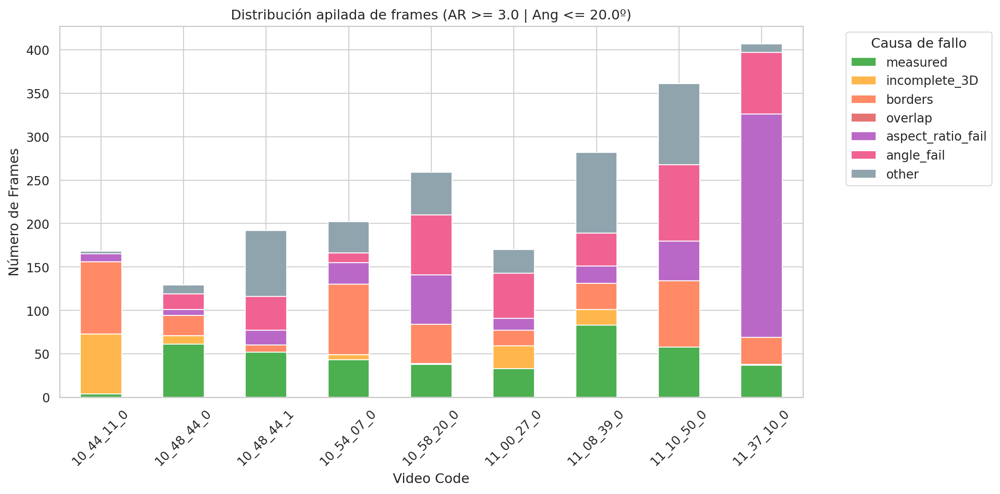

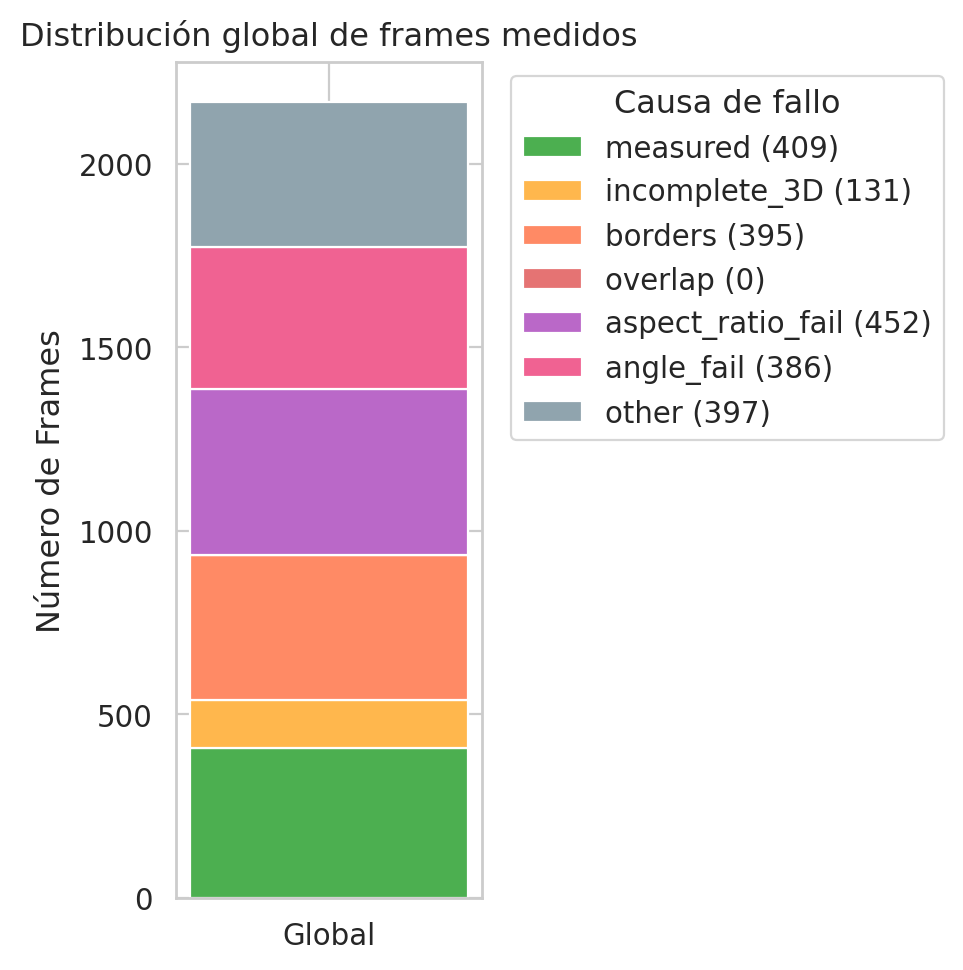


📊 TABLA 1: Distribución Global de Frames


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,409,18.85
1,incomplete_3D,131,6.04
2,borders,395,18.20
3,overlap,0,0.00
4,aspect_ratio_fail,452,20.83
5,angle_fail,386,17.79
6,other,397,18.29


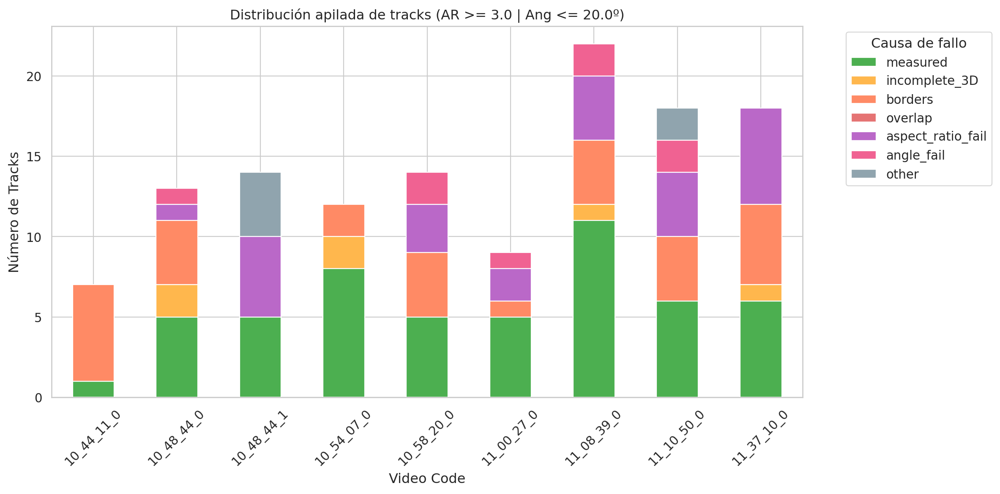

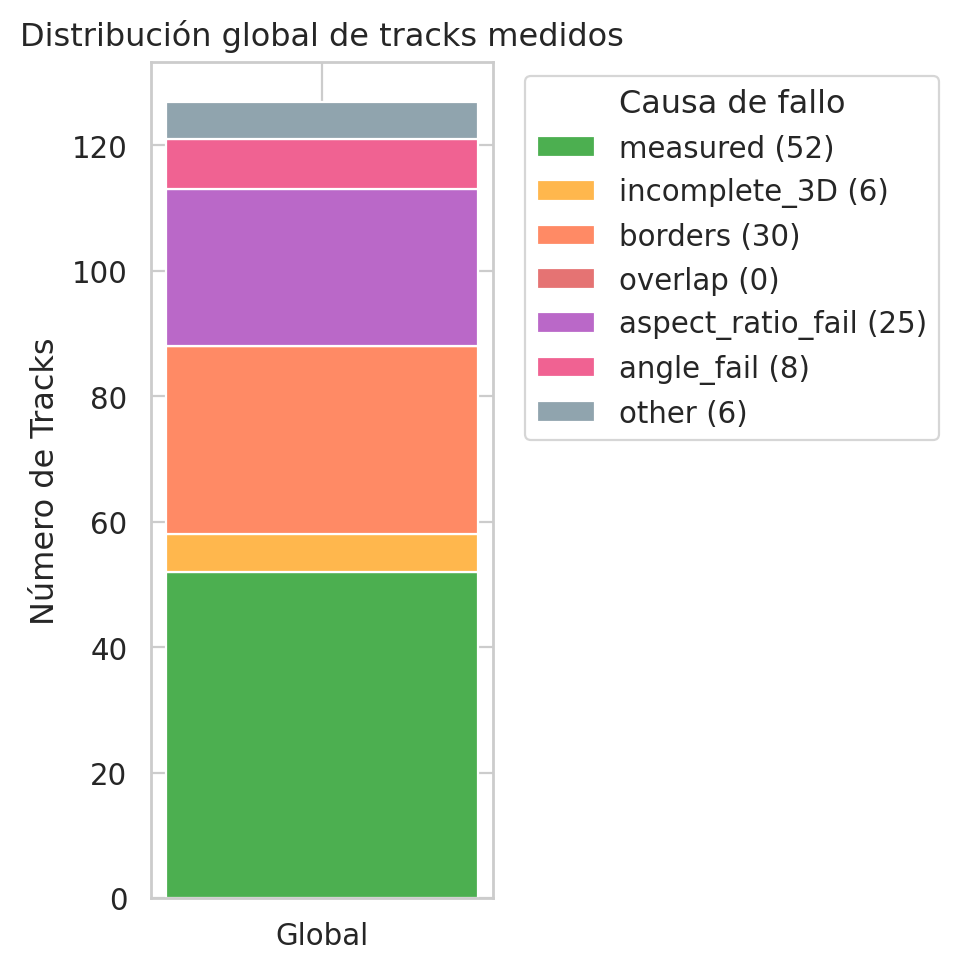


📊 TABLA 1: Distribución Global de Tracks


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,52,40.94
1,incomplete_3D,6,4.72
2,borders,30,23.62
3,overlap,0,0.00
4,aspect_ratio_fail,25,19.69
5,angle_fail,8,6.30
6,other,6,4.72



📊 TABLA 2: Desglose por Vídeo


track_failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,angle_fail,other
source_folder,,,,,,,
10_44_11_0,1,0,6,0,0,0,0
10_48_44_0,5,2,4,0,1,1,0
10_48_44_1,5,0,0,0,5,0,4
10_54_07_0,8,2,2,0,0,0,0
10_58_20_0,5,0,4,0,3,2,0
11_00_27_0,5,0,1,0,2,1,0
11_08_39_0,11,1,4,0,4,2,0
11_10_50_0,6,0,4,0,4,2,2
11_37_10_0,6,1,5,0,6,0,0


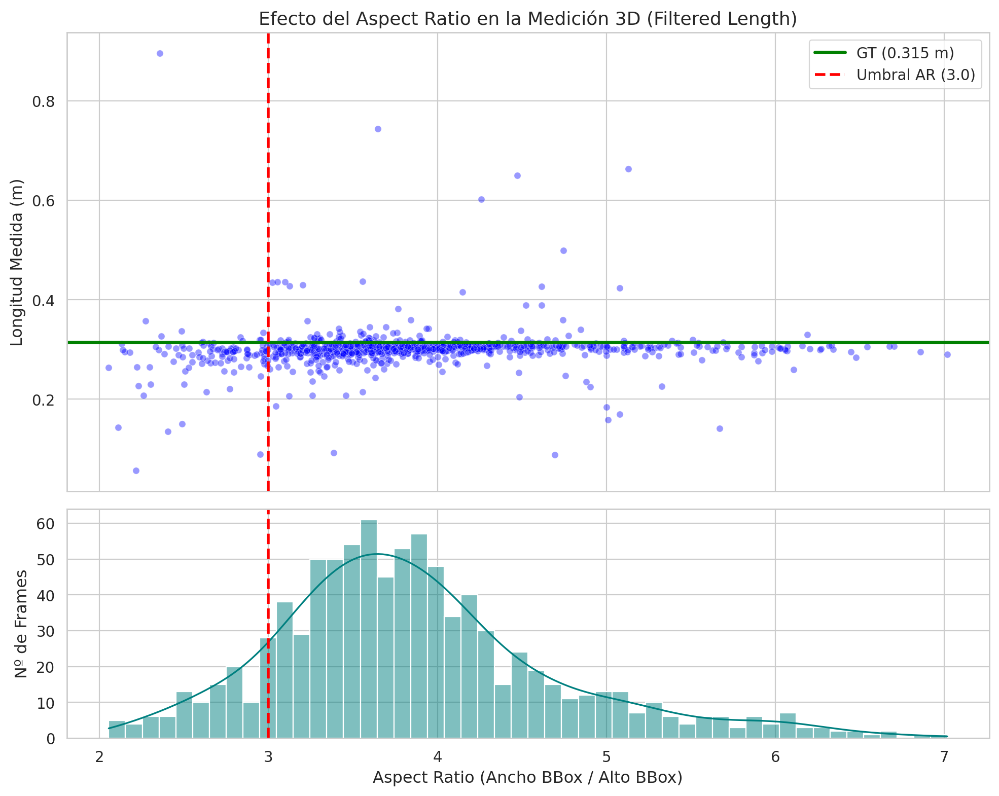

ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  1.62 ± 2.78 cm |     902 frames |    45 tracks
1. + Filtro: Sin Bordes                       |  1.62 ± 2.78 cm |     902 frames |    45 tracks
2. + Filtro: Sin Solapamiento                 |  1.62 ± 2.78 cm |     902 frames |    45 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  1.19 ± 1.91 cm |     795 frames |    40 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  1.28 ± 2.97 cm |     409 frames |    26 tracks
5. + Filtro: is_3D_complete                   |  1.28 ± 2.97 cm |     409 frames |    26 tracks


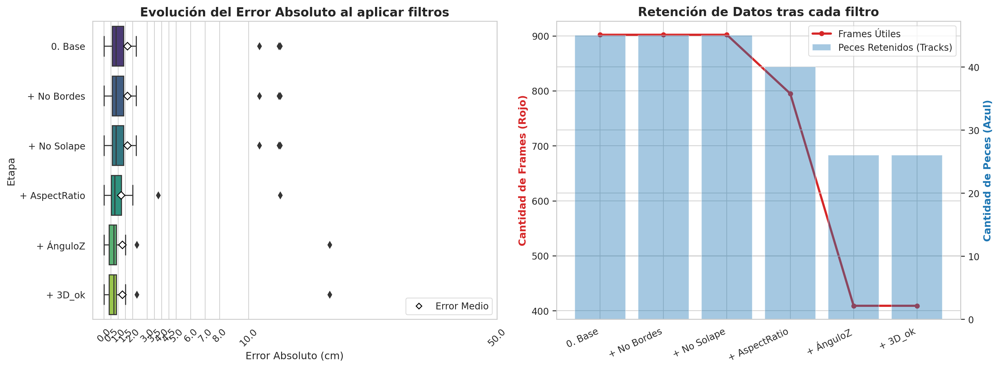

{'0. Base (HDBSCAN sin filtros)':        video_day source_folder  video_name   frame_id  class_name  object_id  \
66    2024_11_12    10_44_11_0  10_44_11_0  frame_108           0        255   
70    2024_11_12    10_44_11_0  10_44_11_0  frame_115           0        255   
72    2024_11_12    10_44_11_0  10_44_11_0  frame_118           0        255   
77    2024_11_12    10_44_11_0  10_44_11_0  frame_126           0        255   
120   2024_11_12    10_44_11_0  10_44_11_0  frame_285           0        255   
...          ...           ...         ...        ...         ...        ...   
2162  2024_11_12    10_48_44_0  10_48_44_0  frame_649           0        255   
2163  2024_11_12    10_48_44_0  10_48_44_0  frame_651           0        255   
2164  2024_11_12    10_48_44_0  10_48_44_0  frame_652           0        255   
2165  2024_11_12    10_48_44_0  10_48_44_0  frame_655           0        255   
2166  2024_11_12    10_48_44_0  10_48_44_0  frame_656           0        255   

     

In [21]:
stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,5), 
    show_global=True
)

track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 



df_results={}

stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
    df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
)

    
print(stages_dict)

## RESULTS 2024_11_28


In [ ]:
# Choose video day
day_code ="2024_11_28"
FOLDER_TO_ANALYSE = ROOT_DIR + day_code
cprint(f"processing day {day_code} of Dataset {DATASET}")
global_csv_name ="_raw_aggregated.csv"

processing day 2024_11_28 of Dataset DATASET_1/



### ALL

#### LOAD AND SUMMARY


In [63]:
print(FOLDER_TO_ANALYSE)
csv_path = os.path.join(FOLDER_TO_ANALYSE,day_code+"_raw_aggregated.csv")

csv_out_path = os.path.join(FOLDER_TO_ANALYSE)

cprint(f"Reading csv from {csv_path}", "yellow")

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)

df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head()) 

print("DF NUMERIC SUMMARY: ")
display(df_raw_agg.describe())
print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF CATEGORICAL SUMMARY: ")
categorical_cols = df_raw_agg.select_dtypes(include=['object', 'category'])
display(categorical_cols.describe())
summary = pd.DataFrame({
    'unique_values': categorical_cols.nunique(),
    'most_frequent': categorical_cols.mode().iloc[0],
    'freq': categorical_cols.apply(lambda x: x.value_counts().iloc[0]),
    'missing': categorical_cols.isnull().sum()
})
display(summary)

print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")

print("DF HEAD: ")
display(df_raw_agg.head())


/home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28
Reading csv from /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/2024_11_28_raw_aggregated.csv


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,especie_gt,abs_error_cm,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
0,2024_11_28,13_12_31_0,13_12_31_0,frame_21,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,3.866667,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
1,2024_11_28,13_12_31_0,13_12_31_0,frame_55,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,1.405559,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
2,2024_11_28,13_12_31_0,13_12_31_0,frame_89,0,255,-1,1,False,False,[],[ 0.0024459 -0.002565 0.99999],77.530540,169.017049,0.736353,0.396910,0.356903,28.9,10.790982,3733.903865,2.226773,5.990187,caballa,10.790982,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
3,2024_11_28,13_12_31_0,13_12_31_0,frame_90,0,255,-1,1,False,False,[],[ 0.03488 0.0027044 0.99939],85.783589,156.962229,0.875448,0.311949,0.372817,28.9,2.294917,794.088767,2.147475,6.568627,caballa,2.294917,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
4,2024_11_28,13_12_31_0,13_12_31_0,frame_91,0,255,4,1,False,False,[],[ -0.051677 -0.025612 0.99834],83.641111,-174.122751,0.494052,0.355393,0.386290,28.9,6.639258,2297.320975,2.150351,7.182243,caballa,6.639258,angle_fail,2024_11_28/13_12_31_0/4,single_fish,NaN,NaN,NaN


DF NUMERIC SUMMARY: 


,class_name,object_id,track_id,is_3D_complete,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,abs_error_cm
count,15141.0,15141.000000,15141.000000,15141.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,9478.000000,3216.000000,13495.000000,13904.000000,15141.000000,8946.000000
mean,0.0,208.848689,18.031900,0.963609,6.641263,19.377771,0.904697,0.256243,0.291892,23.485894,3.757190,341.575928,1.461636,4.486805,13.866632
std,0.0,64.318318,19.131454,0.187268,27.778185,64.745758,1.052608,0.316740,0.223423,21.648850,15.026192,2594.492932,0.478231,1.246041,41.398854
min,0.0,63.000000,-1.000000,0.000000,-44.856489,-179.983649,-1.000000,-1.000000,-1.000000,-100.000000,0.000200,0.009534,0.781635,1.000000,0.000000
25%,0.0,127.000000,2.000000,1.000000,-11.801443,-15.130493,0.280499,0.200809,0.201345,21.600000,0.300144,16.186019,1.072842,3.833043,0.430243
50%,0.0,255.000000,12.000000,1.000000,0.696052,1.812615,1.091485,0.276597,0.275862,28.900000,0.691429,38.486015,1.424974,4.782186,1.099186
75%,0.0,255.000000,28.000000,1.000000,19.633398,66.948179,1.745850,0.287643,0.289353,28.900000,1.887347,63.650111,1.731374,5.254571,3.600907
max,0.0,255.000000,82.000000,1.000000,88.620093,179.962087,3.129326,2.872828,2.851974,28.900000,258.382786,89405.808457,3.191157,16.386595,258.382786



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF CATEGORICAL SUMMARY: 


,video_day,source_folder,video_name,frame_id,overlapping_fish_ids,fish_direction,especie_gt,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
count,15141,15141,15141,15141,15141,12149,9478,15141,15141,15141,11832,10687,11832
unique,1,28,28,485,30,12149,4,8,373,2,2,2,2
top,2024_11_28,13-58-56_0,13-58-56_0,frame_0,[],[ 0.41926 -0.14558 0.89612],caballa,measured,2024_11_28/13-58-56_0/1,multiple_fish,True,True,True
freq,15141,1421,1421,48,15007,1,7107,6902,485,11832,11757,10279,10163


,unique_values,most_frequent,freq,missing
video_day,1,2024_11_28,15141,0
source_folder,28,13-58-56_0,1421,0
video_name,28,13-58-56_0,1421,0
frame_id,485,frame_0,48,0
overlapping_fish_ids,30,[],15007,0
fish_direction,12149,[ 1 0.0019192 0.00071097],1,2992
especie_gt,4,caballa,7107,5663
failure_reason,8,measured,6902,0
unique_track,373,2024_11_28/13-56-44_0/2,485,0
scenario,2,multiple_fish,11832,0



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF HEAD: 


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,especie_gt,abs_error_cm,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
0,2024_11_28,13_12_31_0,13_12_31_0,frame_21,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,3.866667,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
1,2024_11_28,13_12_31_0,13_12_31_0,frame_55,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,1.405559,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
2,2024_11_28,13_12_31_0,13_12_31_0,frame_89,0,255,-1,1,False,False,[],[ 0.0024459 -0.002565 0.99999],77.530540,169.017049,0.736353,0.396910,0.356903,28.9,10.790982,3733.903865,2.226773,5.990187,caballa,10.790982,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
3,2024_11_28,13_12_31_0,13_12_31_0,frame_90,0,255,-1,1,False,False,[],[ 0.03488 0.0027044 0.99939],85.783589,156.962229,0.875448,0.311949,0.372817,28.9,2.294917,794.088767,2.147475,6.568627,caballa,2.294917,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
4,2024_11_28,13_12_31_0,13_12_31_0,frame_91,0,255,4,1,False,False,[],[ -0.051677 -0.025612 0.99834],83.641111,-174.122751,0.494052,0.355393,0.386290,28.9,6.639258,2297.320975,2.150351,7.182243,caballa,6.639258,angle_fail,2024_11_28/13_12_31_0/4,single_fish,NaN,NaN,NaN


#### RESULTS SUMMARY

##### FRAMES SUMMARY

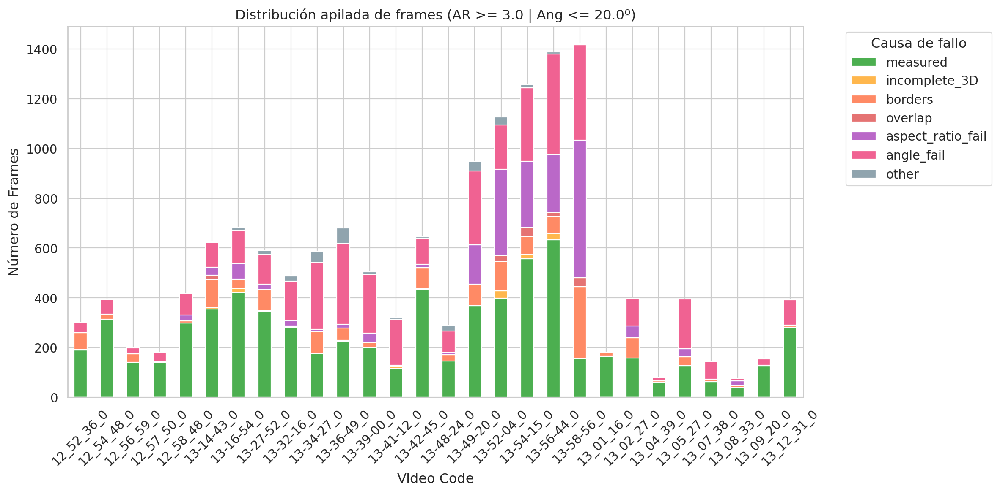

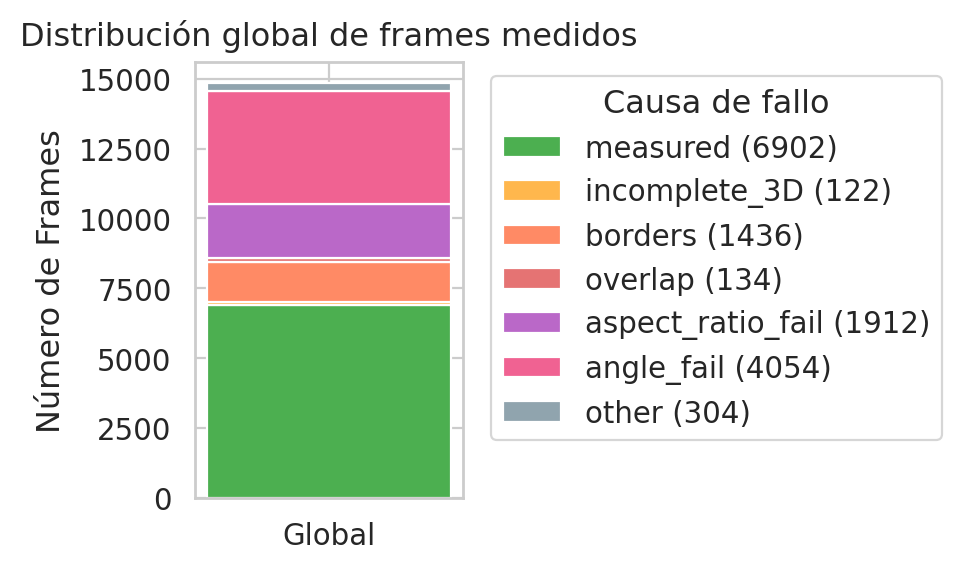


📊 TABLA 1: Distribución Global de Frames


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,6902,46.43
1,incomplete_3D,122,0.82
2,borders,1436,9.66
3,overlap,134,0.90
4,aspect_ratio_fail,1912,12.86
5,angle_fail,4054,27.27
6,other,304,2.05


In [64]:
stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,3), 
    show_global=True
)



##### TRACKS SUMMARY

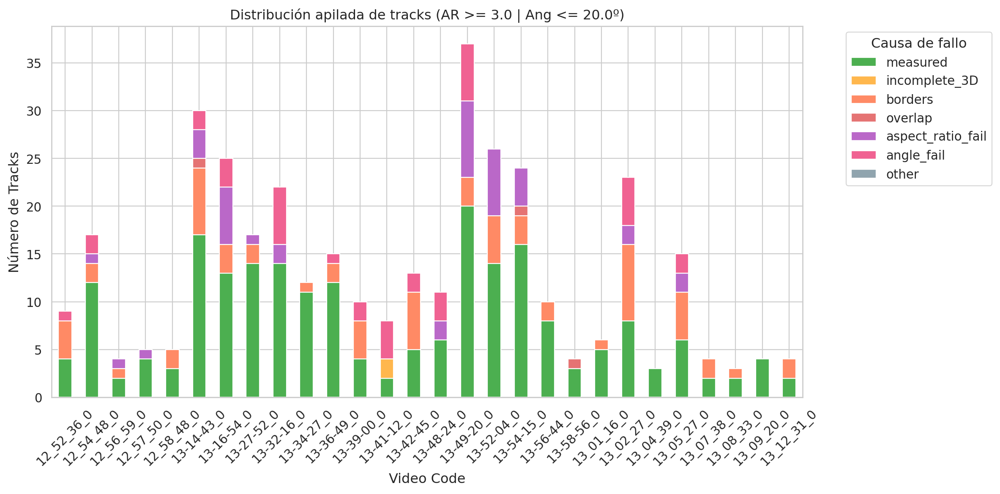

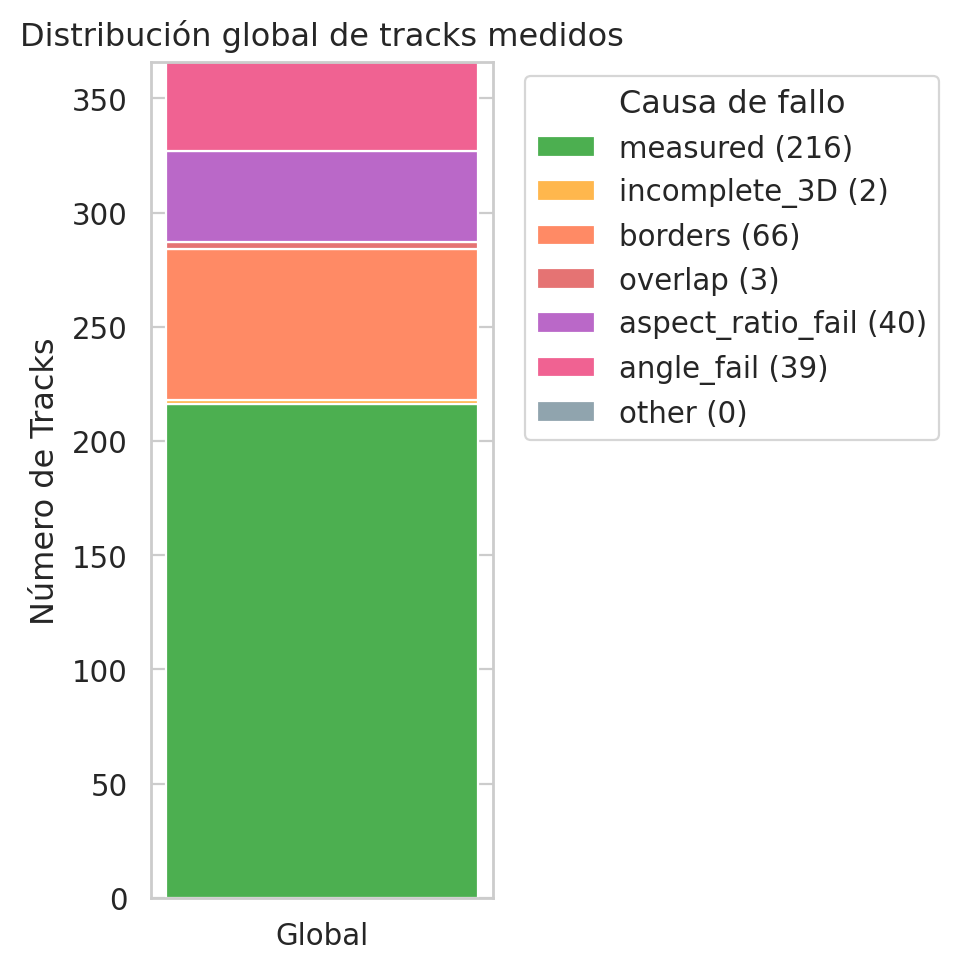


📊 TABLA 1: Distribución Global de Tracks


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,216,59.02
1,incomplete_3D,2,0.55
2,borders,66,18.03
3,overlap,3,0.82
4,aspect_ratio_fail,40,10.93
5,angle_fail,39,10.66
6,other,0,0.00



📊 TABLA 2: Desglose por Vídeo


track_failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,angle_fail,other
source_folder,,,,,,,
12_52_36_0,4,0,4,0,0,1,0
12_54_48_0,12,0,2,0,1,2,0
12_56_59_0,2,0,1,0,1,0,0
12_57_50_0,4,0,0,0,1,0,0
12_58_48_0,3,0,2,0,0,0,0
13-14-43_0,17,0,7,1,3,2,0
13-16-54_0,13,0,3,0,6,3,0
13-27-52_0,14,0,2,0,1,0,0
13-32-16_0,14,0,0,0,2,6,0


In [65]:
track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

##### ASPECT RATIO PLOT

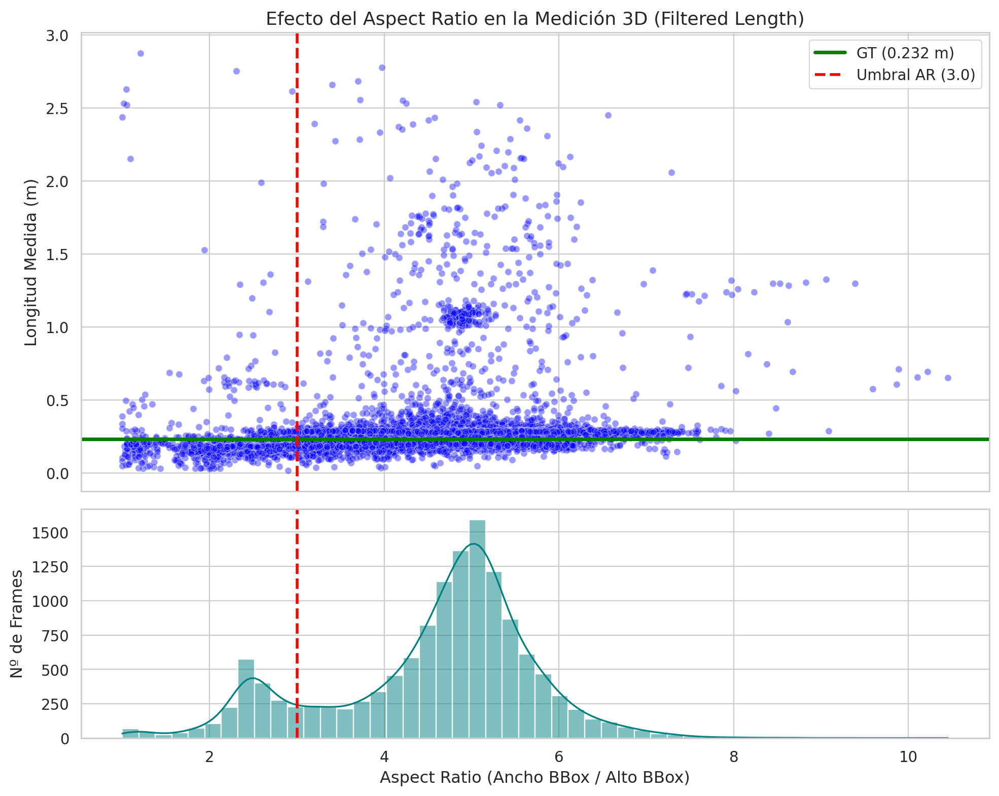

In [66]:
rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 

##### ASPECT RATIO AND ANGLE THR IMPACT ON ERROR

Evaluating Angles: 100%|██████████| 6/6 [00:08<00:00,  1.50s/it]


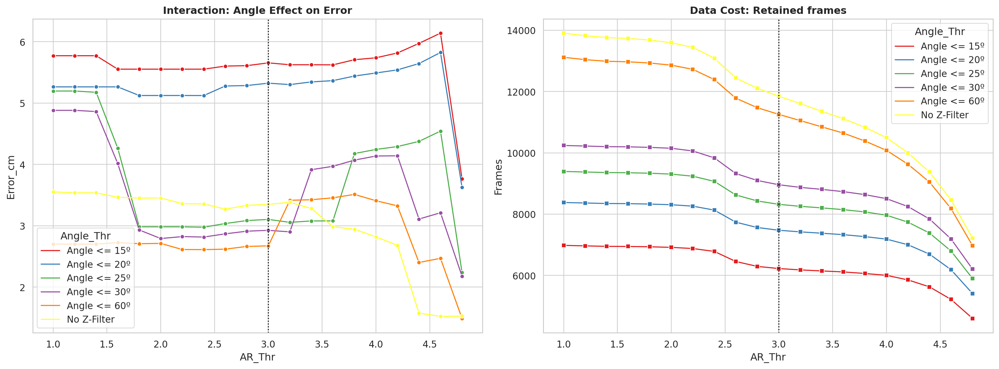

,Angle_Thr,AR_Thr,Error_cm,Frames,Tracks
0,Angle <= 15º,1.0,5.771526,6982,107
1,Angle <= 15º,1.2,5.771526,6966,107
2,Angle <= 15º,1.4,5.771526,6950,107
3,Angle <= 15º,1.6,5.552291,6947,107
4,Angle <= 15º,1.8,5.552291,6936,107
...,...,...,...,...,...
115,No Z-Filter,4.0,2.819224,10495,139
116,No Z-Filter,4.2,2.679480,9998,133
117,No Z-Filter,4.4,1.575009,9374,127
118,No Z-Filter,4.6,1.522151,8461,123


In [72]:
rutils.plot_thresholds_interaction(df_raw_agg, ar_range=None, angles_to_test=None, optimal_ar=3)

##### RESULTS 

ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  3.10 ± 6.73 cm |   13495 frames |   166 tracks
1. + Filtro: Sin Bordes                       |  2.56 ± 5.69 cm |   13275 frames |   158 tracks
2. + Filtro: Sin Solapamiento                 |  2.56 ± 5.69 cm |   13143 frames |   158 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  2.41 ± 5.54 cm |   11277 frames |   149 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  1.00 ± 1.29 cm |    6999 frames |   106 tracks
5. + Filtro: is_3D_complete                   |  0.97 ± 1.28 cm |    6904 frames |   105 tracks


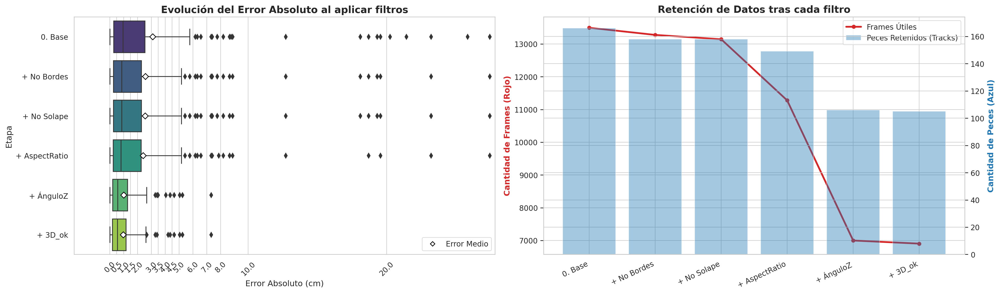

In [67]:

# CALCULATE METRICS AND PLOTS
df_results={}

stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
    df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
)
 
# display(stages_dict)



##### ERROR ANALYSIS

In [ ]:
# rutils.plot_final_error_analysis(df_raw_agg, top_n_outliers=15, figsize=(18, 14), title="Análisis Profundo del Error en la Etapa Final (3D Complete)")

KeyboardInterrupt: 

##### SAVE RESULTS

In [68]:
#-----------------------------------------

# SAVE SUMMARY:
# 1. Extraer el DataFrame agregado de la última etapa (Todos los filtros aplicados)
# El nombre exacto de la llave depende de las variables que le pasaste
ultima_etapa_key = "5. + Filtro: is_3D_complete"
df_final = agg_stages_dict[ultima_etapa_key].copy()

# 2. Eliminar todos los peces con track_id == -1 (Convertimos a string por si acaso)
df_final = df_final[~df_final['track_id'].astype(str).isin(['-1', '-1.0'])]

# 3. Exigir estrictamente que tengan MÁS de 5 frames de track válidos
df_final = df_final[df_final['n_frames_validos'] > 5]

# 4. Crear de nuevo el identificador único para que te sea fácil de leer
df_final['unique_track'] = df_final['video_day'].astype(str) + "_" + df_final['source_folder'].astype(str) + "_" + df_final['track_id'].astype(str)

# 5. Ordenar el dataframe (opcional, para que quede bonito)
df_final = df_final.sort_values(by=['video_day', 'source_folder', 'track_id']).reset_index(drop=True)

# Reordenar las columnas para que el identificador quede primero
cols = ['unique_track', 'video_day', 'source_folder', 'track_id', 'n_frames_validos', 'calculated_length_cm', 'gt_cm', 'abs_error_cm', 'mean_elevation_deg']
df_final = df_final[cols]

cprint(f"🎯 Peces finales válidos y filtrados: {len(df_final)}", "green", attrs=["bold"])
display(df_final)

# ==========================================================
# 💾 GUARDAR 1: El listado completo de peces (Summary)
# ==========================================================
summary_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_summary.csv")
df_final.to_csv(summary_path, index=False)
cprint(f"✅ Listado de tracks guardado en: {summary_path}", "green")

# ==========================================================
# 📊 CALCULAR Y GUARDAR 2: Las Métricas Globales (Metrics)
# ==========================================================
metrics_data = {
    "Total_Peces_Retenidos": [len(df_final)],
    "Promedio_Frames_Validos": [round(df_final['n_frames_validos'].mean(), 1) if not df_final.empty else 0],
    "Error_Absoluto_Medio_cm": [round(df_final['abs_error_cm'].mean(), 2) if not df_final.empty else 0],
    "Desviacion_Estandar_Error_cm": [round(df_final['abs_error_cm'].std(), 2) if not df_final.empty else 0]
}

df_metrics = pd.DataFrame(metrics_data)


print("\n📊 TABLA DE MÉTRICAS GLOBALES:")
display(df_metrics)

metrics_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_metrics.csv")
df_metrics.to_csv(metrics_path, index=False)
cprint(f"✅ Métricas globales guardadas en: {metrics_path}", "green")

🎯 Peces finales válidos y filtrados: 96


,unique_track,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
0,2024_11_28_12_52_36_0_7,2024_11_28,12_52_36_0,7,124.0,28.835827,28.9,0.064173,-9.549284
1,2024_11_28_12_52_36_0_12,2024_11_28,12_52_36_0,12,33.0,30.385976,28.9,1.485976,-2.683733
2,2024_11_28_12_52_36_0_17,2024_11_28,12_52_36_0,17,30.0,29.053652,28.9,0.153652,-2.005986
3,2024_11_28_12_54_48_0_1,2024_11_28,12_54_48_0,1,8.0,28.420438,28.9,0.479562,-11.072974
4,2024_11_28_12_54_48_0_12,2024_11_28,12_54_48_0,12,87.0,28.802779,28.9,0.097221,-9.063226
...,...,...,...,...,...,...,...,...,...
91,2024_11_28_13_07_38_0_1,2024_11_28,13_07_38_0,1,21.0,28.936125,28.9,0.036125,0.874922
92,2024_11_28_13_07_38_0_13,2024_11_28,13_07_38_0,13,41.0,29.310660,28.9,0.410660,-6.729009
93,2024_11_28_13_08_33_0_1,2024_11_28,13_08_33_0,1,37.0,29.922915,28.9,1.022915,1.804097
94,2024_11_28_13_09_20_0_3,2024_11_28,13_09_20_0,3,121.0,30.822081,28.9,1.922081,-8.044878


✅ Listado de tracks guardado en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/2024_11_28_single_fish_filtered_measures_summary.csv

📊 TABLA DE MÉTRICAS GLOBALES:


,Total_Peces_Retenidos,Promedio_Frames_Validos,Error_Absoluto_Medio_cm,Desviacion_Estandar_Error_cm
0,96,51.3,1.01,1.32


✅ Métricas globales guardadas en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/2024_11_28_single_fish_filtered_measures_metrics.csv



### SINGLE FISH

#### LOAD AND SUMMARY


In [70]:
group = "single_fish"
print(FOLDER_TO_ANALYSE)
csv_path = os.path.join(FOLDER_TO_ANALYSE,group,
                        day_code+"_"+group+"_agg.csv")

csv_out_path = os.path.join(FOLDER_TO_ANALYSE,group)

cprint(f"Reading csv from {csv_path}", "yellow")

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)


df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head()) 

print("DF NUMERIC SUMMARY: ")
display(df_raw_agg.describe())
print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF CATEGORICAL SUMMARY: ")
categorical_cols = df_raw_agg.select_dtypes(include=['object', 'category'])
display(categorical_cols.describe())
summary = pd.DataFrame({
    'unique_values': categorical_cols.nunique(),
    'most_frequent': categorical_cols.mode().iloc[0],
    'freq': categorical_cols.apply(lambda x: x.value_counts().iloc[0]),
    'missing': categorical_cols.isnull().sum()
})
display(summary)

print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")

print("DF HEAD: ")
display(df_raw_agg.head())


/home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28
Reading csv from /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2025_08_21_single_fish_agg.csv


FileNotFoundError: [Errno 2] No such file or directory: '/home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2025_08_21_single_fish_agg.csv'

#### RESULTS SUMMARY

##### FRAMES SUMMARY

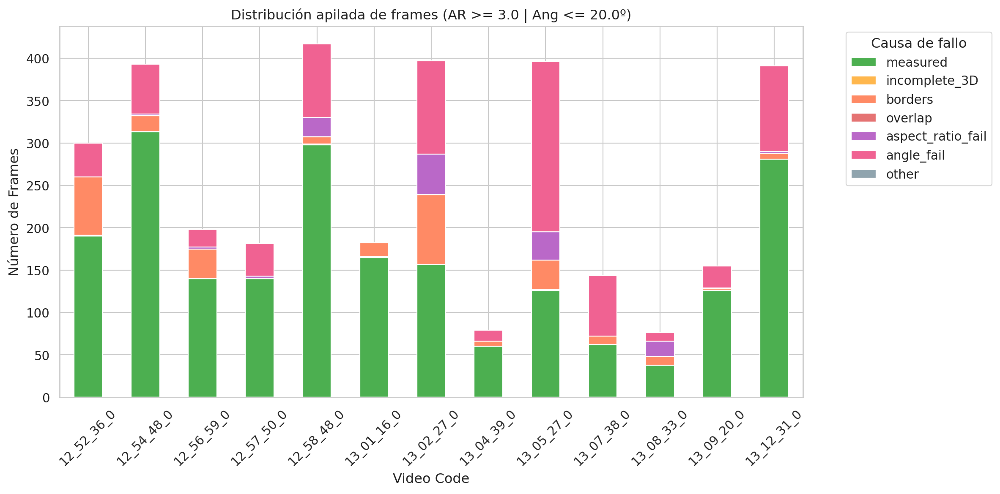

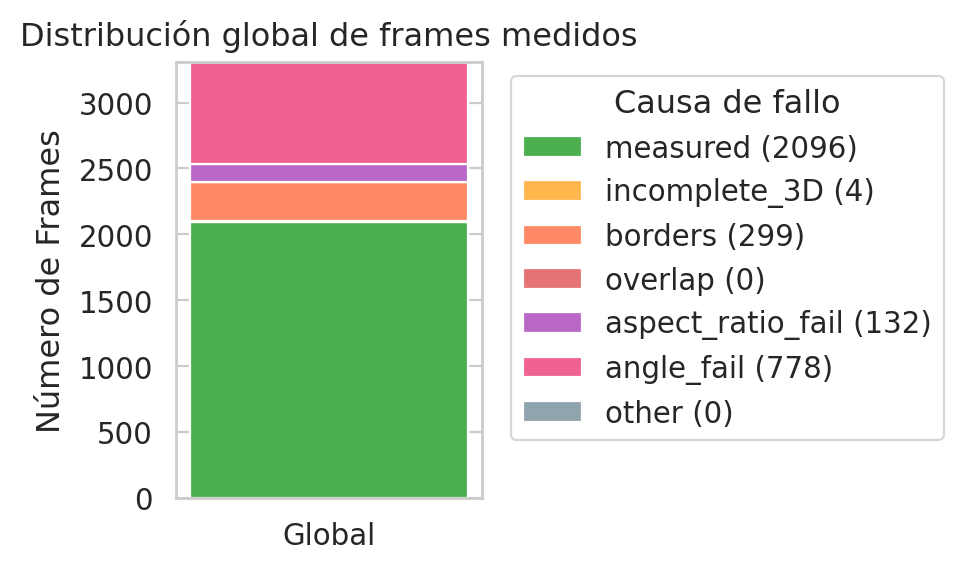


📊 TABLA 1: Distribución Global de Frames


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,2096,63.34
1,incomplete_3D,4,0.12
2,borders,299,9.04
3,overlap,0,0.00
4,aspect_ratio_fail,132,3.99
5,angle_fail,778,23.51
6,other,0,0.00


In [ ]:
stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,3), 
    show_global=True
)

##### TRACKS SUMMARY

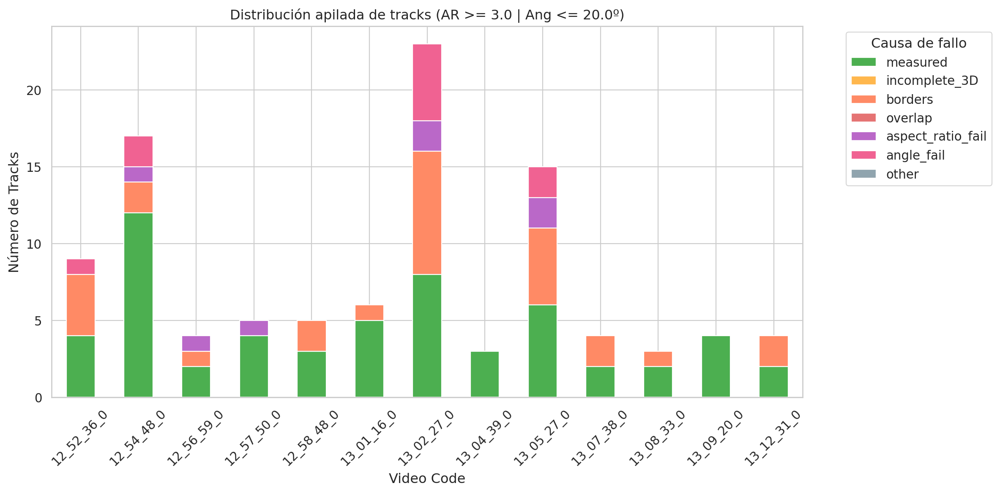

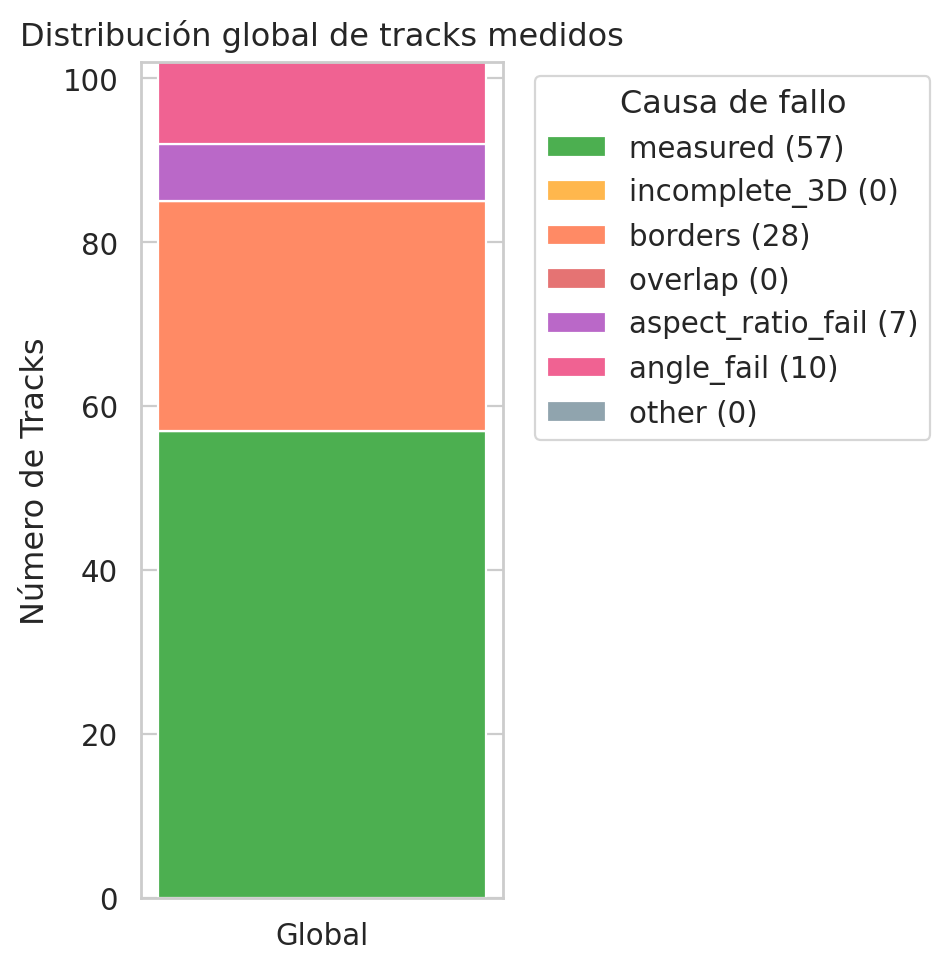


📊 TABLA 1: Distribución Global de Tracks


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,57,55.88
1,incomplete_3D,0,0.00
2,borders,28,27.45
3,overlap,0,0.00
4,aspect_ratio_fail,7,6.86
5,angle_fail,10,9.80
6,other,0,0.00



📊 TABLA 2: Desglose por Vídeo


track_failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,angle_fail,other
source_folder,,,,,,,
12_52_36_0,4,0,4,0,0,1,0
12_54_48_0,12,0,2,0,1,2,0
12_56_59_0,2,0,1,0,1,0,0
12_57_50_0,4,0,0,0,1,0,0
12_58_48_0,3,0,2,0,0,0,0
13_01_16_0,5,0,1,0,0,0,0
13_02_27_0,8,0,8,0,2,5,0
13_04_39_0,3,0,0,0,0,0,0
13_05_27_0,6,0,5,0,2,2,0


In [ ]:
track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

##### ASPECT RATIO PLOT

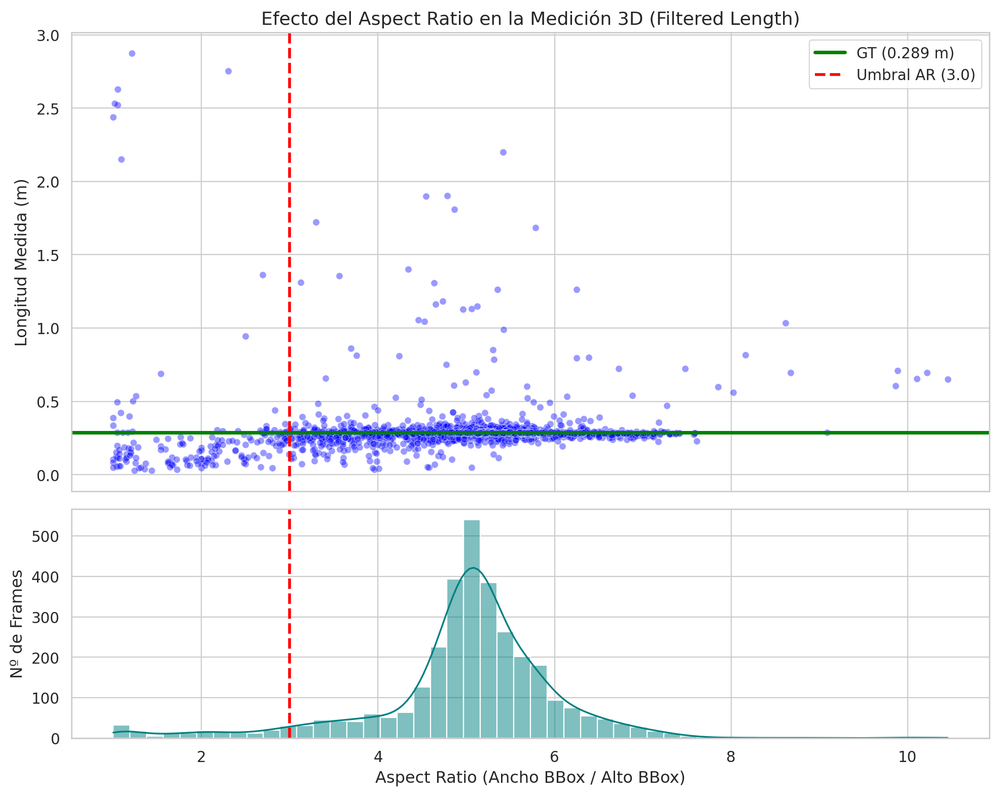

In [ ]:
rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 

#### ASPECT RATIO AND ANGLE THR IMPACT ON ERROR

In [ ]:
rutils.plot_thresholds_interaction(df_raw_agg, ar_range=None, angles_to_test=None, optimal_ar=3)

##### RESULTS 

ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  3.70 ± 7.49 cm |    3216 frames |    62 tracks
1. + Filtro: Sin Bordes                       |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
2. + Filtro: Sin Solapamiento                 |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  1.57 ± 3.10 cm |    2876 frames |    52 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  0.67 ± 1.00 cm |    2098 frames |    38 tracks
5. + Filtro: is_3D_complete                   |  0.67 ± 1.00 cm |    2096 frames |    38 tracks


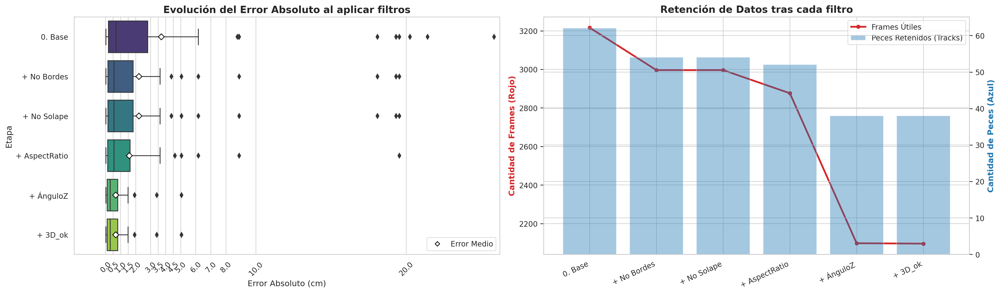

In [ ]:

# CALCULATE METRICS AND PLOTS
df_results={}

stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
    df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
)
 
# display(stages_dict)



##### SAVE RESULTS

In [71]:
#-----------------------------------------

# SAVE SUMMARY:
# 1. Extraer el DataFrame agregado de la última etapa (Todos los filtros aplicados)
# El nombre exacto de la llave depende de las variables que le pasaste
ultima_etapa_key = "5. + Filtro: is_3D_complete"
df_final = agg_stages_dict[ultima_etapa_key].copy()

# 2. Eliminar todos los peces con track_id == -1 (Convertimos a string por si acaso)
df_final = df_final[~df_final['track_id'].astype(str).isin(['-1', '-1.0'])]

# 3. Exigir estrictamente que tengan MÁS de 5 frames de track válidos
df_final = df_final[df_final['n_frames_validos'] > 5]

# 4. Crear de nuevo el identificador único para que te sea fácil de leer
df_final['unique_track'] = df_final['video_day'].astype(str) + "_" + df_final['source_folder'].astype(str) + "_" + df_final['track_id'].astype(str)

# 5. Ordenar el dataframe (opcional, para que quede bonito)
df_final = df_final.sort_values(by=['video_day', 'source_folder', 'track_id']).reset_index(drop=True)

# Reordenar las columnas para que el identificador quede primero
cols = ['unique_track', 'video_day', 'source_folder', 'track_id', 'n_frames_validos', 'calculated_length_cm', 'gt_cm', 'abs_error_cm', 'mean_elevation_deg']
df_final = df_final[cols]

cprint(f"🎯 Peces finales válidos y filtrados: {len(df_final)}", "green", attrs=["bold"])
display(df_final)

# ==========================================================
# 💾 GUARDAR 1: El listado completo de peces (Summary)
# ==========================================================
summary_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_summary.csv")
df_final.to_csv(summary_path, index=False)
cprint(f"✅ Listado de tracks guardado en: {summary_path}", "green")

# ==========================================================
# 📊 CALCULAR Y GUARDAR 2: Las Métricas Globales (Metrics)
# ==========================================================
metrics_data = {
    "Total_Peces_Retenidos": [len(df_final)],
    "Promedio_Frames_Validos": [round(df_final['n_frames_validos'].mean(), 1) if not df_final.empty else 0],
    "Error_Absoluto_Medio_cm": [round(df_final['abs_error_cm'].mean(), 2) if not df_final.empty else 0],
    "Desviacion_Estandar_Error_cm": [round(df_final['abs_error_cm'].std(), 2) if not df_final.empty else 0]
}

df_metrics = pd.DataFrame(metrics_data)


print("\n📊 TABLA DE MÉTRICAS GLOBALES:")
display(df_metrics)

metrics_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_metrics.csv")
df_metrics.to_csv(metrics_path, index=False)
cprint(f"✅ Métricas globales guardadas en: {metrics_path}", "green")

🎯 Peces finales válidos y filtrados: 96


,unique_track,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
0,2024_11_28_12_52_36_0_7,2024_11_28,12_52_36_0,7,124.0,28.835827,28.9,0.064173,-9.549284
1,2024_11_28_12_52_36_0_12,2024_11_28,12_52_36_0,12,33.0,30.385976,28.9,1.485976,-2.683733
2,2024_11_28_12_52_36_0_17,2024_11_28,12_52_36_0,17,30.0,29.053652,28.9,0.153652,-2.005986
3,2024_11_28_12_54_48_0_1,2024_11_28,12_54_48_0,1,8.0,28.420438,28.9,0.479562,-11.072974
4,2024_11_28_12_54_48_0_12,2024_11_28,12_54_48_0,12,87.0,28.802779,28.9,0.097221,-9.063226
...,...,...,...,...,...,...,...,...,...
91,2024_11_28_13_07_38_0_1,2024_11_28,13_07_38_0,1,21.0,28.936125,28.9,0.036125,0.874922
92,2024_11_28_13_07_38_0_13,2024_11_28,13_07_38_0,13,41.0,29.310660,28.9,0.410660,-6.729009
93,2024_11_28_13_08_33_0_1,2024_11_28,13_08_33_0,1,37.0,29.922915,28.9,1.022915,1.804097
94,2024_11_28_13_09_20_0_3,2024_11_28,13_09_20_0,3,121.0,30.822081,28.9,1.922081,-8.044878


✅ Listado de tracks guardado en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2025_08_21_single_fish_filtered_measures_summary.csv

📊 TABLA DE MÉTRICAS GLOBALES:


,Total_Peces_Retenidos,Promedio_Frames_Validos,Error_Absoluto_Medio_cm,Desviacion_Estandar_Error_cm
0,96,51.3,1.01,1.32


✅ Métricas globales guardadas en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2025_08_21_single_fish_filtered_measures_metrics.csv


### MULTIPLE FISH

#### LOAD AND SUMMARY


In [ ]:
group = "multiple_fish"
print(FOLDER_TO_ANALYSE)
csv_path = os.path.join(FOLDER_TO_ANALYSE,group,
                        day_code+"_"+group+"_agg.csv")

csv_out_path = os.path.join(FOLDER_TO_ANALYSE,group)

cprint(f"Reading csv from {csv_path}", "yellow")

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)

df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head()) 

print("DF NUMERIC SUMMARY: ")
display(df_raw_agg.describe())
print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF CATEGORICAL SUMMARY: ")
categorical_cols = df_raw_agg.select_dtypes(include=['object', 'category'])
display(categorical_cols.describe())
summary = pd.DataFrame({
    'unique_values': categorical_cols.nunique(),
    'most_frequent': categorical_cols.mode().iloc[0],
    'freq': categorical_cols.apply(lambda x: x.value_counts().iloc[0]),
    'missing': categorical_cols.isnull().sum()
})
display(summary)

print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")

print("DF HEAD: ")
display(df_raw_agg.head())


/home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28
Reading csv from /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/2024_11_28_raw_aggregated.csv


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,especie_gt,abs_error_cm,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
0,2024_11_28,13_12_31_0,13_12_31_0,frame_21,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,3.866667,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
1,2024_11_28,13_12_31_0,13_12_31_0,frame_55,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,1.405559,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
2,2024_11_28,13_12_31_0,13_12_31_0,frame_89,0,255,-1,1,False,False,[],[ 0.0024459 -0.002565 0.99999],77.530540,169.017049,0.736353,0.396910,0.356903,28.9,10.790982,3733.903865,2.226773,5.990187,caballa,10.790982,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
3,2024_11_28,13_12_31_0,13_12_31_0,frame_90,0,255,-1,1,False,False,[],[ 0.03488 0.0027044 0.99939],85.783589,156.962229,0.875448,0.311949,0.372817,28.9,2.294917,794.088767,2.147475,6.568627,caballa,2.294917,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
4,2024_11_28,13_12_31_0,13_12_31_0,frame_91,0,255,4,1,False,False,[],[ -0.051677 -0.025612 0.99834],83.641111,-174.122751,0.494052,0.355393,0.386290,28.9,6.639258,2297.320975,2.150351,7.182243,caballa,6.639258,angle_fail,2024_11_28/13_12_31_0/4,single_fish,NaN,NaN,NaN


DF NUMERIC SUMMARY: 


,class_name,object_id,track_id,is_3D_complete,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,abs_error_cm
count,15141.0,15141.000000,15141.000000,15141.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,9478.000000,3216.000000,13495.000000,13904.000000,15141.000000,8946.000000
mean,0.0,208.848689,18.031900,0.963609,6.641263,19.377771,0.904697,0.256243,0.291892,23.485894,3.757190,341.575928,1.461636,4.486805,13.866632
std,0.0,64.318318,19.131454,0.187268,27.778185,64.745758,1.052608,0.316740,0.223423,21.648850,15.026192,2594.492932,0.478231,1.246041,41.398854
min,0.0,63.000000,-1.000000,0.000000,-44.856489,-179.983649,-1.000000,-1.000000,-1.000000,-100.000000,0.000200,0.009534,0.781635,1.000000,0.000000
25%,0.0,127.000000,2.000000,1.000000,-11.801443,-15.130493,0.280499,0.200809,0.201345,21.600000,0.300144,16.186019,1.072842,3.833043,0.430243
50%,0.0,255.000000,12.000000,1.000000,0.696052,1.812615,1.091485,0.276597,0.275862,28.900000,0.691429,38.486015,1.424974,4.782186,1.099186
75%,0.0,255.000000,28.000000,1.000000,19.633398,66.948179,1.745850,0.287643,0.289353,28.900000,1.887347,63.650111,1.731374,5.254571,3.600907
max,0.0,255.000000,82.000000,1.000000,88.620093,179.962087,3.129326,2.872828,2.851974,28.900000,258.382786,89405.808457,3.191157,16.386595,258.382786



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF CATEGORICAL SUMMARY: 


,video_day,source_folder,video_name,frame_id,overlapping_fish_ids,fish_direction,especie_gt,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
count,15141,15141,15141,15141,15141,12149,9478,15141,15141,15141,11832,10687,11832
unique,1,28,28,485,30,12149,4,8,373,2,2,2,2
top,2024_11_28,13-58-56_0,13-58-56_0,frame_0,[],[ 0.41926 -0.14558 0.89612],caballa,measured,2024_11_28/13-58-56_0/1,multiple_fish,True,True,True
freq,15141,1421,1421,48,15007,1,7107,6902,485,11832,11757,10279,10163


,unique_values,most_frequent,freq,missing
video_day,1,2024_11_28,15141,0
source_folder,28,13-58-56_0,1421,0
video_name,28,13-58-56_0,1421,0
frame_id,485,frame_0,48,0
overlapping_fish_ids,30,[],15007,0
fish_direction,12149,[ 1 0.0019192 0.00071097],1,2992
especie_gt,4,caballa,7107,5663
failure_reason,8,measured,6902,0
unique_track,373,2024_11_28/13-56-44_0/2,485,0
scenario,2,multiple_fish,11832,0



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF HEAD: 


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,especie_gt,abs_error_cm,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
0,2024_11_28,13_12_31_0,13_12_31_0,frame_21,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,3.866667,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
1,2024_11_28,13_12_31_0,13_12_31_0,frame_55,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,1.405559,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
2,2024_11_28,13_12_31_0,13_12_31_0,frame_89,0,255,-1,1,False,False,[],[ 0.0024459 -0.002565 0.99999],77.530540,169.017049,0.736353,0.396910,0.356903,28.9,10.790982,3733.903865,2.226773,5.990187,caballa,10.790982,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
3,2024_11_28,13_12_31_0,13_12_31_0,frame_90,0,255,-1,1,False,False,[],[ 0.03488 0.0027044 0.99939],85.783589,156.962229,0.875448,0.311949,0.372817,28.9,2.294917,794.088767,2.147475,6.568627,caballa,2.294917,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
4,2024_11_28,13_12_31_0,13_12_31_0,frame_91,0,255,4,1,False,False,[],[ -0.051677 -0.025612 0.99834],83.641111,-174.122751,0.494052,0.355393,0.386290,28.9,6.639258,2297.320975,2.150351,7.182243,caballa,6.639258,angle_fail,2024_11_28/13_12_31_0/4,single_fish,NaN,NaN,NaN


#### RESULTS SUMMARY

##### FRAMES SUMMARY

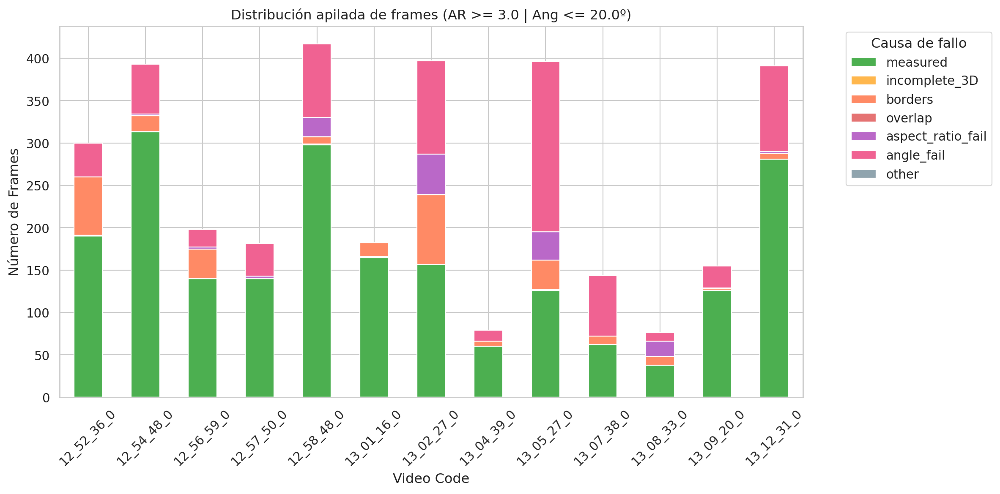

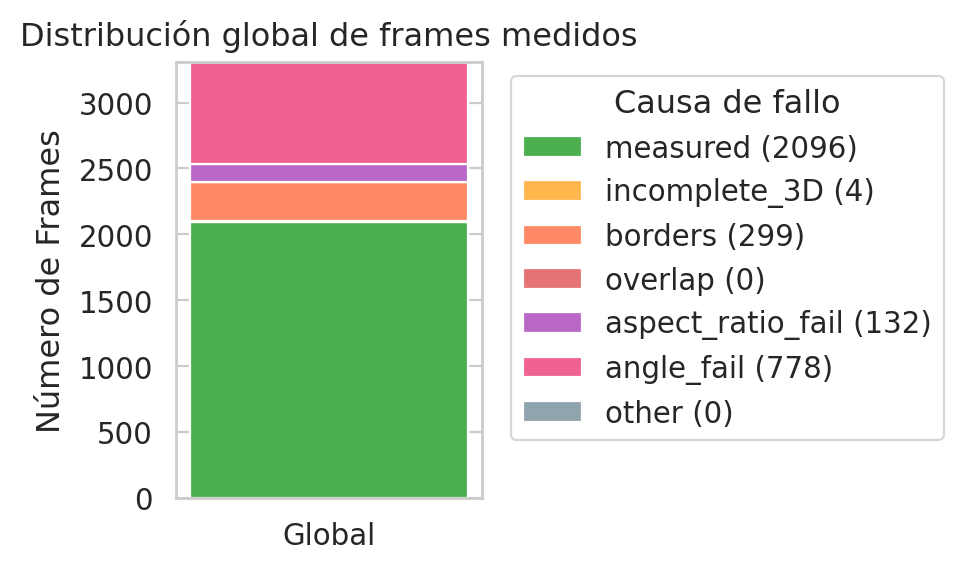


📊 TABLA 1: Distribución Global de Frames


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,2096,63.34
1,incomplete_3D,4,0.12
2,borders,299,9.04
3,overlap,0,0.00
4,aspect_ratio_fail,132,3.99
5,angle_fail,778,23.51
6,other,0,0.00


In [ ]:
stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,3), 
    show_global=True
)



##### TRACKS SUMMARY

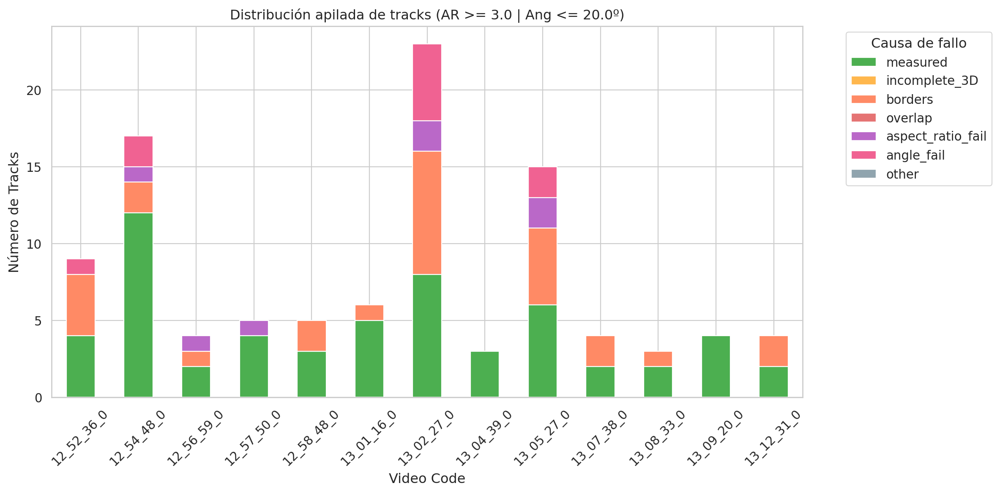

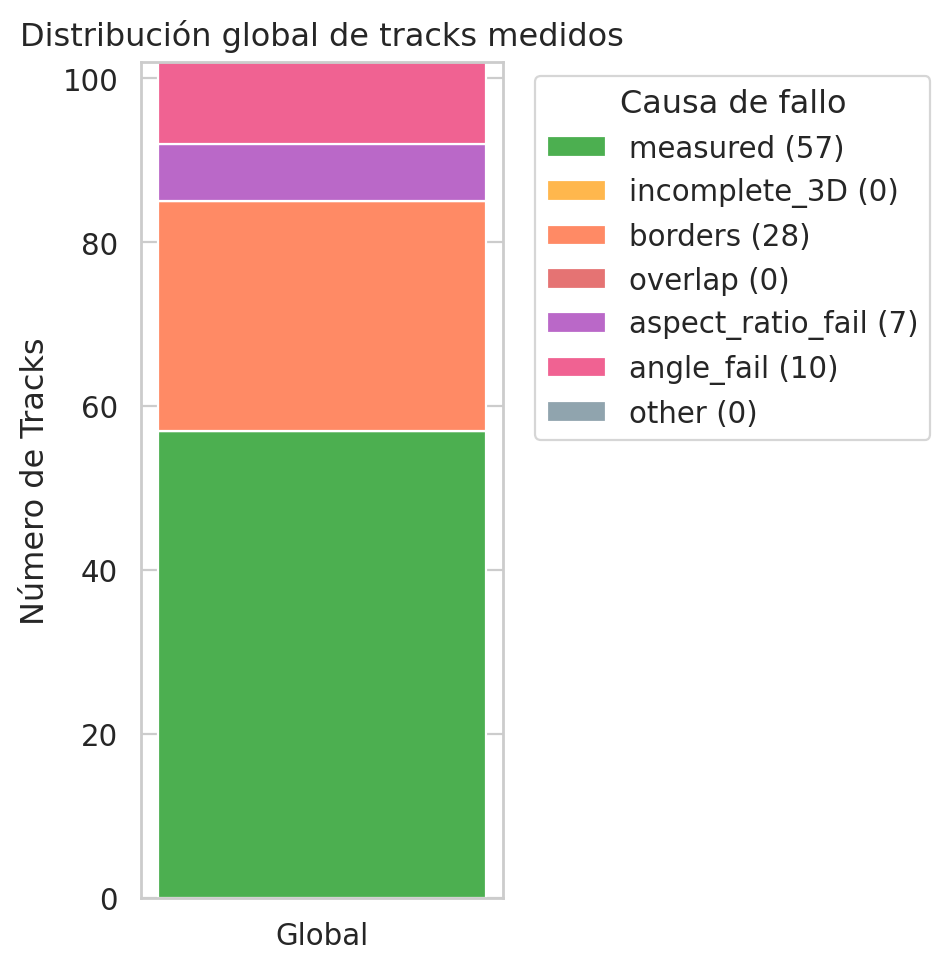


📊 TABLA 1: Distribución Global de Tracks


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,57,55.88
1,incomplete_3D,0,0.00
2,borders,28,27.45
3,overlap,0,0.00
4,aspect_ratio_fail,7,6.86
5,angle_fail,10,9.80
6,other,0,0.00



📊 TABLA 2: Desglose por Vídeo


track_failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,angle_fail,other
source_folder,,,,,,,
12_52_36_0,4,0,4,0,0,1,0
12_54_48_0,12,0,2,0,1,2,0
12_56_59_0,2,0,1,0,1,0,0
12_57_50_0,4,0,0,0,1,0,0
12_58_48_0,3,0,2,0,0,0,0
13_01_16_0,5,0,1,0,0,0,0
13_02_27_0,8,0,8,0,2,5,0
13_04_39_0,3,0,0,0,0,0,0
13_05_27_0,6,0,5,0,2,2,0


In [ ]:
track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

##### ASPECT RATIO PLOT

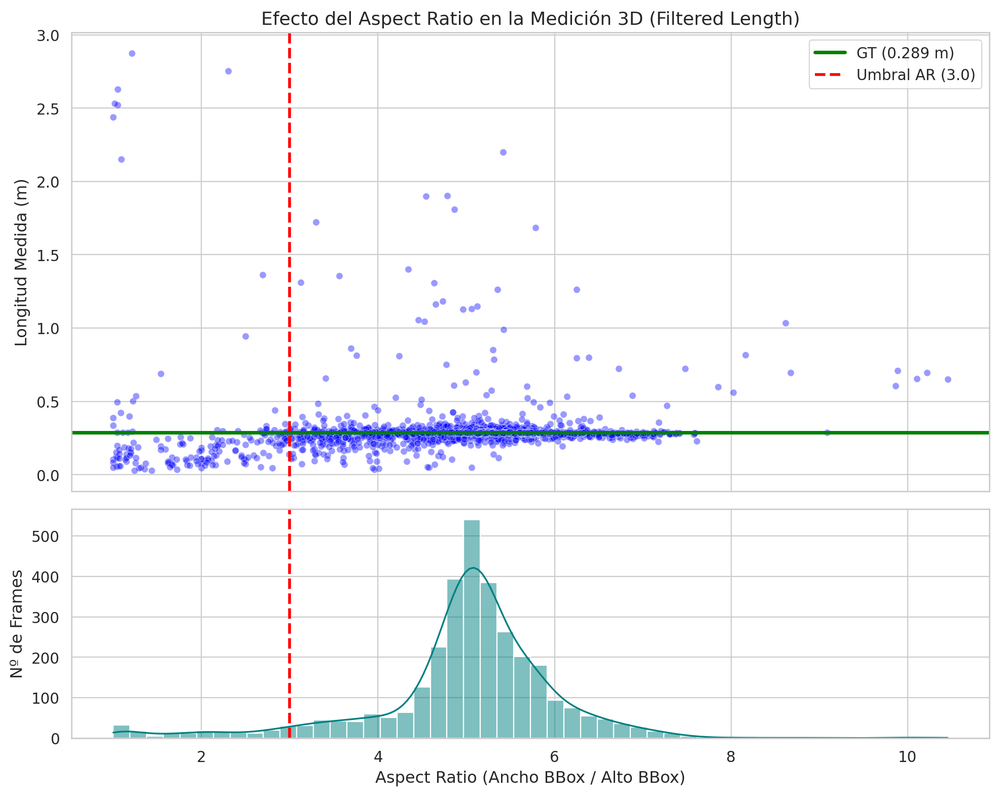

In [ ]:
rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 

#### ASPECT RATIO AND ANGLE THR IMPACT ON ERROR

In [ ]:
rutils.plot_thresholds_interaction(df_raw_agg, ar_range=None, angles_to_test=None, optimal_ar=3)

##### RESULTS 

ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  3.70 ± 7.49 cm |    3216 frames |    62 tracks
1. + Filtro: Sin Bordes                       |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
2. + Filtro: Sin Solapamiento                 |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  1.57 ± 3.10 cm |    2876 frames |    52 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  0.67 ± 1.00 cm |    2098 frames |    38 tracks
5. + Filtro: is_3D_complete                   |  0.67 ± 1.00 cm |    2096 frames |    38 tracks


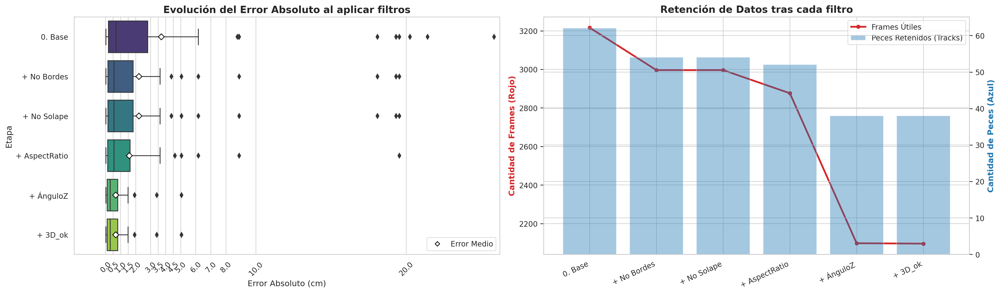

In [ ]:

# CALCULATE METRICS AND PLOTS
df_results={}

stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
    df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
)
 
# display(stages_dict)



##### SAVE RESULTS

In [58]:
#-----------------------------------------

# SAVE SUMMARY:
# 1. Extraer el DataFrame agregado de la última etapa (Todos los filtros aplicados)
# El nombre exacto de la llave depende de las variables que le pasaste
ultima_etapa_key = "5. + Filtro: is_3D_complete"
df_final = agg_stages_dict[ultima_etapa_key].copy()

# 2. Eliminar todos los peces con track_id == -1 (Convertimos a string por si acaso)
df_final = df_final[~df_final['track_id'].astype(str).isin(['-1', '-1.0'])]

# 3. Exigir estrictamente que tengan MÁS de 5 frames de track válidos
df_final = df_final[df_final['n_frames_validos'] > 5]

# 4. Crear de nuevo el identificador único para que te sea fácil de leer
df_final['unique_track'] = df_final['video_day'].astype(str) + "_" + df_final['source_folder'].astype(str) + "_" + df_final['track_id'].astype(str)

# 5. Ordenar el dataframe (opcional, para que quede bonito)
df_final = df_final.sort_values(by=['video_day', 'source_folder', 'track_id']).reset_index(drop=True)

# Reordenar las columnas para que el identificador quede primero
cols = ['unique_track', 'video_day', 'source_folder', 'track_id', 'n_frames_validos', 'calculated_length_cm', 'gt_cm', 'abs_error_cm', 'mean_elevation_deg']
df_final = df_final[cols]

cprint(f"🎯 Peces finales válidos y filtrados: {len(df_final)}", "green", attrs=["bold"])
display(df_final)

# ==========================================================
# 💾 GUARDAR 1: El listado completo de peces (Summary)
# ==========================================================
summary_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_summary.csv")
df_final.to_csv(summary_path, index=False)
cprint(f"✅ Listado de tracks guardado en: {summary_path}", "green")

# ==========================================================
# 📊 CALCULAR Y GUARDAR 2: Las Métricas Globales (Metrics)
# ==========================================================
metrics_data = {
    "Total_Peces_Retenidos": [len(df_final)],
    "Promedio_Frames_Validos": [round(df_final['n_frames_validos'].mean(), 1) if not df_final.empty else 0],
    "Error_Absoluto_Medio_cm": [round(df_final['abs_error_cm'].mean(), 2) if not df_final.empty else 0],
    "Desviacion_Estandar_Error_cm": [round(df_final['abs_error_cm'].std(), 2) if not df_final.empty else 0]
}

df_metrics = pd.DataFrame(metrics_data)


print("\n📊 TABLA DE MÉTRICAS GLOBALES:")
display(df_metrics)

metrics_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_metrics.csv")
df_metrics.to_csv(metrics_path, index=False)
cprint(f"✅ Métricas globales guardadas en: {metrics_path}", "green")

🎯 Peces finales válidos y filtrados: 33


,unique_track,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
0,2024_11_28_12_52_36_0_7,2024_11_28,12_52_36_0,7,124.0,28.835827,28.9,0.064173,-9.549284
1,2024_11_28_12_52_36_0_12,2024_11_28,12_52_36_0,12,33.0,30.385976,28.9,1.485976,-2.683733
2,2024_11_28_12_52_36_0_17,2024_11_28,12_52_36_0,17,30.0,29.053652,28.9,0.153652,-2.005986
3,2024_11_28_12_54_48_0_1,2024_11_28,12_54_48_0,1,8.0,28.420438,28.9,0.479562,-11.072974
4,2024_11_28_12_54_48_0_12,2024_11_28,12_54_48_0,12,87.0,28.802779,28.9,0.097221,-9.063226
5,2024_11_28_12_54_48_0_15,2024_11_28,12_54_48_0,15,96.0,29.103735,28.9,0.203735,-3.438370
6,2024_11_28_12_54_48_0_19,2024_11_28,12_54_48_0,19,10.0,28.949340,28.9,0.049340,-2.760281
7,2024_11_28_12_54_48_0_24,2024_11_28,12_54_48_0,24,37.0,28.940178,28.9,0.040178,0.964746
8,2024_11_28_12_54_48_0_27,2024_11_28,12_54_48_0,27,52.0,28.777482,28.9,0.122518,-1.099214
9,2024_11_28_12_56_59_0_1,2024_11_28,12_56_59_0,1,137.0,29.563874,28.9,0.663874,2.525205


✅ Listado de tracks guardado en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2024_11_28_single_fish_filtered_measures_summary.csv

📊 TABLA DE MÉTRICAS GLOBALES:


,Total_Peces_Retenidos,Promedio_Frames_Validos,Error_Absoluto_Medio_cm,Desviacion_Estandar_Error_cm
0,33,61.3,0.7,1.06


✅ Métricas globales guardadas en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2024_11_28_single_fish_filtered_measures_metrics.csv


In [ ]:
stop

## RESULTS 2025_05_08


In [ ]:
# Choose video day
day_code ="2025_05_08"
FOLDER_TO_ANALYSE = ROOT_DIR + day_code
cprint(f"processing day {day_code} of Dataset {DATASET}")
global_csv_name ="_raw_aggregated.csv"

processing day 2024_11_28 of Dataset DATASET_1/



### ALL

#### LOAD AND SUMMARY


In [ ]:
print(FOLDER_TO_ANALYSE)
csv_path = os.path.join(FOLDER_TO_ANALYSE,day_code+"_raw_aggregated.csv")

csv_out_path = os.path.join(FOLDER_TO_ANALYSE)

cprint(f"Reading csv from {csv_path}", "yellow")

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)

df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head()) 

print("DF NUMERIC SUMMARY: ")
display(df_raw_agg.describe())
print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF CATEGORICAL SUMMARY: ")
categorical_cols = df_raw_agg.select_dtypes(include=['object', 'category'])
display(categorical_cols.describe())
summary = pd.DataFrame({
    'unique_values': categorical_cols.nunique(),
    'most_frequent': categorical_cols.mode().iloc[0],
    'freq': categorical_cols.apply(lambda x: x.value_counts().iloc[0]),
    'missing': categorical_cols.isnull().sum()
})
display(summary)

print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")

print("DF HEAD: ")
display(df_raw_agg.head())


/home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28
Reading csv from /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/2024_11_28_raw_aggregated.csv


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,especie_gt,abs_error_cm,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
0,2024_11_28,13_12_31_0,13_12_31_0,frame_21,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,3.866667,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
1,2024_11_28,13_12_31_0,13_12_31_0,frame_55,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,1.405559,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
2,2024_11_28,13_12_31_0,13_12_31_0,frame_89,0,255,-1,1,False,False,[],[ 0.0024459 -0.002565 0.99999],77.530540,169.017049,0.736353,0.396910,0.356903,28.9,10.790982,3733.903865,2.226773,5.990187,caballa,10.790982,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
3,2024_11_28,13_12_31_0,13_12_31_0,frame_90,0,255,-1,1,False,False,[],[ 0.03488 0.0027044 0.99939],85.783589,156.962229,0.875448,0.311949,0.372817,28.9,2.294917,794.088767,2.147475,6.568627,caballa,2.294917,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
4,2024_11_28,13_12_31_0,13_12_31_0,frame_91,0,255,4,1,False,False,[],[ -0.051677 -0.025612 0.99834],83.641111,-174.122751,0.494052,0.355393,0.386290,28.9,6.639258,2297.320975,2.150351,7.182243,caballa,6.639258,angle_fail,2024_11_28/13_12_31_0/4,single_fish,NaN,NaN,NaN


DF NUMERIC SUMMARY: 


,class_name,object_id,track_id,is_3D_complete,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,abs_error_cm
count,15141.0,15141.000000,15141.000000,15141.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,9478.000000,3216.000000,13495.000000,13904.000000,15141.000000,8946.000000
mean,0.0,208.848689,18.031900,0.963609,6.641263,19.377771,0.904697,0.256243,0.291892,23.485894,3.757190,341.575928,1.461636,4.486805,13.866632
std,0.0,64.318318,19.131454,0.187268,27.778185,64.745758,1.052608,0.316740,0.223423,21.648850,15.026192,2594.492932,0.478231,1.246041,41.398854
min,0.0,63.000000,-1.000000,0.000000,-44.856489,-179.983649,-1.000000,-1.000000,-1.000000,-100.000000,0.000200,0.009534,0.781635,1.000000,0.000000
25%,0.0,127.000000,2.000000,1.000000,-11.801443,-15.130493,0.280499,0.200809,0.201345,21.600000,0.300144,16.186019,1.072842,3.833043,0.430243
50%,0.0,255.000000,12.000000,1.000000,0.696052,1.812615,1.091485,0.276597,0.275862,28.900000,0.691429,38.486015,1.424974,4.782186,1.099186
75%,0.0,255.000000,28.000000,1.000000,19.633398,66.948179,1.745850,0.287643,0.289353,28.900000,1.887347,63.650111,1.731374,5.254571,3.600907
max,0.0,255.000000,82.000000,1.000000,88.620093,179.962087,3.129326,2.872828,2.851974,28.900000,258.382786,89405.808457,3.191157,16.386595,258.382786



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF CATEGORICAL SUMMARY: 


,video_day,source_folder,video_name,frame_id,overlapping_fish_ids,fish_direction,especie_gt,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
count,15141,15141,15141,15141,15141,12149,9478,15141,15141,15141,11832,10687,11832
unique,1,28,28,485,30,12149,4,8,373,2,2,2,2
top,2024_11_28,13-58-56_0,13-58-56_0,frame_0,[],[ 0.41926 -0.14558 0.89612],caballa,measured,2024_11_28/13-58-56_0/1,multiple_fish,True,True,True
freq,15141,1421,1421,48,15007,1,7107,6902,485,11832,11757,10279,10163


,unique_values,most_frequent,freq,missing
video_day,1,2024_11_28,15141,0
source_folder,28,13-58-56_0,1421,0
video_name,28,13-58-56_0,1421,0
frame_id,485,frame_0,48,0
overlapping_fish_ids,30,[],15007,0
fish_direction,12149,[ 1 0.0019192 0.00071097],1,2992
especie_gt,4,caballa,7107,5663
failure_reason,8,measured,6902,0
unique_track,373,2024_11_28/13-56-44_0/2,485,0
scenario,2,multiple_fish,11832,0



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF HEAD: 


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,especie_gt,abs_error_cm,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
0,2024_11_28,13_12_31_0,13_12_31_0,frame_21,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,3.866667,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
1,2024_11_28,13_12_31_0,13_12_31_0,frame_55,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,1.405559,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
2,2024_11_28,13_12_31_0,13_12_31_0,frame_89,0,255,-1,1,False,False,[],[ 0.0024459 -0.002565 0.99999],77.530540,169.017049,0.736353,0.396910,0.356903,28.9,10.790982,3733.903865,2.226773,5.990187,caballa,10.790982,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
3,2024_11_28,13_12_31_0,13_12_31_0,frame_90,0,255,-1,1,False,False,[],[ 0.03488 0.0027044 0.99939],85.783589,156.962229,0.875448,0.311949,0.372817,28.9,2.294917,794.088767,2.147475,6.568627,caballa,2.294917,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
4,2024_11_28,13_12_31_0,13_12_31_0,frame_91,0,255,4,1,False,False,[],[ -0.051677 -0.025612 0.99834],83.641111,-174.122751,0.494052,0.355393,0.386290,28.9,6.639258,2297.320975,2.150351,7.182243,caballa,6.639258,angle_fail,2024_11_28/13_12_31_0/4,single_fish,NaN,NaN,NaN


#### RESULTS SUMMARY

##### FRAMES SUMMARY

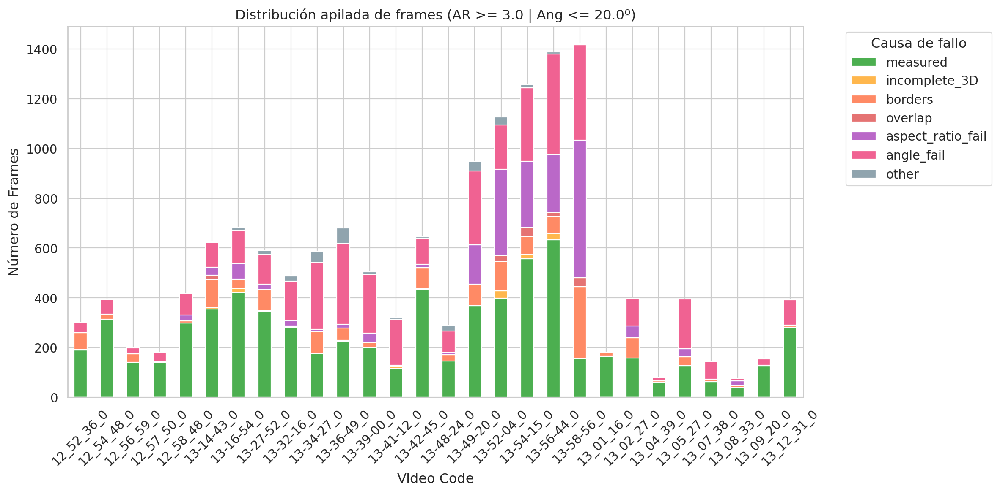

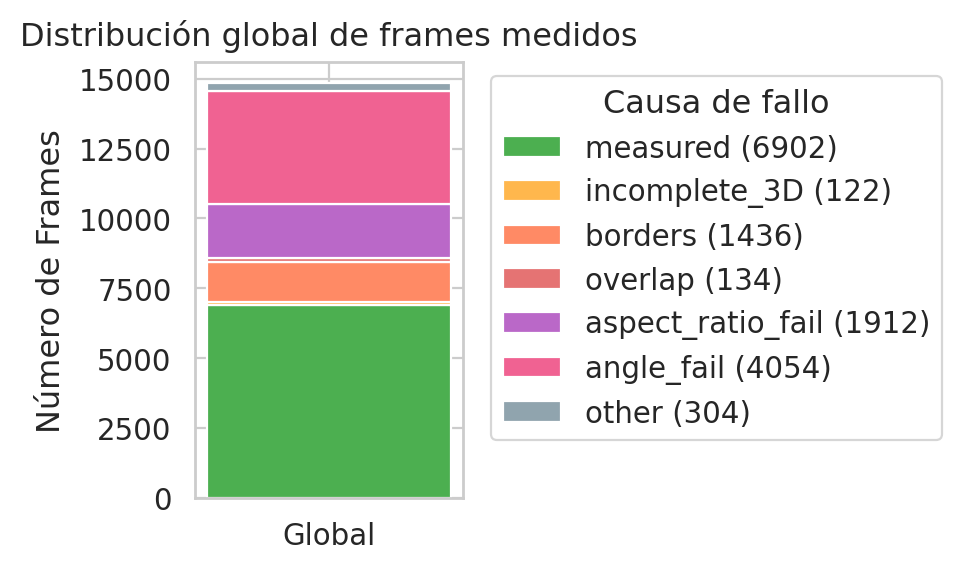


📊 TABLA 1: Distribución Global de Frames


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,6902,46.43
1,incomplete_3D,122,0.82
2,borders,1436,9.66
3,overlap,134,0.90
4,aspect_ratio_fail,1912,12.86
5,angle_fail,4054,27.27
6,other,304,2.05


In [ ]:
stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,3), 
    show_global=True
)



##### TRACKS SUMMARY

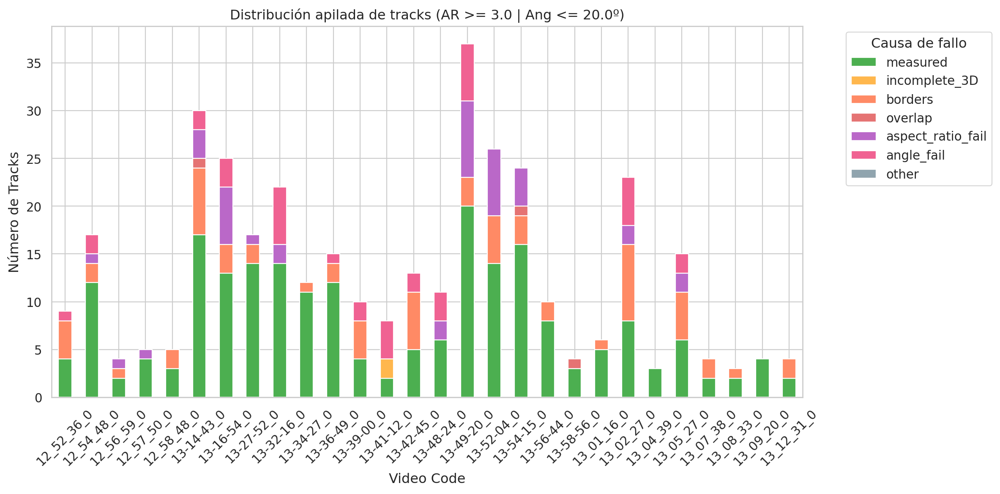

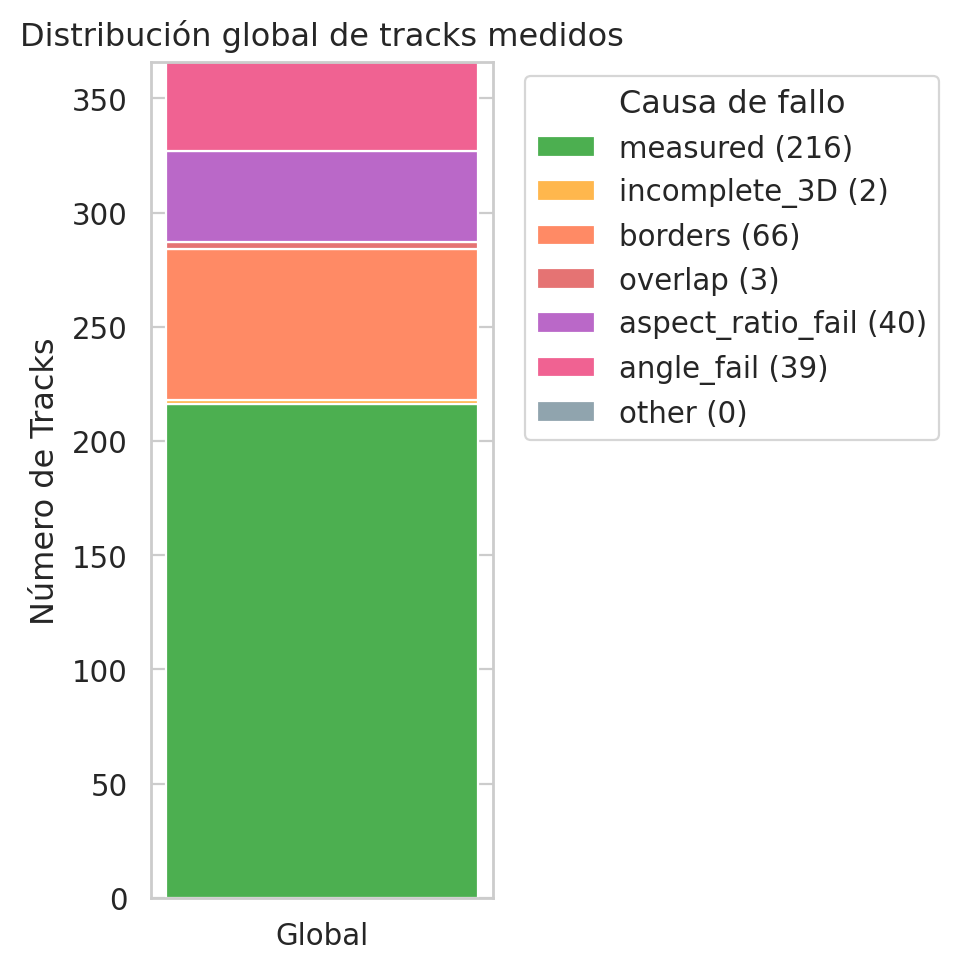


📊 TABLA 1: Distribución Global de Tracks


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,216,59.02
1,incomplete_3D,2,0.55
2,borders,66,18.03
3,overlap,3,0.82
4,aspect_ratio_fail,40,10.93
5,angle_fail,39,10.66
6,other,0,0.00



📊 TABLA 2: Desglose por Vídeo


track_failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,angle_fail,other
source_folder,,,,,,,
12_52_36_0,4,0,4,0,0,1,0
12_54_48_0,12,0,2,0,1,2,0
12_56_59_0,2,0,1,0,1,0,0
12_57_50_0,4,0,0,0,1,0,0
12_58_48_0,3,0,2,0,0,0,0
13-14-43_0,17,0,7,1,3,2,0
13-16-54_0,13,0,3,0,6,3,0
13-27-52_0,14,0,2,0,1,0,0
13-32-16_0,14,0,0,0,2,6,0


In [ ]:
track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

##### ASPECT RATIO PLOT

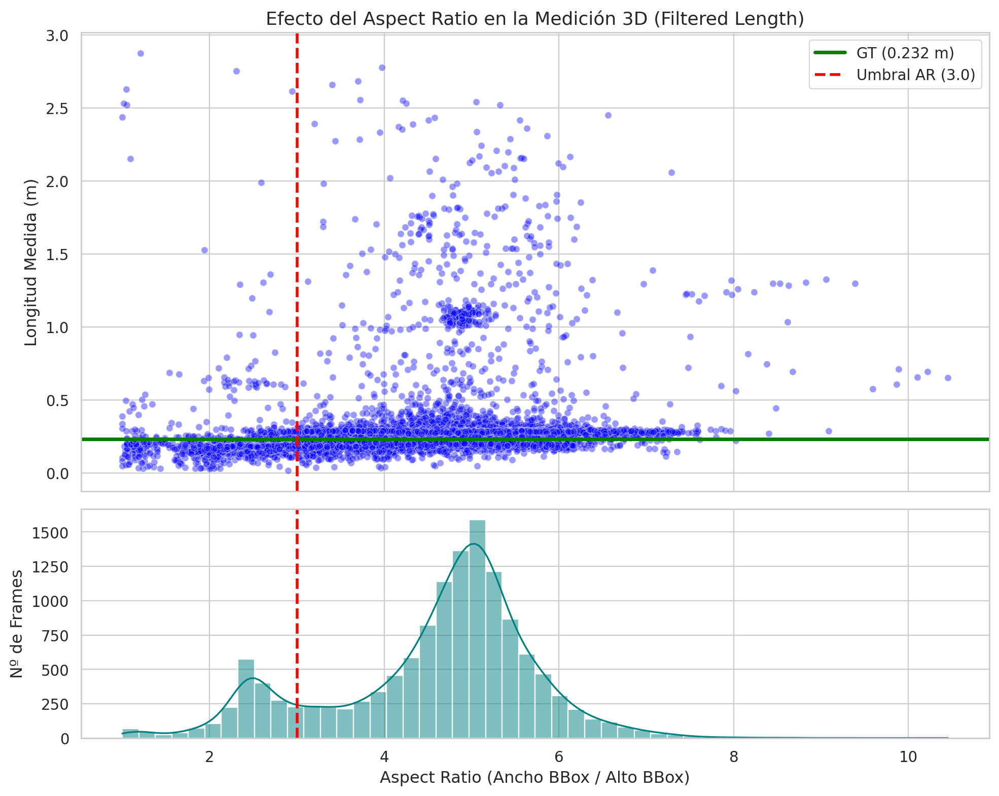

In [ ]:
rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 

##### ASPECT RATIO AND ANGLE THR IMPACT ON ERROR

Evaluating Angles: 100%|██████████| 6/6 [00:08<00:00,  1.50s/it]


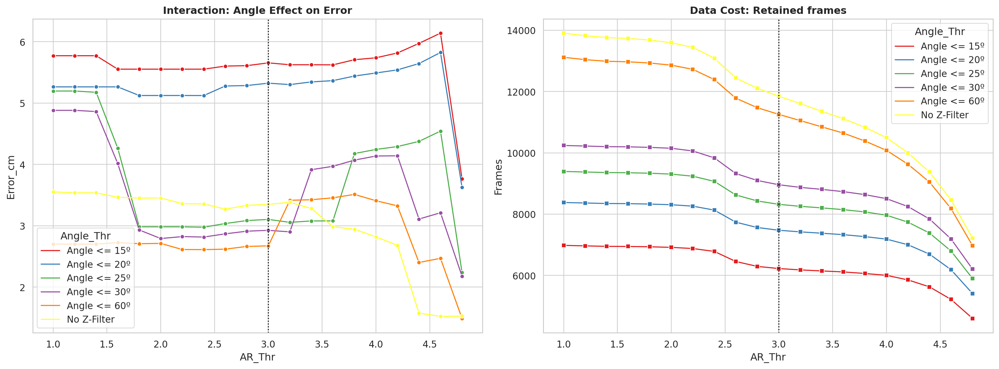

,Angle_Thr,AR_Thr,Error_cm,Frames,Tracks
0,Angle <= 15º,1.0,5.771526,6982,107
1,Angle <= 15º,1.2,5.771526,6966,107
2,Angle <= 15º,1.4,5.771526,6950,107
3,Angle <= 15º,1.6,5.552291,6947,107
4,Angle <= 15º,1.8,5.552291,6936,107
...,...,...,...,...,...
115,No Z-Filter,4.0,2.819224,10495,139
116,No Z-Filter,4.2,2.679480,9998,133
117,No Z-Filter,4.4,1.575009,9374,127
118,No Z-Filter,4.6,1.522151,8461,123


In [ ]:
rutils.plot_thresholds_interaction(df_raw_agg, ar_range=None, angles_to_test=None, optimal_ar=3)

##### RESULTS 

ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  3.10 ± 6.73 cm |   13495 frames |   166 tracks
1. + Filtro: Sin Bordes                       |  2.56 ± 5.69 cm |   13275 frames |   158 tracks
2. + Filtro: Sin Solapamiento                 |  2.56 ± 5.69 cm |   13143 frames |   158 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  2.41 ± 5.54 cm |   11277 frames |   149 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  1.00 ± 1.29 cm |    6999 frames |   106 tracks
5. + Filtro: is_3D_complete                   |  0.97 ± 1.28 cm |    6904 frames |   105 tracks


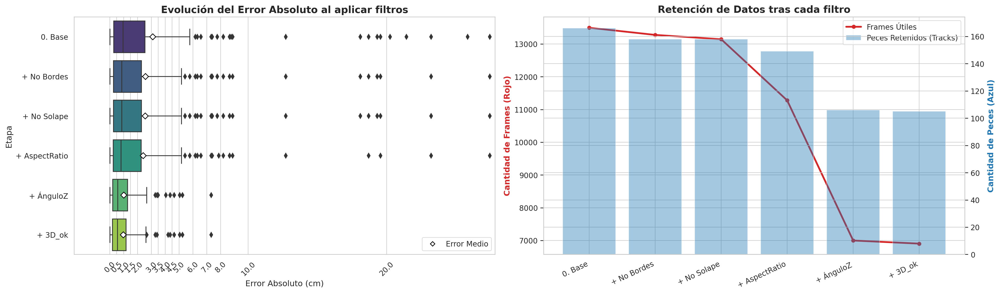

In [ ]:

# CALCULATE METRICS AND PLOTS
df_results={}

stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
    df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
)
 
# display(stages_dict)



##### ERROR ANALYSIS

In [ ]:
rutils.plot_final_error_analysis(df_raw_agg, top_n_outliers=15, figsize=(18, 14), title="Análisis Profundo del Error en la Etapa Final (3D Complete)")

##### SAVE RESULTS

In [ ]:
#-----------------------------------------

# SAVE SUMMARY:
# 1. Extraer el DataFrame agregado de la última etapa (Todos los filtros aplicados)
# El nombre exacto de la llave depende de las variables que le pasaste
ultima_etapa_key = "5. + Filtro: is_3D_complete"
df_final = agg_stages_dict[ultima_etapa_key].copy()

# 2. Eliminar todos los peces con track_id == -1 (Convertimos a string por si acaso)
df_final = df_final[~df_final['track_id'].astype(str).isin(['-1', '-1.0'])]

# 3. Exigir estrictamente que tengan MÁS de 5 frames de track válidos
df_final = df_final[df_final['n_frames_validos'] > 5]

# 4. Crear de nuevo el identificador único para que te sea fácil de leer
df_final['unique_track'] = df_final['video_day'].astype(str) + "_" + df_final['source_folder'].astype(str) + "_" + df_final['track_id'].astype(str)

# 5. Ordenar el dataframe (opcional, para que quede bonito)
df_final = df_final.sort_values(by=['video_day', 'source_folder', 'track_id']).reset_index(drop=True)

# Reordenar las columnas para que el identificador quede primero
cols = ['unique_track', 'video_day', 'source_folder', 'track_id', 'n_frames_validos', 'calculated_length_cm', 'gt_cm', 'abs_error_cm', 'mean_elevation_deg']
df_final = df_final[cols]

cprint(f"🎯 Peces finales válidos y filtrados: {len(df_final)}", "green", attrs=["bold"])
display(df_final)

# ==========================================================
# 💾 GUARDAR 1: El listado completo de peces (Summary)
# ==========================================================
summary_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_summary.csv")
df_final.to_csv(summary_path, index=False)
cprint(f"✅ Listado de tracks guardado en: {summary_path}", "green")

# ==========================================================
# 📊 CALCULAR Y GUARDAR 2: Las Métricas Globales (Metrics)
# ==========================================================
metrics_data = {
    "Total_Peces_Retenidos": [len(df_final)],
    "Promedio_Frames_Validos": [round(df_final['n_frames_validos'].mean(), 1) if not df_final.empty else 0],
    "Error_Absoluto_Medio_cm": [round(df_final['abs_error_cm'].mean(), 2) if not df_final.empty else 0],
    "Desviacion_Estandar_Error_cm": [round(df_final['abs_error_cm'].std(), 2) if not df_final.empty else 0]
}

df_metrics = pd.DataFrame(metrics_data)


print("\n📊 TABLA DE MÉTRICAS GLOBALES:")
display(df_metrics)

metrics_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_metrics.csv")
df_metrics.to_csv(metrics_path, index=False)
cprint(f"✅ Métricas globales guardadas en: {metrics_path}", "green")

🎯 Peces finales válidos y filtrados: 96


,unique_track,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
0,2024_11_28_12_52_36_0_7,2024_11_28,12_52_36_0,7,124.0,28.835827,28.9,0.064173,-9.549284
1,2024_11_28_12_52_36_0_12,2024_11_28,12_52_36_0,12,33.0,30.385976,28.9,1.485976,-2.683733
2,2024_11_28_12_52_36_0_17,2024_11_28,12_52_36_0,17,30.0,29.053652,28.9,0.153652,-2.005986
3,2024_11_28_12_54_48_0_1,2024_11_28,12_54_48_0,1,8.0,28.420438,28.9,0.479562,-11.072974
4,2024_11_28_12_54_48_0_12,2024_11_28,12_54_48_0,12,87.0,28.802779,28.9,0.097221,-9.063226
...,...,...,...,...,...,...,...,...,...
91,2024_11_28_13_07_38_0_1,2024_11_28,13_07_38_0,1,21.0,28.936125,28.9,0.036125,0.874922
92,2024_11_28_13_07_38_0_13,2024_11_28,13_07_38_0,13,41.0,29.310660,28.9,0.410660,-6.729009
93,2024_11_28_13_08_33_0_1,2024_11_28,13_08_33_0,1,37.0,29.922915,28.9,1.022915,1.804097
94,2024_11_28_13_09_20_0_3,2024_11_28,13_09_20_0,3,121.0,30.822081,28.9,1.922081,-8.044878


✅ Listado de tracks guardado en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/2024_11_28_single_fish_filtered_measures_summary.csv

📊 TABLA DE MÉTRICAS GLOBALES:


,Total_Peces_Retenidos,Promedio_Frames_Validos,Error_Absoluto_Medio_cm,Desviacion_Estandar_Error_cm
0,96,51.3,1.01,1.32


✅ Métricas globales guardadas en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/2024_11_28_single_fish_filtered_measures_metrics.csv



### SINGLE FISH

#### LOAD AND SUMMARY


In [ ]:
group = "single_fish"
print(FOLDER_TO_ANALYSE)
csv_path = os.path.join(FOLDER_TO_ANALYSE,group,
                        day_code+"_"+group+"_agg.csv")

csv_out_path = os.path.join(FOLDER_TO_ANALYSE,group)

cprint(f"Reading csv from {csv_path}", "yellow")

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)


df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head()) 

print("DF NUMERIC SUMMARY: ")
display(df_raw_agg.describe())
print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF CATEGORICAL SUMMARY: ")
categorical_cols = df_raw_agg.select_dtypes(include=['object', 'category'])
display(categorical_cols.describe())
summary = pd.DataFrame({
    'unique_values': categorical_cols.nunique(),
    'most_frequent': categorical_cols.mode().iloc[0],
    'freq': categorical_cols.apply(lambda x: x.value_counts().iloc[0]),
    'missing': categorical_cols.isnull().sum()
})
display(summary)

print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")

print("DF HEAD: ")
display(df_raw_agg.head())


/home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28
Reading csv from /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2025_08_21_single_fish_agg.csv


FileNotFoundError: [Errno 2] No such file or directory: '/home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2025_08_21_single_fish_agg.csv'

#### RESULTS SUMMARY

##### FRAMES SUMMARY

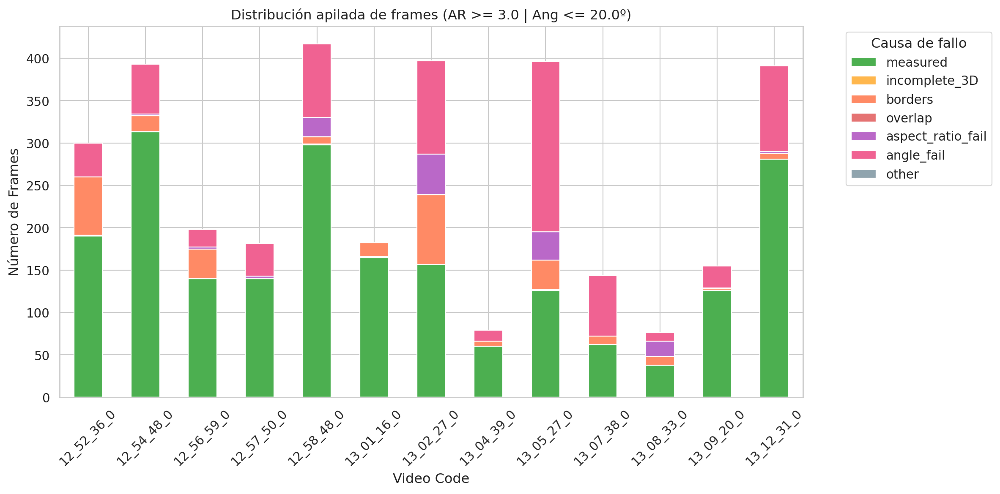

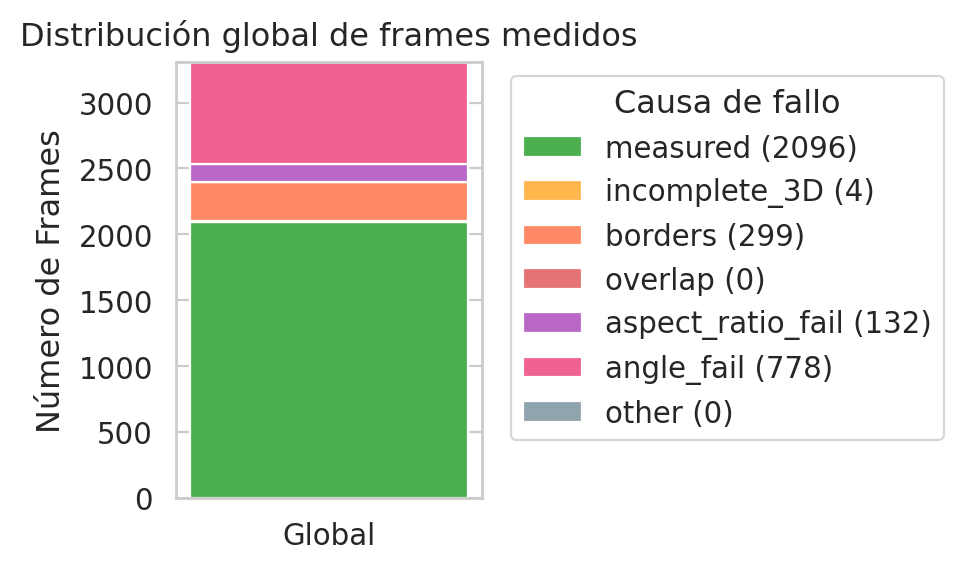


📊 TABLA 1: Distribución Global de Frames


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,2096,63.34
1,incomplete_3D,4,0.12
2,borders,299,9.04
3,overlap,0,0.00
4,aspect_ratio_fail,132,3.99
5,angle_fail,778,23.51
6,other,0,0.00


In [ ]:
stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,3), 
    show_global=True
)

##### TRACKS SUMMARY

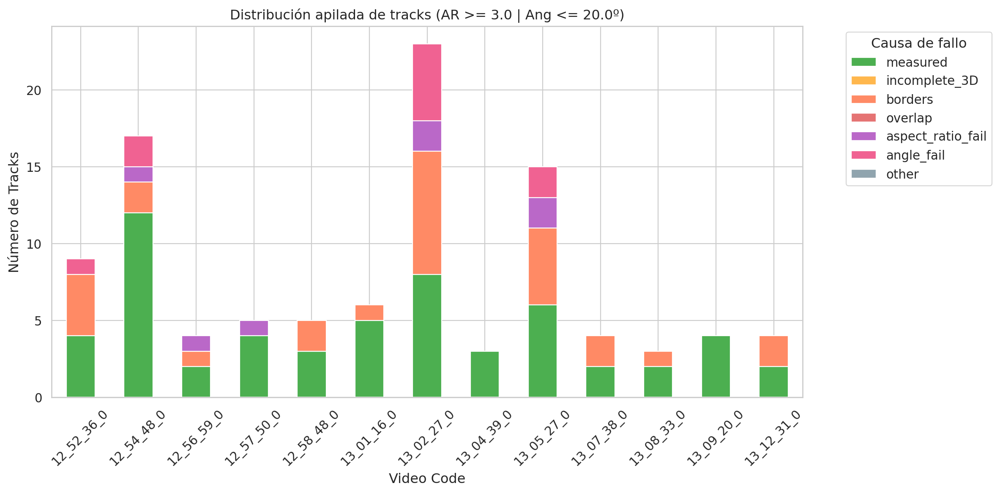

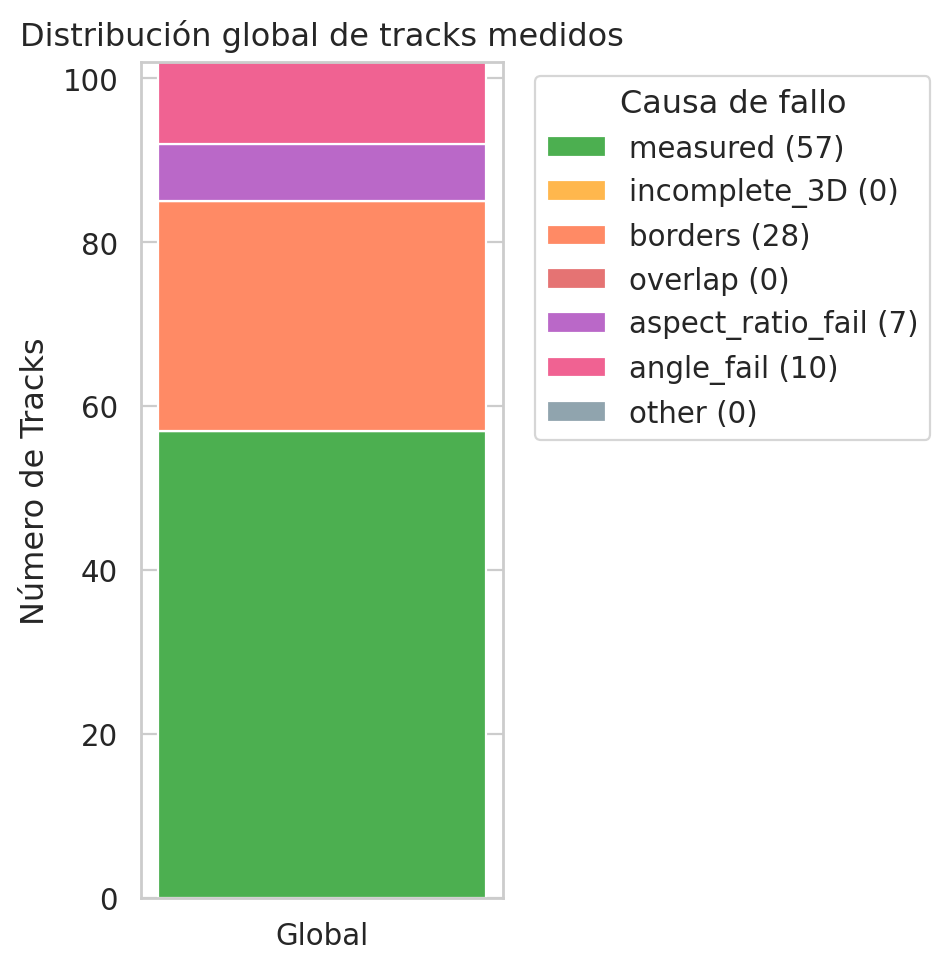


📊 TABLA 1: Distribución Global de Tracks


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,57,55.88
1,incomplete_3D,0,0.00
2,borders,28,27.45
3,overlap,0,0.00
4,aspect_ratio_fail,7,6.86
5,angle_fail,10,9.80
6,other,0,0.00



📊 TABLA 2: Desglose por Vídeo


track_failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,angle_fail,other
source_folder,,,,,,,
12_52_36_0,4,0,4,0,0,1,0
12_54_48_0,12,0,2,0,1,2,0
12_56_59_0,2,0,1,0,1,0,0
12_57_50_0,4,0,0,0,1,0,0
12_58_48_0,3,0,2,0,0,0,0
13_01_16_0,5,0,1,0,0,0,0
13_02_27_0,8,0,8,0,2,5,0
13_04_39_0,3,0,0,0,0,0,0
13_05_27_0,6,0,5,0,2,2,0


In [ ]:
track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

##### ASPECT RATIO PLOT

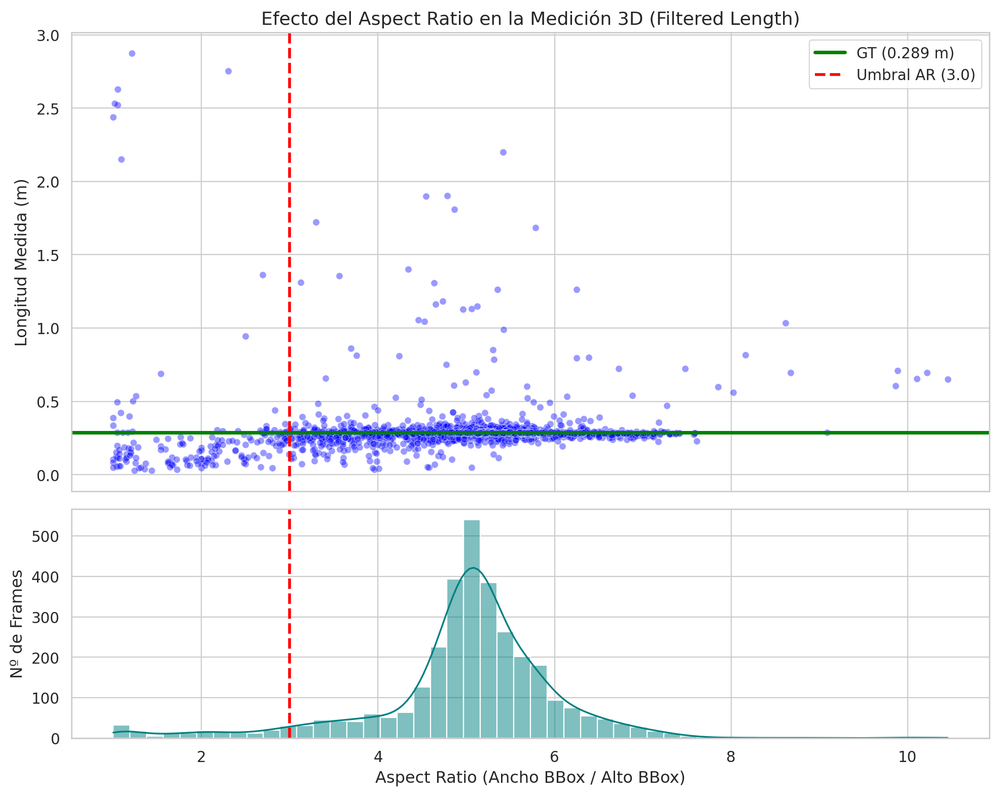

In [ ]:
rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 

#### ASPECT RATIO AND ANGLE THR IMPACT ON ERROR

In [ ]:
rutils.plot_thresholds_interaction(df_raw_agg, ar_range=None, angles_to_test=None, optimal_ar=3)

##### RESULTS 

ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  3.70 ± 7.49 cm |    3216 frames |    62 tracks
1. + Filtro: Sin Bordes                       |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
2. + Filtro: Sin Solapamiento                 |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  1.57 ± 3.10 cm |    2876 frames |    52 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  0.67 ± 1.00 cm |    2098 frames |    38 tracks
5. + Filtro: is_3D_complete                   |  0.67 ± 1.00 cm |    2096 frames |    38 tracks


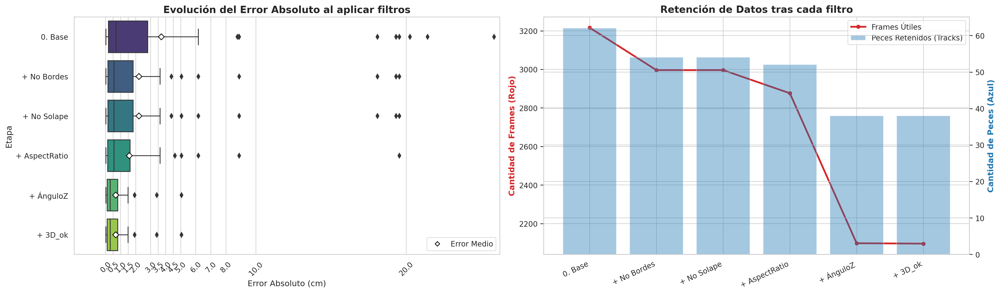

In [ ]:

# CALCULATE METRICS AND PLOTS
df_results={}

stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
    df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
)
 
# display(stages_dict)



##### SAVE RESULTS

In [ ]:
#-----------------------------------------

# SAVE SUMMARY:
# 1. Extraer el DataFrame agregado de la última etapa (Todos los filtros aplicados)
# El nombre exacto de la llave depende de las variables que le pasaste
ultima_etapa_key = "5. + Filtro: is_3D_complete"
df_final = agg_stages_dict[ultima_etapa_key].copy()

# 2. Eliminar todos los peces con track_id == -1 (Convertimos a string por si acaso)
df_final = df_final[~df_final['track_id'].astype(str).isin(['-1', '-1.0'])]

# 3. Exigir estrictamente que tengan MÁS de 5 frames de track válidos
df_final = df_final[df_final['n_frames_validos'] > 5]

# 4. Crear de nuevo el identificador único para que te sea fácil de leer
df_final['unique_track'] = df_final['video_day'].astype(str) + "_" + df_final['source_folder'].astype(str) + "_" + df_final['track_id'].astype(str)

# 5. Ordenar el dataframe (opcional, para que quede bonito)
df_final = df_final.sort_values(by=['video_day', 'source_folder', 'track_id']).reset_index(drop=True)

# Reordenar las columnas para que el identificador quede primero
cols = ['unique_track', 'video_day', 'source_folder', 'track_id', 'n_frames_validos', 'calculated_length_cm', 'gt_cm', 'abs_error_cm', 'mean_elevation_deg']
df_final = df_final[cols]

cprint(f"🎯 Peces finales válidos y filtrados: {len(df_final)}", "green", attrs=["bold"])
display(df_final)

# ==========================================================
# 💾 GUARDAR 1: El listado completo de peces (Summary)
# ==========================================================
summary_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_summary.csv")
df_final.to_csv(summary_path, index=False)
cprint(f"✅ Listado de tracks guardado en: {summary_path}", "green")

# ==========================================================
# 📊 CALCULAR Y GUARDAR 2: Las Métricas Globales (Metrics)
# ==========================================================
metrics_data = {
    "Total_Peces_Retenidos": [len(df_final)],
    "Promedio_Frames_Validos": [round(df_final['n_frames_validos'].mean(), 1) if not df_final.empty else 0],
    "Error_Absoluto_Medio_cm": [round(df_final['abs_error_cm'].mean(), 2) if not df_final.empty else 0],
    "Desviacion_Estandar_Error_cm": [round(df_final['abs_error_cm'].std(), 2) if not df_final.empty else 0]
}

df_metrics = pd.DataFrame(metrics_data)


print("\n📊 TABLA DE MÉTRICAS GLOBALES:")
display(df_metrics)

metrics_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_metrics.csv")
df_metrics.to_csv(metrics_path, index=False)
cprint(f"✅ Métricas globales guardadas en: {metrics_path}", "green")

🎯 Peces finales válidos y filtrados: 96


,unique_track,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
0,2024_11_28_12_52_36_0_7,2024_11_28,12_52_36_0,7,124.0,28.835827,28.9,0.064173,-9.549284
1,2024_11_28_12_52_36_0_12,2024_11_28,12_52_36_0,12,33.0,30.385976,28.9,1.485976,-2.683733
2,2024_11_28_12_52_36_0_17,2024_11_28,12_52_36_0,17,30.0,29.053652,28.9,0.153652,-2.005986
3,2024_11_28_12_54_48_0_1,2024_11_28,12_54_48_0,1,8.0,28.420438,28.9,0.479562,-11.072974
4,2024_11_28_12_54_48_0_12,2024_11_28,12_54_48_0,12,87.0,28.802779,28.9,0.097221,-9.063226
...,...,...,...,...,...,...,...,...,...
91,2024_11_28_13_07_38_0_1,2024_11_28,13_07_38_0,1,21.0,28.936125,28.9,0.036125,0.874922
92,2024_11_28_13_07_38_0_13,2024_11_28,13_07_38_0,13,41.0,29.310660,28.9,0.410660,-6.729009
93,2024_11_28_13_08_33_0_1,2024_11_28,13_08_33_0,1,37.0,29.922915,28.9,1.022915,1.804097
94,2024_11_28_13_09_20_0_3,2024_11_28,13_09_20_0,3,121.0,30.822081,28.9,1.922081,-8.044878


✅ Listado de tracks guardado en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2025_08_21_single_fish_filtered_measures_summary.csv

📊 TABLA DE MÉTRICAS GLOBALES:


,Total_Peces_Retenidos,Promedio_Frames_Validos,Error_Absoluto_Medio_cm,Desviacion_Estandar_Error_cm
0,96,51.3,1.01,1.32


✅ Métricas globales guardadas en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2025_08_21_single_fish_filtered_measures_metrics.csv


### MULTIPLE FISH

#### LOAD AND SUMMARY


In [ ]:
group = "multiple_fish"
print(FOLDER_TO_ANALYSE)
csv_path = os.path.join(FOLDER_TO_ANALYSE,group,
                        day_code+"_"+group+"_agg.csv")

csv_out_path = os.path.join(FOLDER_TO_ANALYSE,group)

cprint(f"Reading csv from {csv_path}", "yellow")

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)

df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head()) 

print("DF NUMERIC SUMMARY: ")
display(df_raw_agg.describe())
print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF CATEGORICAL SUMMARY: ")
categorical_cols = df_raw_agg.select_dtypes(include=['object', 'category'])
display(categorical_cols.describe())
summary = pd.DataFrame({
    'unique_values': categorical_cols.nunique(),
    'most_frequent': categorical_cols.mode().iloc[0],
    'freq': categorical_cols.apply(lambda x: x.value_counts().iloc[0]),
    'missing': categorical_cols.isnull().sum()
})
display(summary)

print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")

print("DF HEAD: ")
display(df_raw_agg.head())


/home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28
Reading csv from /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/2024_11_28_raw_aggregated.csv


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,especie_gt,abs_error_cm,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
0,2024_11_28,13_12_31_0,13_12_31_0,frame_21,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,3.866667,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
1,2024_11_28,13_12_31_0,13_12_31_0,frame_55,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,1.405559,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
2,2024_11_28,13_12_31_0,13_12_31_0,frame_89,0,255,-1,1,False,False,[],[ 0.0024459 -0.002565 0.99999],77.530540,169.017049,0.736353,0.396910,0.356903,28.9,10.790982,3733.903865,2.226773,5.990187,caballa,10.790982,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
3,2024_11_28,13_12_31_0,13_12_31_0,frame_90,0,255,-1,1,False,False,[],[ 0.03488 0.0027044 0.99939],85.783589,156.962229,0.875448,0.311949,0.372817,28.9,2.294917,794.088767,2.147475,6.568627,caballa,2.294917,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
4,2024_11_28,13_12_31_0,13_12_31_0,frame_91,0,255,4,1,False,False,[],[ -0.051677 -0.025612 0.99834],83.641111,-174.122751,0.494052,0.355393,0.386290,28.9,6.639258,2297.320975,2.150351,7.182243,caballa,6.639258,angle_fail,2024_11_28/13_12_31_0/4,single_fish,NaN,NaN,NaN


DF NUMERIC SUMMARY: 


,class_name,object_id,track_id,is_3D_complete,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,abs_error_cm
count,15141.0,15141.000000,15141.000000,15141.000000,13904.000000,13904.000000,13904.000000,13904.000000,13904.000000,9478.000000,3216.000000,13495.000000,13904.000000,15141.000000,8946.000000
mean,0.0,208.848689,18.031900,0.963609,6.641263,19.377771,0.904697,0.256243,0.291892,23.485894,3.757190,341.575928,1.461636,4.486805,13.866632
std,0.0,64.318318,19.131454,0.187268,27.778185,64.745758,1.052608,0.316740,0.223423,21.648850,15.026192,2594.492932,0.478231,1.246041,41.398854
min,0.0,63.000000,-1.000000,0.000000,-44.856489,-179.983649,-1.000000,-1.000000,-1.000000,-100.000000,0.000200,0.009534,0.781635,1.000000,0.000000
25%,0.0,127.000000,2.000000,1.000000,-11.801443,-15.130493,0.280499,0.200809,0.201345,21.600000,0.300144,16.186019,1.072842,3.833043,0.430243
50%,0.0,255.000000,12.000000,1.000000,0.696052,1.812615,1.091485,0.276597,0.275862,28.900000,0.691429,38.486015,1.424974,4.782186,1.099186
75%,0.0,255.000000,28.000000,1.000000,19.633398,66.948179,1.745850,0.287643,0.289353,28.900000,1.887347,63.650111,1.731374,5.254571,3.600907
max,0.0,255.000000,82.000000,1.000000,88.620093,179.962087,3.129326,2.872828,2.851974,28.900000,258.382786,89405.808457,3.191157,16.386595,258.382786



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF CATEGORICAL SUMMARY: 


,video_day,source_folder,video_name,frame_id,overlapping_fish_ids,fish_direction,especie_gt,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
count,15141,15141,15141,15141,15141,12149,9478,15141,15141,15141,11832,10687,11832
unique,1,28,28,485,30,12149,4,8,373,2,2,2,2
top,2024_11_28,13-58-56_0,13-58-56_0,frame_0,[],[ 0.41926 -0.14558 0.89612],caballa,measured,2024_11_28/13-58-56_0/1,multiple_fish,True,True,True
freq,15141,1421,1421,48,15007,1,7107,6902,485,11832,11757,10279,10163


,unique_values,most_frequent,freq,missing
video_day,1,2024_11_28,15141,0
source_folder,28,13-58-56_0,1421,0
video_name,28,13-58-56_0,1421,0
frame_id,485,frame_0,48,0
overlapping_fish_ids,30,[],15007,0
fish_direction,12149,[ 1 0.0019192 0.00071097],1,2992
especie_gt,4,caballa,7107,5663
failure_reason,8,measured,6902,0
unique_track,373,2024_11_28/13-56-44_0/2,485,0
scenario,2,multiple_fish,11832,0



 ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DF HEAD: 


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_m,rel_error_%,fish_dist_from_camera,aspect_ratio,especie_gt,abs_error_cm,failure_reason,unique_track,scenario,is_front_fish,pointcloud_size_ok,fish_3d_ok
0,2024_11_28,13_12_31_0,13_12_31_0,frame_21,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,3.866667,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
1,2024_11_28,13_12_31_0,13_12_31_0,frame_55,0,255,-1,0,True,False,[],NaN,NaN,NaN,NaN,NaN,NaN,28.9,NaN,NaN,NaN,1.405559,caballa,NaN,borders,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
2,2024_11_28,13_12_31_0,13_12_31_0,frame_89,0,255,-1,1,False,False,[],[ 0.0024459 -0.002565 0.99999],77.530540,169.017049,0.736353,0.396910,0.356903,28.9,10.790982,3733.903865,2.226773,5.990187,caballa,10.790982,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
3,2024_11_28,13_12_31_0,13_12_31_0,frame_90,0,255,-1,1,False,False,[],[ 0.03488 0.0027044 0.99939],85.783589,156.962229,0.875448,0.311949,0.372817,28.9,2.294917,794.088767,2.147475,6.568627,caballa,2.294917,angle_fail,2024_11_28/13_12_31_0/-1,single_fish,NaN,NaN,NaN
4,2024_11_28,13_12_31_0,13_12_31_0,frame_91,0,255,4,1,False,False,[],[ -0.051677 -0.025612 0.99834],83.641111,-174.122751,0.494052,0.355393,0.386290,28.9,6.639258,2297.320975,2.150351,7.182243,caballa,6.639258,angle_fail,2024_11_28/13_12_31_0/4,single_fish,NaN,NaN,NaN


#### RESULTS SUMMARY

##### FRAMES SUMMARY

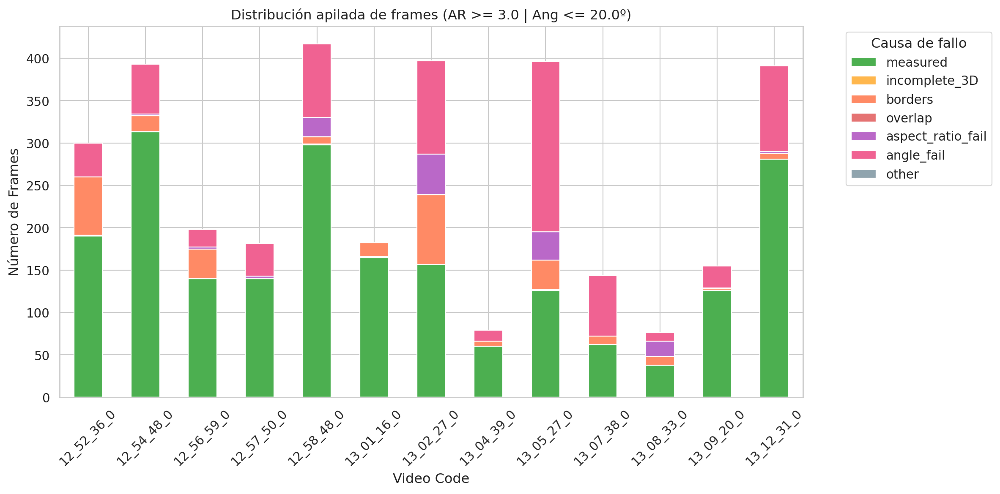

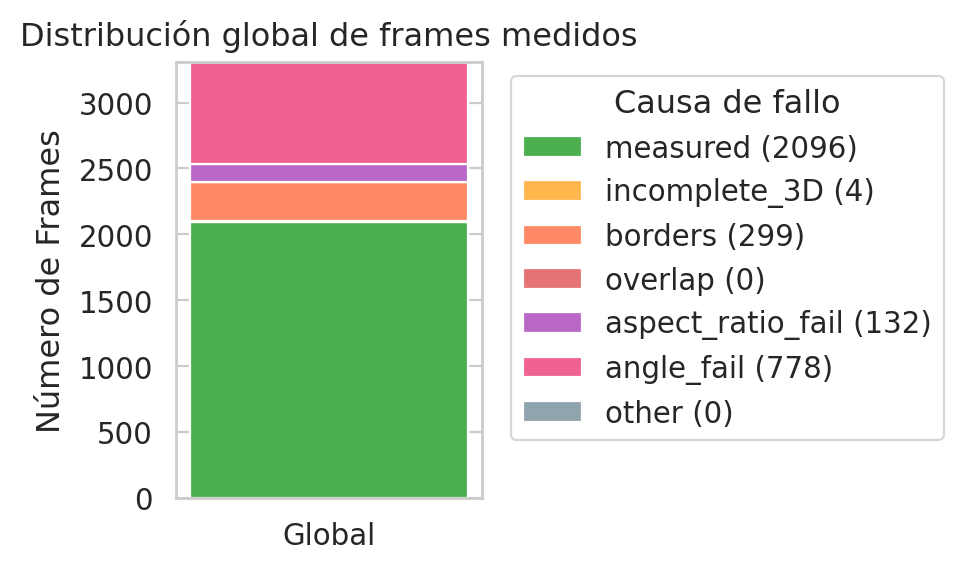


📊 TABLA 1: Distribución Global de Frames


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,2096,63.34
1,incomplete_3D,4,0.12
2,borders,299,9.04
3,overlap,0,0.00
4,aspect_ratio_fail,132,3.99
5,angle_fail,778,23.51
6,other,0,0.00


In [ ]:
stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,3), 
    show_global=True
)



##### TRACKS SUMMARY

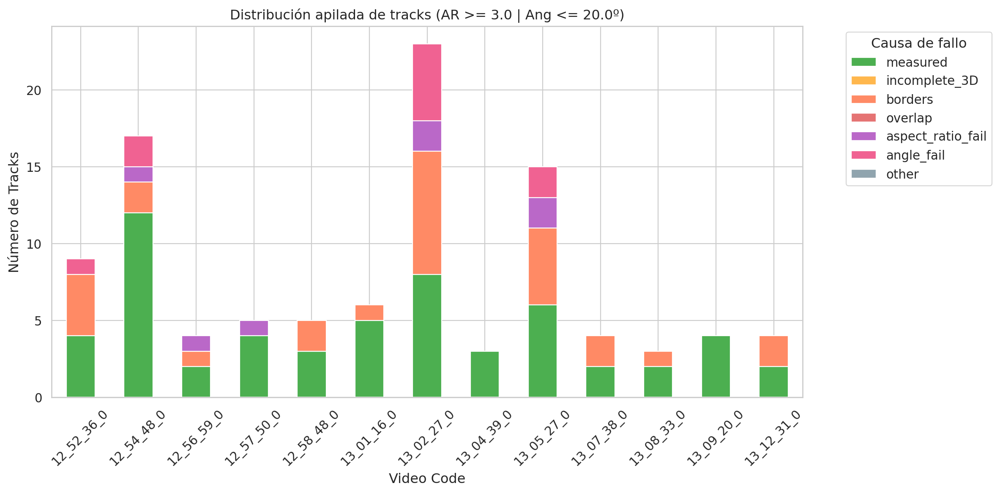

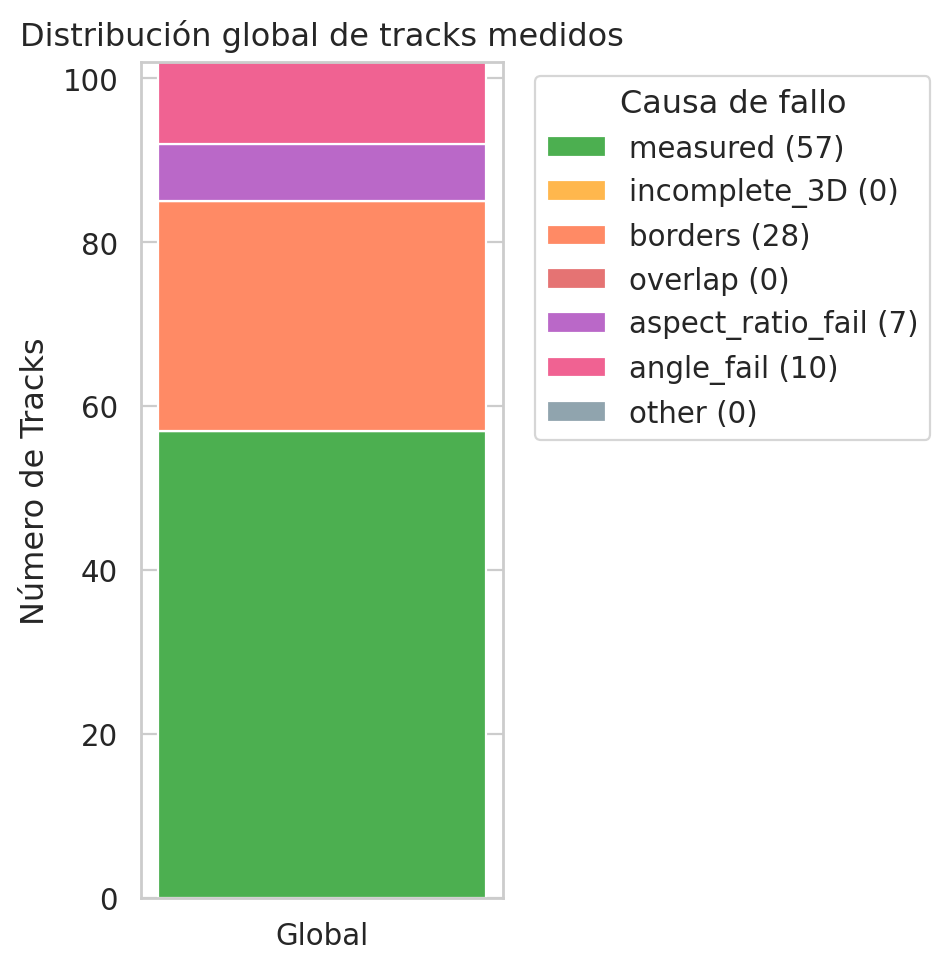


📊 TABLA 1: Distribución Global de Tracks


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,57,55.88
1,incomplete_3D,0,0.00
2,borders,28,27.45
3,overlap,0,0.00
4,aspect_ratio_fail,7,6.86
5,angle_fail,10,9.80
6,other,0,0.00



📊 TABLA 2: Desglose por Vídeo


track_failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,angle_fail,other
source_folder,,,,,,,
12_52_36_0,4,0,4,0,0,1,0
12_54_48_0,12,0,2,0,1,2,0
12_56_59_0,2,0,1,0,1,0,0
12_57_50_0,4,0,0,0,1,0,0
12_58_48_0,3,0,2,0,0,0,0
13_01_16_0,5,0,1,0,0,0,0
13_02_27_0,8,0,8,0,2,5,0
13_04_39_0,3,0,0,0,0,0,0
13_05_27_0,6,0,5,0,2,2,0


In [ ]:
track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

##### ASPECT RATIO PLOT

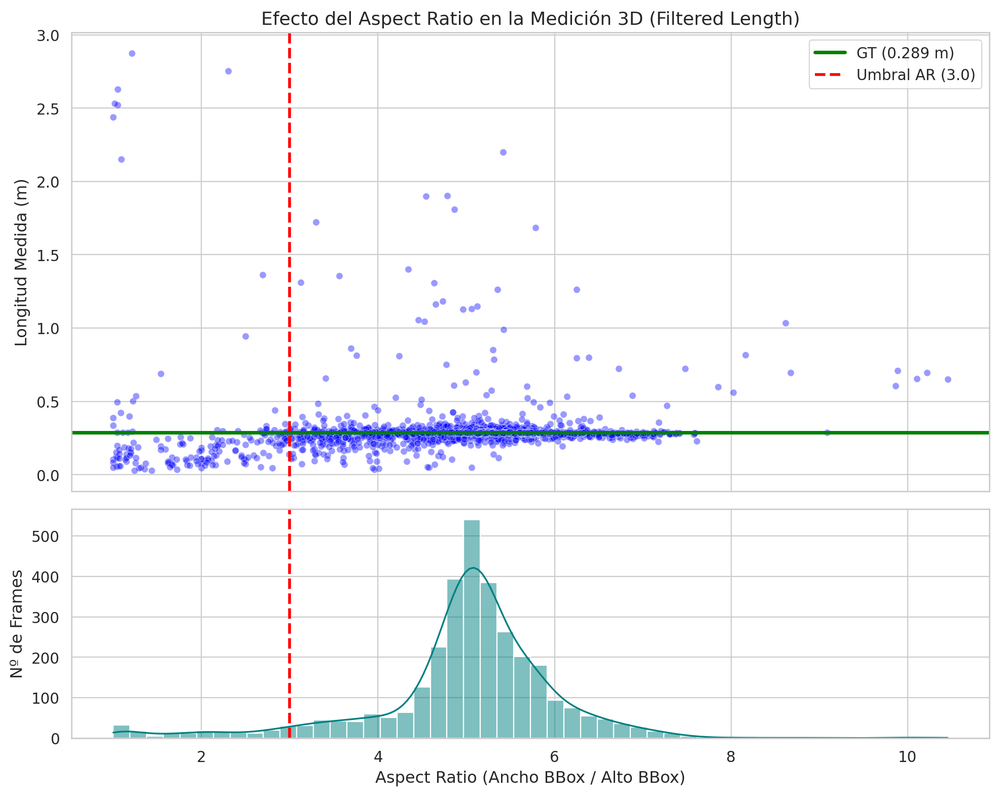

In [ ]:
rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 

#### ASPECT RATIO AND ANGLE THR IMPACT ON ERROR

In [ ]:
rutils.plot_thresholds_interaction(df_raw_agg, ar_range=None, angles_to_test=None, optimal_ar=3)

##### RESULTS 

ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  3.70 ± 7.49 cm |    3216 frames |    62 tracks
1. + Filtro: Sin Bordes                       |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
2. + Filtro: Sin Solapamiento                 |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  1.57 ± 3.10 cm |    2876 frames |    52 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  0.67 ± 1.00 cm |    2098 frames |    38 tracks
5. + Filtro: is_3D_complete                   |  0.67 ± 1.00 cm |    2096 frames |    38 tracks


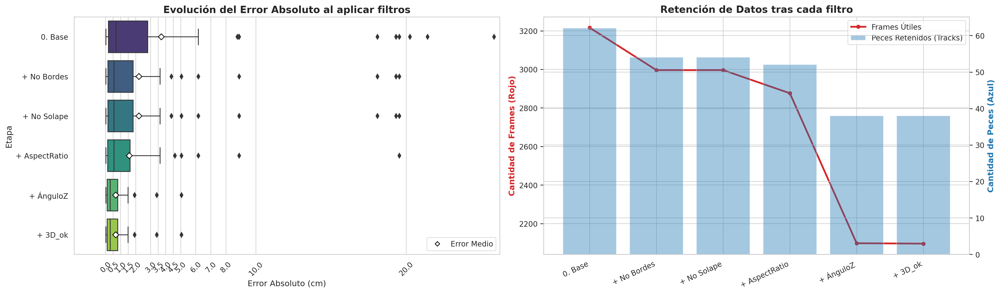

In [ ]:

# CALCULATE METRICS AND PLOTS
df_results={}

stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
    df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
)
 
# display(stages_dict)



##### SAVE RESULTS

In [ ]:
#-----------------------------------------

# SAVE SUMMARY:
# 1. Extraer el DataFrame agregado de la última etapa (Todos los filtros aplicados)
# El nombre exacto de la llave depende de las variables que le pasaste
ultima_etapa_key = "5. + Filtro: is_3D_complete"
df_final = agg_stages_dict[ultima_etapa_key].copy()

# 2. Eliminar todos los peces con track_id == -1 (Convertimos a string por si acaso)
df_final = df_final[~df_final['track_id'].astype(str).isin(['-1', '-1.0'])]

# 3. Exigir estrictamente que tengan MÁS de 5 frames de track válidos
df_final = df_final[df_final['n_frames_validos'] > 5]

# 4. Crear de nuevo el identificador único para que te sea fácil de leer
df_final['unique_track'] = df_final['video_day'].astype(str) + "_" + df_final['source_folder'].astype(str) + "_" + df_final['track_id'].astype(str)

# 5. Ordenar el dataframe (opcional, para que quede bonito)
df_final = df_final.sort_values(by=['video_day', 'source_folder', 'track_id']).reset_index(drop=True)

# Reordenar las columnas para que el identificador quede primero
cols = ['unique_track', 'video_day', 'source_folder', 'track_id', 'n_frames_validos', 'calculated_length_cm', 'gt_cm', 'abs_error_cm', 'mean_elevation_deg']
df_final = df_final[cols]

cprint(f"🎯 Peces finales válidos y filtrados: {len(df_final)}", "green", attrs=["bold"])
display(df_final)

# ==========================================================
# 💾 GUARDAR 1: El listado completo de peces (Summary)
# ==========================================================
summary_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_summary.csv")
df_final.to_csv(summary_path, index=False)
cprint(f"✅ Listado de tracks guardado en: {summary_path}", "green")

# ==========================================================
# 📊 CALCULAR Y GUARDAR 2: Las Métricas Globales (Metrics)
# ==========================================================
metrics_data = {
    "Total_Peces_Retenidos": [len(df_final)],
    "Promedio_Frames_Validos": [round(df_final['n_frames_validos'].mean(), 1) if not df_final.empty else 0],
    "Error_Absoluto_Medio_cm": [round(df_final['abs_error_cm'].mean(), 2) if not df_final.empty else 0],
    "Desviacion_Estandar_Error_cm": [round(df_final['abs_error_cm'].std(), 2) if not df_final.empty else 0]
}

df_metrics = pd.DataFrame(metrics_data)


print("\n📊 TABLA DE MÉTRICAS GLOBALES:")
display(df_metrics)

metrics_path = os.path.join(csv_out_path,  day_code+"_"+group+"_filtered_measures_metrics.csv")
df_metrics.to_csv(metrics_path, index=False)
cprint(f"✅ Métricas globales guardadas en: {metrics_path}", "green")

🎯 Peces finales válidos y filtrados: 33


,unique_track,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
0,2024_11_28_12_52_36_0_7,2024_11_28,12_52_36_0,7,124.0,28.835827,28.9,0.064173,-9.549284
1,2024_11_28_12_52_36_0_12,2024_11_28,12_52_36_0,12,33.0,30.385976,28.9,1.485976,-2.683733
2,2024_11_28_12_52_36_0_17,2024_11_28,12_52_36_0,17,30.0,29.053652,28.9,0.153652,-2.005986
3,2024_11_28_12_54_48_0_1,2024_11_28,12_54_48_0,1,8.0,28.420438,28.9,0.479562,-11.072974
4,2024_11_28_12_54_48_0_12,2024_11_28,12_54_48_0,12,87.0,28.802779,28.9,0.097221,-9.063226
5,2024_11_28_12_54_48_0_15,2024_11_28,12_54_48_0,15,96.0,29.103735,28.9,0.203735,-3.438370
6,2024_11_28_12_54_48_0_19,2024_11_28,12_54_48_0,19,10.0,28.949340,28.9,0.049340,-2.760281
7,2024_11_28_12_54_48_0_24,2024_11_28,12_54_48_0,24,37.0,28.940178,28.9,0.040178,0.964746
8,2024_11_28_12_54_48_0_27,2024_11_28,12_54_48_0,27,52.0,28.777482,28.9,0.122518,-1.099214
9,2024_11_28_12_56_59_0_1,2024_11_28,12_56_59_0,1,137.0,29.563874,28.9,0.663874,2.525205


✅ Listado de tracks guardado en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2024_11_28_single_fish_filtered_measures_summary.csv

📊 TABLA DE MÉTRICAS GLOBALES:


,Total_Peces_Retenidos,Promedio_Frames_Validos,Error_Absoluto_Medio_cm,Desviacion_Estandar_Error_cm
0,33,61.3,0.7,1.06


✅ Métricas globales guardadas en: /home/slimbook/fish_sizing/ARTICLE/DATASET_1/2024_11_28/single_fish/2024_11_28_single_fish_filtered_measures_metrics.csv


# RESULTS DATASET 2

In [ ]:
# ROOT FOLDER OF THE DATASET

DATASET = "DATASET_2/"

ROOT_DIR = "/home/slimbook/fish_sizing/ARTICLE/" + DATASET

ASPECT_RATIO_THR = 3.0
ANGLE_THR = 20.0

In [ ]:
stop

# OLD



In [8]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from termcolor import cprint
from pathlib import Path
import pandas as pd
import os
import results_analysis_utils as rutils
import matplotlib.pyplot as plt
import seaborn as sn

%load_ext autoreload
%autoreload 2


# Configuración estética para artículos científicos (Paper-ready)
sns.set_theme(style="whitegrid", context="paper", font_scale=1.2)
plt.rcParams['figure.dpi'] = 200 # Alta resolución
plt.rcParams['savefig.dpi'] = 200

one_fish_gt = {"2024_11_12":31.5, "2024_11_28":28.9,"2025_05_08":33.5,"2025_08_21":29.1}

peix_measures={"lubina0":31.5,
               
               "fish_1":19.4,
               "caballa":28.9,
               "fish_3":21.6,
               
               "lubina2":33.5,
               "ochoa_no_cinta":30.5,
               "ochoa_cinta":33.5, 
               
               "llobarro_vermell": 29.1,
               
               "error":-100 }



multiplt_fish_gt = {
    "2024_11_28": {
        '13-14-43_0': {1: "caballa", 21: "fish_3", 24: "caballa", 29: "fish_3", 37: "caballa", 45: "caballa", 58: "fish_3", 62: "fish_3", 75: "fish_3", 77: "fish_3", 81: "fish_3", 82: "fish_3"},
        '13-16-54_0': {1: "caballa", 12: "fish_3", 17: "fish_3", 29: "fish_3", 41: "caballa", 49: "caballa", 53: "caballa", 59: "fish_3", 67: "fish_3", 68: "fish_3", 70: "caballa", 71: "fish_3"},
        '13-27-52_0': {1: "caballa", 2: "fish_3", 3: "fish_3", 5: "fish_3", 6: "fish_3", 8: "fish_3", 11: "caballa", 12: "fish_3", 13: "fish_3", 33: "caballa", 35: "error", 37: "caballa"},
        '13-32-16_0': {1: "fish_3", 4: "caballa", 6: "caballa", 17: "fish_3", 25: "caballa", 28: "caballa", 30: "caballa", 44: "caballa", 52: "caballa", 53: "caballa", 67: "caballa"},
        '13-34-27_0': {1: "caballa", 5: "caballa", 8: "caballa", 16: "caballa", 21: "caballa", 23: "fish_3", 28: "caballa", 30: "error", 31: "caballa"},
        '13-36-49_0': {1: "fish_3", 2: "caballa", 3: "fish_3", 6: "fish_3", 10: "fish_3", 11: "fish_3", 19: "fish_3", 20: "caballa", 24: "fish_3", 30: "caballa", 33: "fish_3", 40: "error", 41: "error", 42: "error"},
        '13-39-00_0': {1: "error", 2: "caballa", 8: "caballa", 11: "caballa", 12: "caballa", 23: "error"},
        '13-41-12_0': {2: "fish_3", 3: "caballa", 11: "caballa"},
        '13-42-45_0': {1: "caballa", 2: "fish_3", 5: "caballa", 17: "caballa", 26: "caballa"},
        '13-48-24_0': {1: "caballa", 4: "fish_3", 5: "fish_3", 10: "fish_3"},
        '13-49-20_0': {1: "caballa", 2: "fish_3", 9: "fish_3", 13: "caballa", 16: "fish_3", 25: "caballa", 29: "fish_3",
                       32: "fish_3", 34: "fish_3", 36: "fish_3", 41: "fish_3", 44: "fish_1", 56: "fish_1", 58: "fish_3", 60: "fish_1",
                       61: "fish_3", 64: "fish_3", 69: "fish_1", 72: "fish_1", 73: "caballa", 75: "fish_1", 76: "fish_1", 77: "fish_1"}
        
        # Falten 3 carpetes per generar el gt!
    }
}


gt_dict = multiplt_fish_gt

# Choose video day
day_code ="2025_05_08"

# Parámetros Globales
ROOT_DIR = "/home/slimbook/results_fish_sizing/multiple_fish/"+day_code

ROOT_DIR = "/media/slimbook/easystore1/results_fish_sizing/seleccio_article/2025_05_08/multiple_peixos/"
ASPECT_RATIO_THR = 3.0
ANGLE_THR = 20.0

df=[]

cprint(f"Processing fish videos recorded on the date {day_code} ","blue")
cprint(f"ROOT DIR IS {ROOT_DIR} ","blue")

gt = one_fish_gt[day_code]
cprint(f"✅ Ground Truth is the same for all videos with a single fish: {gt}","magenta")

pd.set_option('display.max_columns', 100)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Processing fish videos recorded on the date 2025_05_08 
ROOT DIR IS /media/slimbook/easystore1/results_fish_sizing/seleccio_article/2025_05_08/multiple_peixos/ 
✅ Ground Truth is the same for all videos with a single fish: 33.5


In [ ]:
   '10-09-31_0': {1: "no_mark", 4: "red", 5: "no_mark", 
                       7: "no_mark", 9: "red", 10: "no_mark", 12: "no_mark", 16: "red", 17: "no_mark", 21: "red", 
                       23: "red", 24: "red", 26: "red", 28: "red", 32: "red", 33: "red"},

In [ ]:
group = "single_fish"
print(FOLDER_TO_ANALYSE)
csv_path = os.path.join(FOLDER_TO_ANALYSE,group,
                        day_code+"_"+group+"_agg.csv")

csv_out_path = os.path.join(FOLDER_TO_ANALYSE,group)

cprint(f"Reading csv from {csv_path}", "yellow")

# 1. Load aggregated raw csv:
df_raw_agg = pd.read_csv(csv_path)


df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head()) 

print("DF NUMERIC SUMMARY: ")
display(df_raw_agg.describe())
print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")


print("DF CATEGORICAL SUMMARY: ")
categorical_cols = df_raw_agg.select_dtypes(include=['object', 'category'])
display(categorical_cols.describe())
summary = pd.DataFrame({
    'unique_values': categorical_cols.nunique(),
    'most_frequent': categorical_cols.mode().iloc[0],
    'freq': categorical_cols.apply(lambda x: x.value_counts().iloc[0]),
    'missing': categorical_cols.isnull().sum()
})
display(summary)

print("\n ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")

print("DF HEAD: ")
display(df_raw_agg.head())


## PLOTS AND ANALYSIS:
stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,3), 
    show_global=True
)

track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 


df_results={}

stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
    df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
)


## SAVE RESULTS:
# 1. Extraer el DataFrame agregado de la última etapa (Todos los filtros aplicados)
# El nombre exacto de la llave depende de las variables que le pasaste
ultima_etapa_key = "5. + Filtro: is_3D_complete"
df_final = agg_stages_dict[ultima_etapa_key].copy()

# 2. Eliminar todos los peces con track_id == -1 (Convertimos a string por si acaso)
df_final = df_final[~df_final['track_id'].astype(str).isin(['-1', '-1.0'])]

# 3. Exigir estrictamente que tengan MÁS de 5 frames de track válidos
df_final = df_final[df_final['n_frames_validos'] > 5]

# 4. Crear de nuevo el identificador único para que te sea fácil de leer
df_final['unique_track'] = df_final['video_day'].astype(str) + "_" + df_final['source_folder'].astype(str) + "_" + df_final['track_id'].astype(str)

# 5. Ordenar el dataframe (opcional, para que quede bonito)
df_final = df_final.sort_values(by=['video_day', 'source_folder', 'track_id']).reset_index(drop=True)

# Reordenar las columnas para que el identificador quede primero
cols = ['unique_track', 'video_day', 'source_folder', 'track_id', 'n_frames_validos', 'calculated_length_cm', 'gt_cm', 'abs_error_cm', 'mean_elevation_deg']
df_final = df_final[cols]

cprint(f"🎯 Peces finales válidos y filtrados: {len(df_final)}", "green", attrs=["bold"])
display(df_final)

# Save summary to csv:
df_final.to_csv(os.path.join(csv_out_path,"_filtered_measures_summary.csv"))


df_final.to_csv(os.path.join(csv_out_path,"_filtered_measures_metrics.csv"))



In [ ]:
GROUND_TRUTH = {
    "2025_08_21": {
        
        '10-01-53_0_compressed': {1: "no_mark", 2: "red", 4: "red", 10: "no_mark", 17: "vermell", 27: "no_mark",
                                  33: "red", 34: "red", 41: "red", 42: "no_mark", 54: "no_mark"}, 
         # El 17 es transfereix  i es fa merge
      
        '10-07-59_0': {1: "red", 2: "no_mark", 7: "no_mark", 8: "no_mark", 10: "no_mark", 11: "red", 14: "no_mark", 
                       17: "no_mark", 20: "red", 21: "red", 23: "red", 25: "red", 26: "no_mark", 29: "red", 32: "no_mark", 33: "red"}, 
        # El 2 un poc loca la mascara, El 17 també flipa en algun frame
             
        '10-09-31_0': {1: "no_mark", 4: "red", 5: "no_mark", 
                    7: "no_mark", 9: "red", 10: "no_mark", 12: "no_mark", 16: "red", 17: "no_mark", 21: "red", 
                    23: "no_mark", 24: "no_mark", 26: "red", 28: "no_mark", 32: "no_mark", 33: "no_mark"},
        
        # frame 368 el 16 es lia i passa a ser no marca ...

        
        '10-11-02_0': {1: "no_mark", 2: "red", 3: "red", 7: "no_mark", 14: "red"/"no_mark", 
                       15: "no_mark", 16: "red", 18: "red", 24: "red"}, 
        # El 7 i el 14 (f 371) 
        # primer és el vermell i després el negre     

        '10-12-34_0': {1: "bad", 4: "bad", 7: "no_mark", 8: "red", 10: "red", 
                       12: "no_mark", 14: "red", 18: "red", 20: "red", 23: "no_mark"},
        
        # Retallar a partir del frame 113 o millor 215 el 8 és un mix va canviant
        
        '10-14-05_0': {1: "red", 2: "no_mark", 6: "red", 9: "no_mark", 10: "red", 
                       13: "red", 17: "no_mark", 18: "red", 21: "red"},

        # bastant bé fins al final el 21 no és cap peix sencer i el 17 és transfereix però crec que acaba bé


        '10-15-37_0': {1: "no_mark", 3: "no_mark", 6: "red", 9: "red", 12: "red", 17: "no_mark", 20: "no_mark", 
                       21: "red", 23: "no_mark", 25: "no_mark", 30: "red", 33: "red", 34: "no_mark"},
        
        # El 3 és el vermell però tot d una canvia al no mark, el 9 també canvia. Retallar a partir de f170?

        '10-18-24_0_compressed': {1: "red", 2: "no_mark", 5: "no_mark", 8: "red", 10: "red", 16: "red"},

        '10-19-44_0_compressed': {1: "no_mark", 2: "red", 8: "red", 9: "red", 13: "red", 19: "no_mark", 21: "no_mark"},
        # un poc de lio amb el 8, el 13 
        
        '10-20-29_1_compressed': {1: "no_mark", 2: "red", 3: "no_mark", 4: "red", 6: "red"},
        # El 3 es transfereix i el 6 està tapat per la tuberia...
        
        
        '10-21-16_0_compressed': {1: "no_mark", 5: "red", 6: "no_mark", 7: "red", 16: "red", 17: "no_mark", 19: "red"},
        
        # Retallar el principi fins al frame 26 (la mascara 1 esta un poc liada)
        # La mascara 6 es lia un poc
        # Dividir en 2 a partir del f 461 llavors el 6 es el vermell -> El 17 tambe es transfereix...
        # Retallar del 553 al final?          
        
        
        '10-22-00_1_compressed': {1: "red", 2: "no_mark", 3: "red"}, 
        # good
            
        '10-24-19_0': {1: "red", 8: "red", 9: "red"},
        # Al principi el 8 era no marc però esta tapat
        
        '10-25-04_1': {1: "red", 2: "no_mark", 3: "no_mark", 5: "red", 6: "no_mark", 12: "red", 14: "red", 15: "no_mark"},
        
        
        
        '10-36-31_0': {1: "red", 5: "no_mark", 12: "red", 15: "no_mark",
                       17: "red", 18: "red", 19: "no_mark", 20: "red", 23: "no_mark", 25: "red", 27: "red", 28: "no_mark"},
        
        # El 12 passa de no marc a a vermell
               
        
        '10-37-15_1': {1: "no_mark", 2: "no_mark", 3: "red", 7: "no_mark", 9: "red"},
        
        # Fins al frame 14 l'1 es el vermell (Igual retallar del frame 45- al final i així evitar problemes?)        
                 
        
        '13-05-55_0': {1: "no_mark", 2: "red", 3: "no_mark", 4: "black", 7: "black", 8: "no_mark", 
                       11: "black", 13: "red", 18: "black", 23: "red", 25: "no_mark", 29: "black", 
                       31: "no_mark", 33: "no_mark", 37: "no_mark", 41: "red", 45: "black", 50: "no_mark", 52: "black"},
        # L1 passa de black_mark a no mark el 4 passa de noo mark a black mark (retallar a partir de f51-52 )
    
        
        '13-06-51_1': {1: "red", 2: "black", 4: "black", 5: "no_mark"},
        # El 4 passa del no_mark al negre       

        
        '13-10-19_0': {1: "red", 3: "black", 9: "no_mark", 11: "black", 14: "black", 18: "red", 
                       20: "black", 21: "black", 26: "no_mark", 28: "no_mark", 31: "red", 
                       32: "red", 40: "red", 44: "red", 45: "red"},
        # es canvien molt els ids... -> Revisar/descartar?
    
        '13-11-04_1': {1: "red", 2: "red", 8: "red"},
        
        
        
        '13-22-22_0_compressed': {1: "red", 2: "red", 10: "red", 12: "red", 19: "red", 21: "red", 23: "red", 28: "red", 31: "red", 39: "red", 41: "red", 46: "red"},
        '13-23-02_1_compressed': {1: "red", 2: "red", 3: "red", 7: "red", 8: "red", 9: "red", 10: "red", 13: "red"},
        '13-23-54_0_compressed': {2: "red", 3: "red", 5: "red", 11: "red", 18: "red", 26: "red", 28: "red"},
        '13-24-34_1_compressed': {1: "red", 2: "red", 3: "red", 4: "red", 6: "red", 7: "red", 10: "red", 11: "red", 12: "red", 21: "red", 22: "red", 23: "red", 28: "red"},
        '13-25-26_0_compressed': {1: "red", 2: "red", 4: "red", 5: "red", 10: "red", 12: "red", 13: "red", 16: "red", 17: "red", 23: "red", 36: "red", 39: "red"},
        '13-26-05_1_compressed': {1: "red", 2: "red", 3: "red", 6: "red", 7: "red", 15: "red", 19: "red", 20: "red"},
        '13-27-37_1_compressed': {1: "red", 5: "red"},
        '13-28-29_0_compressed': {1: "red", 2: "red", 4: "red", 8: "red", 10: "red", 13: "red", 14: "red", 18: "red", 20: "red", 30: "red"},
        '13-29-08_1_compressed': {1: "red", 2: "red", 7: "red", 8: "red", 10: "red"}
    }
}




In [ ]:
GROUND_TRUTH = {
    "2025_08_21": {
        
        '10-01-53_0_compressed': {1: "no_mark", 2: "red", 4: "red", 10: "no_mark", 17: "vermell", 27: "no_mark",
                                  33: "red", 34: "red", 41: "red", 42: "no_mark", 54: "no_mark"}, 
         # El 17 es transfereix  i es fa merge
      
        '10-07-59_0': {1: "red", 2: "no_mark", 7: "no_mark", 8: "no_mark", 10: "no_mark", 11: "red", 14: "no_mark", 
                       17: "no_mark", 20: "red", 21: "red", 23: "red", 25: "red", 26: "no_mark", 29: "red", 32: "no_mark", 33: "red"}, 
        # El 2 un poc loca la mascara, El 17 també flipa en algun frame
             
        '10-09-31_0': {1: "no_mark", 4: "red", 5: "no_mark", 
                    7: "no_mark", 9: "red", 10: "no_mark", 12: "no_mark", 16: "red", 17: "no_mark", 21: "red", 
                    23: "no_mark", 24: "no_mark", 26: "red", 28: "no_mark", 32: "no_mark", 33: "no_mark"},
        
        # frame 368 el 16 es lia i passa a ser no marca ...

        
        '10-11-02_0': {1: "no_mark", 2: "red", 3: "red", 7: "no_mark", 14: "red"/"no_mark", 
                       15: "no_mark", 16: "red", 18: "red", 24: "red"}, 
        # El 7 i el 14 (f 371) 
        # primer és el vermell i després el negre     

        '10-12-34_0': {1: "bad", 4: "bad", 7: "no_mark", 8: "red", 10: "red", 
                       12: "no_mark", 14: "red", 18: "red", 20: "red", 23: "no_mark"},
        
        # Retallar a partir del frame 113 o millor 215 el 8 és un mix va canviant
        
        '10-14-05_0': {1: "red", 2: "no_mark", 6: "red", 9: "no_mark", 10: "red", 
                       13: "red", 17: "no_mark", 18: "red", 21: "red"},

        # bastant bé fins al final el 21 no és cap peix sencer i el 17 és transfereix però crec que acaba bé


        '10-15-37_0': {1: "no_mark", 3: "no_mark", 6: "red", 9: "red", 12: "red", 17: "no_mark", 20: "no_mark", 
                       21: "red", 23: "no_mark", 25: "no_mark", 30: "red", 33: "red", 34: "no_mark"},
        
        # El 3 és el vermell però tot d una canvia al no mark, el 9 també canvia. Retallar a partir de f170?

        '10-18-24_0_compressed': {1: "red", 2: "no_mark", 5: "no_mark", 8: "red", 10: "red", 16: "red"},

        '10-19-44_0_compressed': {1: "no_mark", 2: "red", 8: "red", 9: "red", 13: "red", 19: "no_mark", 21: "no_mark"},
        # un poc de lio amb el 8, el 13 
        
        '10-20-29_1_compressed': {1: "no_mark", 2: "red", 3: "no_mark", 4: "red", 6: "red"},
        # El 3 es transfereix i el 6 està tapat per la tuberia...
        
        
        '10-21-16_0_compressed': {1: "no_mark", 5: "red", 6: "no_mark", 7: "red", 16: "red", 17: "no_mark", 19: "red"},
        
        # Retallar el principi fins al frame 26 (la mascara 1 esta un poc liada)
        # La mascara 6 es lia un poc
        # Dividir en 2 a partir del f 461 llavors el 6 es el vermell -> El 17 tambe es transfereix...
        # Retallar del 553 al final?          
        
        
        '10-22-00_1_compressed': {1: "red", 2: "no_mark", 3: "red"}, 
        # good
            
        '10-24-19_0': {1: "red", 8: "red", 9: "red"},
        # Al principi el 8 era no marc però esta tapat
        
        '10-25-04_1': {1: "red", 2: "no_mark", 3: "no_mark", 5: "red", 6: "no_mark", 12: "red", 14: "red", 15: "no_mark"},
        
        
        
        '10-36-31_0': {1: "red", 5: "no_mark", 12: "red", 15: "no_mark",
                       17: "red", 18: "red", 19: "no_mark", 20: "red", 23: "no_mark", 25: "red", 27: "red", 28: "no_mark"},
        
        # El 12 passa de no marc a a vermell
               
        
        '10-37-15_1': {1: "no_mark", 2: "no_mark", 3: "red", 7: "no_mark", 9: "red"},
        
        # Fins al frame 14 l'1 es el vermell (Igual retallar del frame 45- al final i així evitar problemes?)        
                 
        
        '13-05-55_0': {1: "no_mark", 2: "red", 3: "no_mark", 4: "black", 7: "black", 8: "no_mark", 
                       11: "black", 13: "red", 18: "black", 23: "red", 25: "no_mark", 29: "black", 
                       31: "no_mark", 33: "no_mark", 37: "no_mark", 41: "red", 45: "black", 50: "no_mark", 52: "black"},
        # L1 passa de black_mark a no mark el 4 passa de noo mark a black mark (retallar a partir de f51-52 )
    
        
        '13-06-51_1': {1: "red", 2: "black", 4: "black", 5: "no_mark"},
        # El 4 passa del no_mark al negre       

        
        '13-10-19_0': {1: "red", 3: "black", 9: "no_mark", 11: "black", 14: "black", 18: "red", 
                       20: "black", 21: "black", 26: "no_mark", 28: "no_mark", 31: "red", 
                       32: "red", 40: "red", 44: "red", 45: "red"},
        # es canvien molt els ids... -> Revisar/descartar?
    
        '13-11-04_1': {1: "red", 2: "red", 8: "red"},
        
        
        
        '13-22-22_0_compressed': {1: "red", 2: "red", 10: "red", 12: "red", 19: "red", 21: "red", 23: "red", 28: "red", 31: "red", 39: "red", 41: "red", 46: "red"},
        '13-23-02_1_compressed': {1: "red", 2: "red", 3: "red", 7: "red", 8: "red", 9: "red", 10: "red", 13: "red"},
        '13-23-54_0_compressed': {2: "red", 3: "red", 5: "red", 11: "red", 18: "red", 26: "red", 28: "red"},
        '13-24-34_1_compressed': {1: "red", 2: "red", 3: "red", 4: "red", 6: "red", 7: "red", 10: "red", 11: "red", 12: "red", 21: "red", 22: "red", 23: "red", 28: "red"},
        '13-25-26_0_compressed': {1: "red", 2: "red", 4: "red", 5: "red", 10: "red", 12: "red", 13: "red", 16: "red", 17: "red", 23: "red", 36: "red", 39: "red"},
        '13-26-05_1_compressed': {1: "red", 2: "red", 3: "red", 6: "red", 7: "red", 15: "red", 19: "red", 20: "red"},
        '13-27-37_1_compressed': {1: "red", 5: "red"},
        '13-28-29_0_compressed': {1: "red", 2: "red", 4: "red", 8: "red", 10: "red", 13: "red", 14: "red", 18: "red", 20: "red", 30: "red"},
        '13-29-08_1_compressed': {1: "red", 2: "red", 7: "red", 8: "red", 10: "red"}
    }
}

In [9]:
# 1. Cargar y consolidar datos
df_raw_agg = rutils.aggregate_results_from_root(ROOT_DIR, day_code, output_csv_path=None, results_foldername="results", csv_name="all_fish_info_raw.csv", gt=None)

# 2. Imprimir información de los vídeos
video_codes = df_raw_agg["source_folder"].unique()
cprint(f"Number of video seqs is: {len(video_codes)}", "yellow")
    
# 3. Preparar el ID único del track
df_raw_agg['unique_track'] = df_raw_agg['video_day'].astype(str) + "/" + df_raw_agg['video_name'].astype(str) +"/"+ df_raw_agg['track_id'].astype(str)

df_raw_agg.head()

🔍 Buscando datos RAW en: /media/slimbook/easystore1/results_fish_sizing/seleccio_article/2025_05_08/multiple_peixos
📂 Encontrados 21 archivos de resultados.

📊 TOTAL AGREGADO: 19462 líneas de datos.
Number of video seqs is: 21


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,is_front_fish,aspect_ratio,pointcloud_size_ok,fish_3d_ok,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera,unique_track
0,2025_05_08,11_28_42_11-28-42_0,11-28-42_0,frame_0,0,255,2,1,True,False,True,1.407166,NaN,False,[],NaN,NaN,NaN,NaN,NaN,NaN,33.5,NaN,NaN,NaN,2025_05_08/11-28-42_0/2
1,2025_05_08,11_28_42_11-28-42_0,11-28-42_0,frame_0,0,127,1,1,False,False,True,3.991071,True,True,[],[ 0.21126 0.032083 0.9769],15.070519,-1.903151,0.500178,0.274127,0.267966,33.5,6.087267,18.170947,1.868648,2025_05_08/11-28-42_0/1
2,2025_05_08,11_28_42_11-28-42_0,11-28-42_0,frame_1,0,255,2,1,True,False,True,1.403272,NaN,False,[],NaN,NaN,NaN,NaN,NaN,NaN,33.5,NaN,NaN,NaN,2025_05_08/11-28-42_0/2
3,2025_05_08,11_28_42_11-28-42_0,11-28-42_0,frame_2,0,255,2,1,True,False,True,1.394481,NaN,False,[],NaN,NaN,NaN,NaN,NaN,NaN,33.5,NaN,NaN,NaN,2025_05_08/11-28-42_0/2
4,2025_05_08,11_28_42_11-28-42_0,11-28-42_0,frame_3,0,255,1,1,False,False,True,3.829596,True,True,[],[ 0.2684 0.054811 0.96175],12.681788,1.200573,0.466273,0.265206,0.265089,33.5,6.979436,20.834137,1.875978,2025_05_08/11-28-42_0/1


In [42]:
video_tracks.items()


dict_items([('13-14-43_0', [1, 21, 24, 29, 37, 45, 58, 62, 75, 77, 81, 82]), ('13-16-54_0', [1, 12, 17, 29, 41, 49, 53, 59, 67, 68, 70, 71]), ('13-27-52_0', [1, 2, 3, 5, 6, 8, 11, 12, 13, 33, 35, 37]), ('13-32-16_0', [1, 4, 6, 17, 25, 28, 30, 44, 52, 53, 67]), ('13-34-27_0', [1, 5, 8, 16, 21, 23, 28, 30, 31]), ('13-36-49_0', [1, 2, 3, 6, 10, 11, 19, 20, 24, 30, 33, 40, 41, 42]), ('13-39-00_0', [1, 2, 8, 11, 12, 23]), ('13-41-12_0', [2, 3, 11]), ('13-42-45_0', [1, 2, 5, 17, 26]), ('13-48-24_0', [1, 4, 5, 10]), ('13-49-20_0', [1, 2, 9, 13, 16, 25, 29, 32, 34, 36, 41, 44, 56, 58, 60, 61, 64, 69, 72, 73, 75, 76, 77])])

In [39]:
# 1. Aplicar todos los filtros de calidad de una sola vez
mask_valid = (
    (df_raw_agg["track_id"] != -1) &
    (~df_raw_agg["in_image_borders"]) &
    (df_raw_agg["is_3D_complete"] == True) &
    (df_raw_agg["filtered_length"] > 0) # Mejor > 0 que > -1 para asegurar una medida real
)
df_filtered = df_raw_agg[mask_valid]

# 2. Contar frames por track y quedarse solo con los que tienen más de 5
track_counts = df_filtered.groupby(["video_name", "track_id"]).size()
valid_tracks_df = track_counts[track_counts > 5].reset_index(name="n_frames")

# 3. Crear el diccionario video -> lista de track_ids
video_tracks = valid_tracks_df.groupby("video_name")["track_id"].apply(list).to_dict()

# ==========================================================
# 🚀 4. GENERADOR AUTOMÁTICO DE PLANTILLA GT
# ==========================================================
print("Copia y pega este bloque en tu código para rellenar tu Ground Truth:\n")
print("GROUND_TRUTH = {")
for video, tracks in video_tracks.items():
    print(f"    '{video}': {{")
    for t in sorted(tracks):
        print(f"        {t}: caballa,  ")
    print("    },")
print("}")

Copia y pega este bloque en tu código para rellenar tu Ground Truth:

GROUND_TRUTH = {
    '13-14-43_0': {
        1: caballa,  
        21: caballa,  
        24: caballa,  
        29: caballa,  
        37: caballa,  
        45: caballa,  
        58: caballa,  
        62: caballa,  
        75: caballa,  
        77: caballa,  
        81: caballa,  
        82: caballa,  
    },
    '13-16-54_0': {
        1: caballa,  
        12: caballa,  
        17: caballa,  
        29: caballa,  
        41: caballa,  
        49: caballa,  
        53: caballa,  
        59: caballa,  
        67: caballa,  
        68: caballa,  
        70: caballa,  
        71: caballa,  
    },
    '13-27-52_0': {
        1: caballa,  
        2: caballa,  
        3: caballa,  
        5: caballa,  
        6: caballa,  
        8: caballa,  
        11: caballa,  
        12: caballa,  
        13: caballa,  
        33: caballa,  
        35: caballa,  
        37: caballa,  
    },
    '13-32-1

🔍 Buscando datos RAW en: /home/slimbook/results_fish_sizing/multiple_fish/2024_11_28
📂 Encontrados 11 archivos de resultados.

📊 TOTAL AGREGADO: 6640 líneas de datos.
Number of video seqs is: 0


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,...,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera,especie_gt,unique_track,failure_reason


IndexError: index 0 is out of bounds for axis 0 with size 0

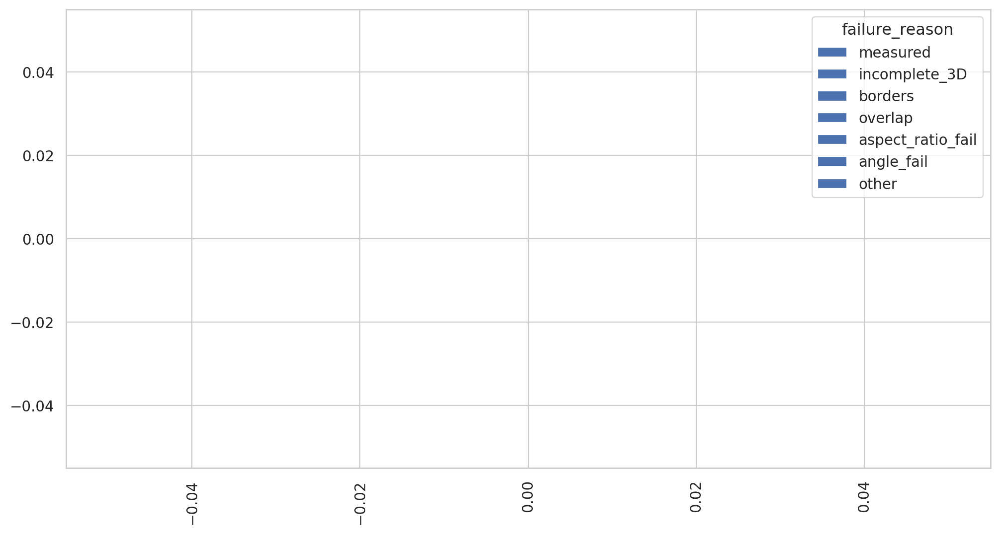

In [2]:
import pandas as pd
import numpy as np

# ==========================================================
# 0. DEFINIR GROUND TRUTH (GT)
# ==========================================================
gt = {
    "2024_11_12": {
        '13-14-43_0': {1: "caballa", 21: "fish_3", 24: "caballa", 29: "fish_3", 37: "caballa", 45: "caballa", 58: "fish_3", 62: "fish_3", 75: "fish_3", 77: "fish_3", 81: "fish_3", 82: "fish_3"},
        '13-16-54_0': {1: "caballa", 12: "fish_3", 17: "fish_3", 29: "fish_3", 41: "caballa", 49: "caballa", 53: "caballa", 59: "fish_3", 67: "fish_3", 68: "fish_3", 70: "caballa", 71: "fish_3"},
        '13-27-52_0': {1: "caballa", 2: "fish_3", 3: "fish_3", 5: "fish_3", 6: "fish_3", 8: "fish_3", 11: "caballa", 12: "fish_3", 13: "fish_3", 33: "caballa", 35: "error", 37: "caballa"},
        '13-32-16_0': {1: "fish_3", 4: "caballa", 6: "caballa", 17: "fish_3", 25: "caballa", 28: "caballa", 30: "caballa", 44: "caballa", 52: "caballa", 53: "caballa", 67: "caballa"},
        '13-34-27_0': {1: "caballa", 5: "caballa", 8: "caballa", 16: "caballa", 21: "caballa", 23: "fish_3", 28: "caballa", 30: "error", 31: "caballa"},
        '13-36-49_0': {1: "fish_3", 2: "caballa", 3: "fish_3", 6: "fish_3", 10: "fish_3", 11: "fish_3", 19: "fish_3", 20: "caballa", 24: "fish_3", 30: "caballa", 33: "fish_3", 40: "error", 41: "error", 42: "error"},
        '13-39-00_0': {1: "error", 2: "caballa", 8: "caballa", 11: "caballa", 12: "caballa", 23: "error"},
        '13-41-12_0': {2: "fish_3", 3: "caballa", 11: "caballa"},
        '13-42-45_0': {1: "caballa", 2: "fish_3", 5: "caballa", 17: "caballa", 26: "caballa"},
        '13-48-24_0': {1: "caballa", 4: "fish_3", 5: "fish_3", 10: "fish_3"},
        '13-49-20_0': {1: "caballa", 2: "fish_3", 9: "fish_3", 13: "caballa", 16: "fish_3", 25: "caballa", 29: "fish_3", 32: "fish_3", 34: "fish_3", 36: "fish_3", 41: "fish_3", 44: "fish_1", 56: "fish_1", 58: "fish_3", 60: "fish_1", 61: "fish_3", 64: "fish_3", 69: "fish_1", 72: "fish_1", 73: "caballa", 75: "fish_1", 76: "fish_1", 77: "fish_1"}
    }
}
peix_measures = {
    "lubina0": 31.5, "fish_1": 19.4, "caballa": 28.9, 
    "fish_3": 21.6, "lubina2": 33.5, "ochoa_no_cinta": 30, 
    "ochoa_cinta": 33.5, "error": -100 
}

# ==========================================================
# 1. CARGAR DATOS RAW
# ==========================================================
df_raw_agg = rutils.aggregate_results_from_root(ROOT_DIR, day_code, output_csv_path=None, results_foldername="corrected_results", csv_name="all_fish_info_raw.csv", gt=None)

# Convertir el GT a DataFrame plano para el cruce
records = []
for day, videos in gt.items():
    for video_name, tracks in videos.items():
        for track_id, label in tracks.items():
            records.append({
                "video_day": day,
                "source_folder": video_name,
                "track_id": track_id,
                "especie_gt": label,
                "true_length_cm": peix_measures.get(label, np.nan)
            })
df_gt = pd.DataFrame(records)

# ==========================================================
# 2. INYECTAR GT EN EL DATAFRAME Y LIMPIAR
# ==========================================================
# Cruzamos los datos
df_raw_agg = df_raw_agg.merge(df_gt, on=["video_day", "source_folder", "track_id"], how="left")

# Descartamos los etiquetados como "error" (true_length_cm = -100) y los que no tienen etiqueta
df_raw_agg = df_raw_agg[df_raw_agg["true_length_cm"] > 0].copy()

# Sobrescribimos el 'gt' y recalculamos el 'abs_error_cm' a nivel de frame
df_raw_agg["gt"] = df_raw_agg["true_length_cm"]
# Ojo: filtered_length está en metros, hay que pasarlo a cm para restar con el GT
df_raw_agg["abs_error_cm"] = abs((df_raw_agg["filtered_length"] * 100) - df_raw_agg["gt"]) 
df_raw_agg.drop(columns=["true_length_cm"], inplace=True)

# Imprimir información de los vídeos
video_codes = df_raw_agg["source_folder"].unique()
cprint(f"Number of video seqs is: {len(video_codes)}", "yellow")
    
# 3. Preparar el ID único del track (Con tu formato exacto)
df_raw_agg['unique_track'] = df_raw_agg['video_day'].astype(str) + "_" + df_raw_agg['source_folder'].astype(str) + "-" + df_raw_agg['track_id'].astype(str)

# ==========================================================
# ⚡ 4. CLASIFICACIÓN VECTORIZADA (Súper rápida)
# ==========================================================
ASPECT_RATIO_THR = 3.0
ANGLE_THR = 20.0

df_raw_agg = rutils.assign_failure_reasons(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR
)

display(df_raw_agg.head())


# ==========================================================
# 5. GENERAR GRÁFICAS
# ==========================================================

stacked_frames = rutils.plot_frame_failures(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    figsize_video=(12,6), 
    figsize_global=(5,5), 
    show_global=True
)

track_failures = rutils.plot_tracks_failure_distribution(
    df_raw_agg, 
    aspect_ratio_thr=ASPECT_RATIO_THR, 
    angle_thr=ANGLE_THR,
    show_global=True, 
    figsize_video=(12,6), 
    figsize_global=(5,5)
)

rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8)) 

# ==========================================================
# 6. PIPELINE DE ABLACIÓN (Ahora con los errores correctos)
# ==========================================================
df_names = ["df_raw_agg"]
df_results = {}

for df_name in df_names:
    df_raw = globals()[df_name] 
    cprint(f"\nDF NAME IS {df_name}", "cyan")
    stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
        df_raw, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
    )
    df_results[df_name] = agg_stages_dict

🔍 Buscando datos RAW en: /home/slimbook/results_fish_sizing/multiple_fish/2024_11_28
📂 Encontrados 11 archivos de resultados.

📊 TOTAL AGREGADO: 6640 líneas de datos.
Number of video seqs is: 11


,video_day,source_folder,video_name,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,...,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera,unique_track,failure_reason
0,2024_11_28,13_32_15_13-32-16_0,13-32-16_0,frame_1,0,255,-1,1,False,False,...,-156.819670,0.929948,0.271962,0.260327,33.5,6.303797,18.817303,2.286708,2024_11_28_13_32_15_13-32-16_0--1,angle_fail
1,2024_11_28,13_32_15_13-32-16_0,13-32-16_0,frame_2,0,255,1,1,False,False,...,-1.000000,-1.000000,-1.000000,0.391445,33.5,NaN,NaN,2.289246,2024_11_28_13_32_15_13-32-16_0-1,other
2,2024_11_28,13_32_15_13-32-16_0,13-32-16_0,frame_4,0,255,-1,1,False,False,...,72.726582,0.906084,0.165963,0.164807,33.5,16.903739,50.458923,2.220641,2024_11_28_13_32_15_13-32-16_0--1,angle_fail
3,2024_11_28,13_32_15_13-32-16_0,13-32-16_0,frame_5,0,255,1,1,False,False,...,18.271105,-1.000000,0.213439,0.214062,33.5,12.156142,36.286991,2.229309,2024_11_28_13_32_15_13-32-16_0-1,angle_fail
4,2024_11_28,13_32_15_13-32-16_0,13-32-16_0,frame_6,0,255,3,1,False,False,...,145.739240,1.329281,1.318206,1.274140,33.5,98.320635,293.494433,2.147395,2024_11_28_13_32_15_13-32-16_0-3,angle_fail


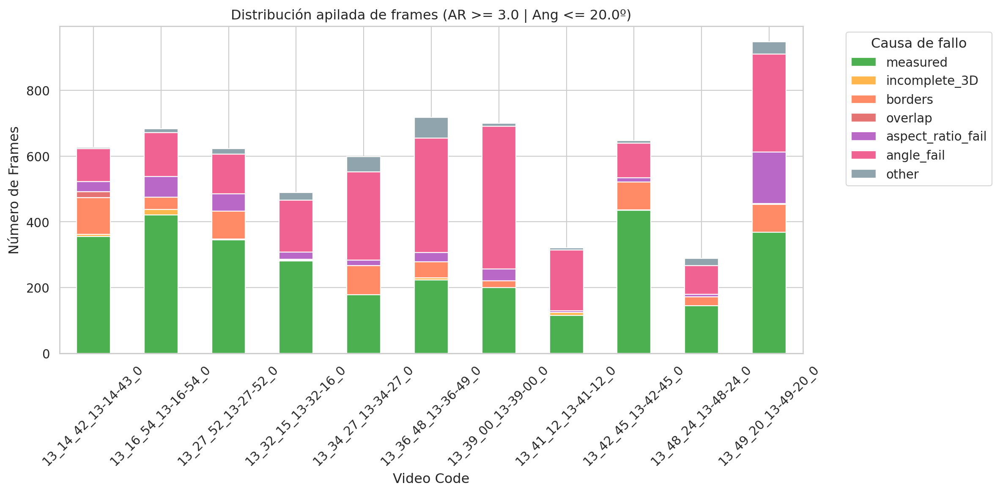

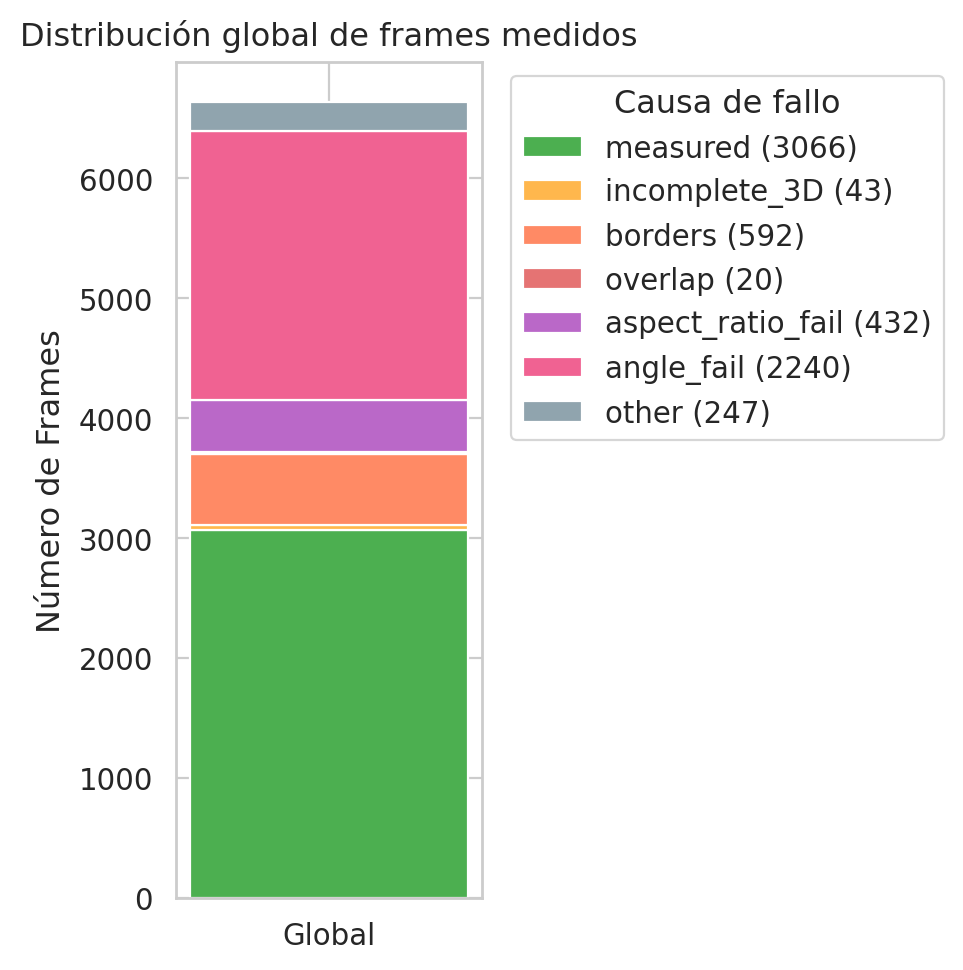


📊 TABLA 1: Distribución Global de Frames


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,3066,46.17
1,incomplete_3D,43,0.65
2,borders,592,8.92
3,overlap,20,0.30
4,aspect_ratio_fail,432,6.51
5,angle_fail,2240,33.73
6,other,247,3.72


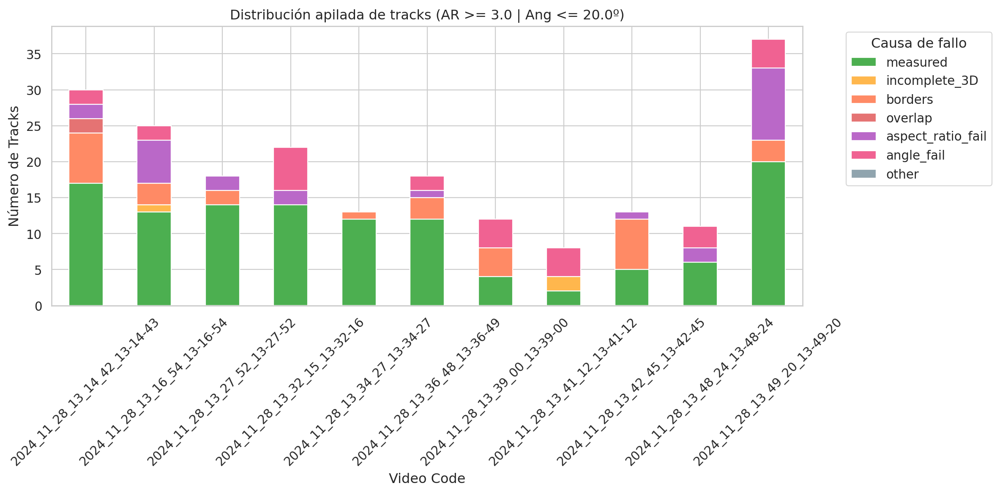

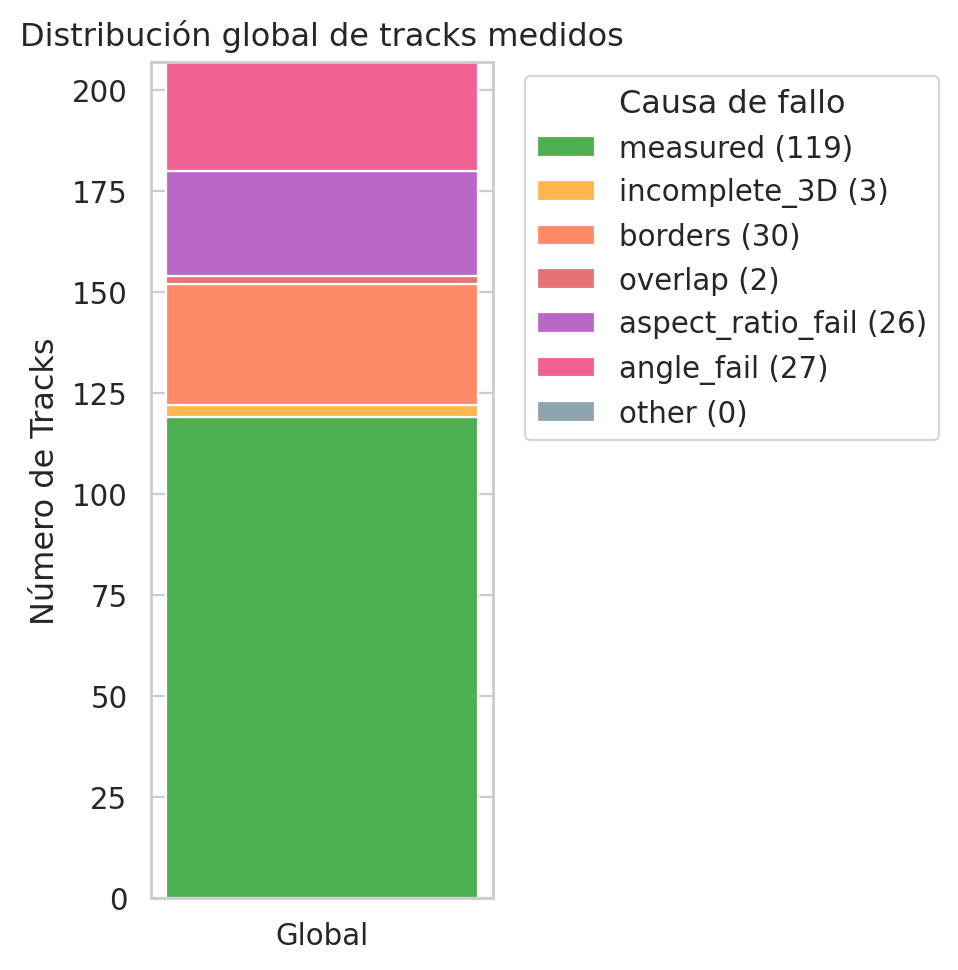


📊 TABLA 1: Distribución Global de Tracks


,Causa de Fallo,Cantidad,Porcentaje (%)
0,measured,119,57.49
1,incomplete_3D,3,1.45
2,borders,30,14.49
3,overlap,2,0.97
4,aspect_ratio_fail,26,12.56
5,angle_fail,27,13.04
6,other,0,0.00



📊 TABLA 2: Desglose por Vídeo


track_failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,angle_fail,other
source_folder,,,,,,,
2024_11_28_13_14_42_13-14-43,17,0,7,2,2,2,0
2024_11_28_13_16_54_13-16-54,13,1,3,0,6,2,0
2024_11_28_13_27_52_13-27-52,14,0,2,0,2,0,0
2024_11_28_13_32_15_13-32-16,14,0,0,0,2,6,0
2024_11_28_13_34_27_13-34-27,12,0,1,0,0,0,0
2024_11_28_13_36_48_13-36-49,12,0,3,0,1,2,0
2024_11_28_13_39_00_13-39-00,4,0,4,0,0,4,0
2024_11_28_13_41_12_13-41-12,2,2,0,0,0,4,0
2024_11_28_13_42_45_13-42-45,5,0,7,0,1,0,0


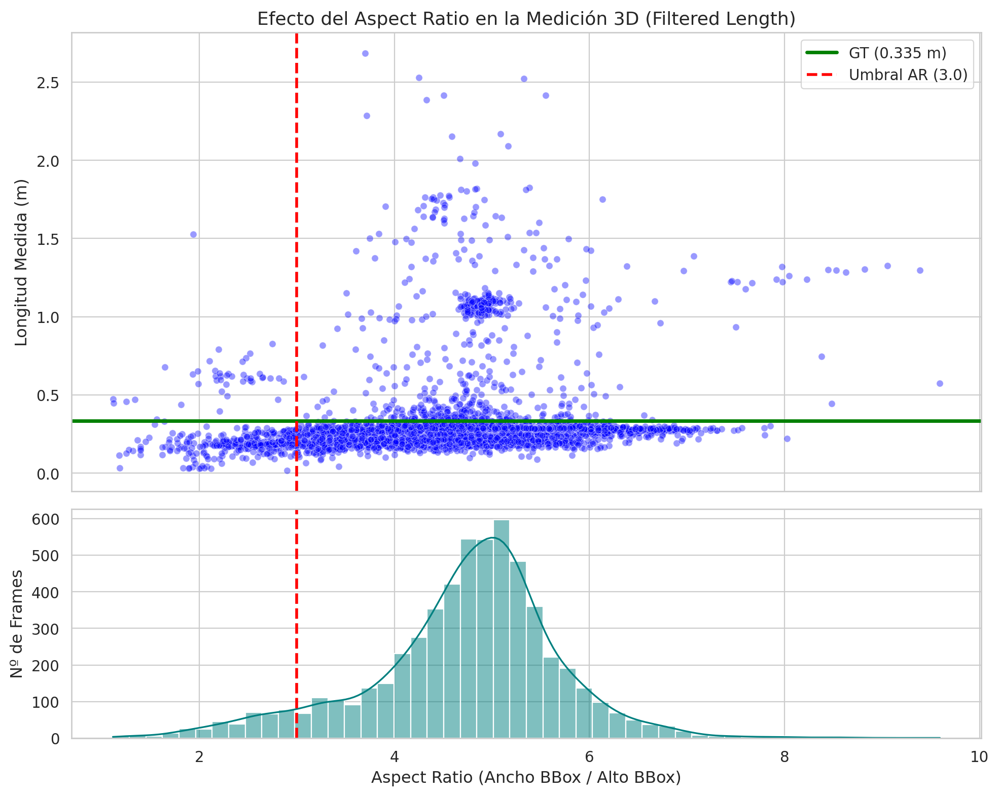

DF NAME IS df_raw_agg
ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 | 11.53 ± 14.55 cm |    5747 frames |   128 tracks
1. + Filtro: Sin Bordes                       | 11.53 ± 14.55 cm |    5747 frames |   128 tracks
2. + Filtro: Sin Solapamiento                 | 11.53 ± 14.60 cm |    5727 frames |   127 tracks
3. + Filtro: Aspect Ratio >= 3.0              | 10.57 ± 15.02 cm |    5339 frames |   113 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  7.08 ± 4.27 cm |    3099 frames |    75 tracks
5. + Filtro: is_3D_complete                   |  6.92 ± 4.12 cm |    3066 frames |    73 tracks


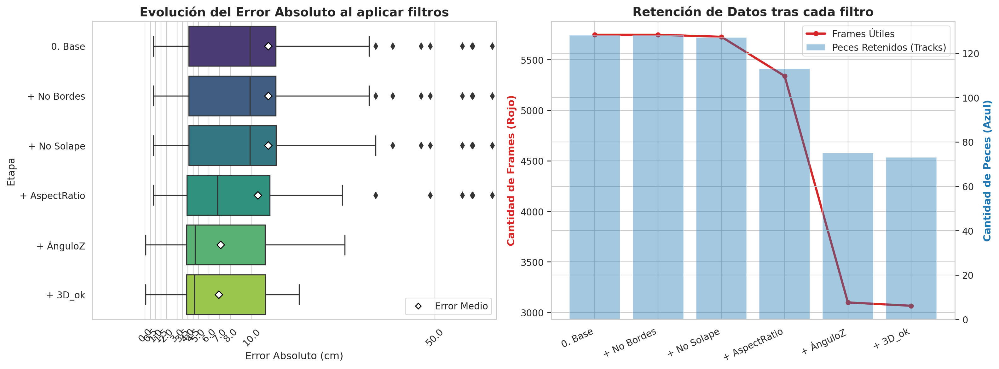

{'0. Base (HDBSCAN sin filtros)':        video_day        source_folder  video_name   frame_id  class_name  \
0     2024_11_28  13_32_15_13-32-16_0  13-32-16_0    frame_1           0   
2     2024_11_28  13_32_15_13-32-16_0  13-32-16_0    frame_4           0   
3     2024_11_28  13_32_15_13-32-16_0  13-32-16_0    frame_5           0   
4     2024_11_28  13_32_15_13-32-16_0  13-32-16_0    frame_6           0   
5     2024_11_28  13_32_15_13-32-16_0  13-32-16_0    frame_8           0   
...          ...                  ...         ...        ...         ...   
6635  2024_11_28  13_16_54_13-16-54_0  13-16-54_0  frame_476           0   
6636  2024_11_28  13_16_54_13-16-54_0  13-16-54_0  frame_477           0   
6637  2024_11_28  13_16_54_13-16-54_0  13-16-54_0  frame_482           0   
6638  2024_11_28  13_16_54_13-16-54_0  13-16-54_0  frame_482           0   
6639  2024_11_28  13_16_54_13-16-54_0  13-16-54_0  frame_483           0   

      object_id  track_id  is_3D_complete  in_image_b

In [ ]:
# 1. DICCIONARIOS CORREGIDOS (Sintaxis de diccionario puro)
gt = {
    "2024_11_12": {
        '13-14-43_0': {1: "caballa", 21: "fish_3", 24: "caballa", 29: "fish_3", 37: "caballa", 45: "caballa", 58: "fish_3", 62: "fish_3", 75: "fish_3", 77: "fish_3", 81: "fish_3", 82: "fish_3"},
        '13-16-54_0': {1: "caballa", 12: "fish_3", 17: "fish_3", 29: "fish_3", 41: "caballa", 49: "caballa", 53: "caballa", 59: "fish_3", 67: "fish_3", 68: "fish_3", 70: "caballa", 71: "fish_3"},
        '13-27-52_0': {1: "caballa", 2: "fish_3", 3: "fish_3", 5: "fish_3", 6: "fish_3", 8: "fish_3", 11: "caballa", 12: "fish_3", 13: "fish_3", 33: "caballa", 35: "error", 37: "caballa"},
        '13-32-16_0': {1: "fish_3", 4: "caballa", 6: "caballa", 17: "fish_3", 25: "caballa", 28: "caballa", 30: "caballa", 44: "caballa", 52: "caballa", 53: "caballa", 67: "caballa"},
        '13-34-27_0': {1: "caballa", 5: "caballa", 8: "caballa", 16: "caballa", 21: "caballa", 23: "fish_3", 28: "caballa", 30: "error", 31: "caballa"},
        '13-36-49_0': {1: "fish_3", 2: "caballa", 3: "fish_3", 6: "fish_3", 10: "fish_3", 11: "fish_3", 19: "fish_3", 20: "caballa", 24: "fish_3", 30: "caballa", 33: "fish_3", 40: "error", 41: "error", 42: "error"},
        '13-39-00_0': {1: "error", 2: "caballa", 8: "caballa", 11: "caballa", 12: "caballa", 23: "error"},
        '13-41-12_0': {2: "fish_3", 3: "caballa", 11: "caballa"},
        '13-42-45_0': {1: "caballa", 2: "fish_3", 5: "caballa", 17: "caballa", 26: "caballa"},
        '13-48-24_0': {1: "caballa", 4: "fish_3", 5: "fish_3", 10: "fish_3"},
        '13-49-20_0': {1: "caballa", 2: "fish_3", 9: "fish_3", 13: "caballa", 16: "fish_3", 25: "caballa", 29: "fish_3", 32: "fish_3", 34: "fish_3", 36: "fish_3", 41: "fish_3", 44: "fish_1", 56: "fish_1", 58: "fish_3", 60: "fish_1", 61: "fish_3", 64: "fish_3", 69: "fish_1", 72: "fish_1", 73: "caballa", 75: "fish_1", 76: "fish_1", 77: "fish_1"}
    }
}

peix_measures = {
    "lubina0": 31.5, "fish_1": 19.4, "caballa": 28.9, 
    "fish_3": 21.6, "lubina2": 33.5, "ochoa_no_cinta": 30, 
    "ochoa_cinta": 33.5, "error": -100 
}

# 2. CONVERTIR GT A UN DATAFRAME PLANO
records = []
for day, videos in gt.items():
    for video_name, tracks in videos.items():
        for track_id, label in tracks.items():
            records.append({
                "video_day": day,
                "source_folder": video_name,
                "track_id": track_id,
                "especie_gt": label,
                "true_length_cm": peix_measures.get(label, np.nan)
            })

df_gt = pd.DataFrame(records)

# ==========================================================
# 3. APLICARLO A TU DATAFRAME FINAL (df_final)
# (Suponiendo que tienes tu df_final agrupado por tracks)
# ==========================================================
df_final =df_raw
# Hacemos un merge (cruce) por Día, Vídeo y Track
df_final = df_final.merge(df_gt, on=["video_day", "source_folder", "track_id"], how="left")

# Filtrar: Quitar los peces que no tienen GT asignado o son "error" (-100)
df_final = df_final[df_final["true_length_cm"] > 0].copy()

# Actualizar las columnas de GT y Error Absoluto
df_final["gt_cm"] = df_final["true_length_cm"]
df_final["abs_error_cm"] = abs(df_final["calculated_length_cm"] - df_final["gt_cm"])

# Limpiar columnas temporales
df_final.drop(columns=["true_length_cm"], inplace=True)

print(f"✅ Ground Truth inyectado con éxito. Han sobrevivido {len(df_final)} tracks válidos y etiquetados.")
display(df_final.head())


# ==========================================================
# (OPCIONAL) 4. APLICARLO AL DATAFRAME RAW DE FRAMES (df_raw_agg)
# Por si quieres hacer gráficas de error a nivel de frame
# ==========================================================
# df_raw_agg = df_raw_agg.merge(df_gt, on=["video_day", "source_folder", "track_id"], how="left")
# df_raw_agg = df_raw_agg[df_raw_agg["true_length_cm"] > 0].copy()
# df_raw_agg["gt"] = df_raw_agg["true_length_cm"]
# df_raw_agg["abs_error_cm"] = abs((df_raw_agg["filtered_length"] * 100) - df_raw_agg["gt"])
# df_raw_agg.drop(columns=["true_length_cm"], inplace=True)

In [21]:
# 1. Extraer el DataFrame agregado de la última etapa (Todos los filtros aplicados)
# El nombre exacto de la llave depende de las variables que le pasaste
ultima_etapa_key = "5. + Filtro: is_3D_complete"
df_final = agg_stages_dict[ultima_etapa_key].copy()

# 2. Eliminar todos los peces con track_id == -1 (Convertimos a string por si acaso)
df_final = df_final[~df_final['track_id'].astype(str).isin(['-1', '-1.0'])]

# 3. Exigir estrictamente que tengan MÁS de 5 frames de track válidos
df_final = df_final[df_final['n_frames_validos'] > 5]

# 4. Crear de nuevo el identificador único para que te sea fácil de leer
df_final['unique_track'] = df_final['video_day'].astype(str) + "_" + df_final['source_folder'].astype(str) + "_" + df_final['track_id'].astype(str)

# 5. Ordenar el dataframe (opcional, para que quede bonito)
df_final = df_final.sort_values(by=['video_day', 'source_folder', 'track_id']).reset_index(drop=True)

# Reordenar las columnas para que el identificador quede primero
cols = ['unique_track', 'video_day', 'source_folder', 'track_id', 'n_frames_validos', 'calculated_length_cm', 'gt_cm', 'abs_error_cm', 'mean_elevation_deg']
df_final = df_final[cols]

cprint(f"🎯 Peces finales válidos y súper filtrados: {len(df_final)}", "green", attrs=["bold"])
display(df_final)

🎯 Peces finales válidos y súper filtrados: 63


,unique_track,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
0,2024_11_28_13_14_42_13-14-43_0_1,2024_11_28,13_14_42_13-14-43_0,1,34.0,29.753128,33.5,3.746872,-14.853865
1,2024_11_28_13_14_42_13-14-43_0_21,2024_11_28,13_14_42_13-14-43_0,21,22.0,21.716190,33.5,11.783810,-3.179512
2,2024_11_28_13_14_42_13-14-43_0_24,2024_11_28,13_14_42_13-14-43_0,24,21.0,29.173902,33.5,4.326098,-2.270225
3,2024_11_28_13_14_42_13-14-43_0_29,2024_11_28,13_14_42_13-14-43_0,29,38.0,28.916428,33.5,4.583572,-4.996263
4,2024_11_28_13_14_42_13-14-43_0_37,2024_11_28,13_14_42_13-14-43_0,37,11.0,30.584523,33.5,2.915477,-9.987159
...,...,...,...,...,...,...,...,...,...
58,2024_11_28_13_49_20_13-49-20_0_41,2024_11_28,13_49_20_13-49-20_0,41,27.0,20.709772,33.5,12.790228,3.005632
59,2024_11_28_13_49_20_13-49-20_0_58,2024_11_28,13_49_20_13-49-20_0,58,18.0,22.890522,33.5,10.609478,-3.573581
60,2024_11_28_13_49_20_13-49-20_0_61,2024_11_28,13_49_20_13-49-20_0,61,6.0,20.161826,33.5,13.338174,8.657564
61,2024_11_28_13_49_20_13-49-20_0_64,2024_11_28,13_49_20_13-49-20_0,64,24.0,23.826989,33.5,9.673011,4.809210


In [ ]:
df_base_noviembre = df_results["df_raw_agg_2025_05_08"]["5. + Filtro: is_3D_complete"]

display(df_base_noviembre.sort_values(by='abs_error_cm', ascending=False))

In [ ]:

# folder_code ="2024_11_12"
# ROOT_DIR = "/home/slimbook/fish_sizing/ARTICLE/1_peix/"+folder_code

# df_raw_agg_2024_11_12 =rutils.create_df_from_root_folders(root_dir= ROOT_DIR,folder_code =folder_code, output_csv_path=ROOT_DIR ,results_dir="corrected_results", gt=one_fish_gt[folder_code])

# folder_code ="2024_11_28"
# ROOT_DIR = "/home/slimbook/fish_sizing/ARTICLE/1_peix/"+folder_code
# df_raw_agg_2024_11_28 = rutils.create_df_from_root_folders(root_dir= ROOT_DIR,folder_code =folder_code, output_csv_path=ROOT_DIR ,results_dir="corrected_results", gt=one_fish_gt[folder_code])


# folder_code ="2025_05_08"
# ROOT_DIR = "/home/slimbook/fish_sizing/ARTICLE/1_peix/"+folder_code
# df_raw_agg_2025_05_08 = rutils.create_df_from_root_folders(root_dir= ROOT_DIR,folder_code =folder_code, output_csv_path=ROOT_DIR ,results_dir="corrected_results", gt=one_fish_gt[folder_code])

# # Lista de DataFrames
# dfs = [
#     df_raw_agg_2024_11_12,
#     df_raw_agg_2024_11_28,
#     df_raw_agg_2025_05_08
# ]

# # Concatenar verticalmente (apilarlos)
# df_raw_agg_pool = pd.concat(dfs, axis=0, ignore_index=True)

# # Revisar
# print(df_raw_agg_pool.shape)
# print(df_raw_agg_pool.head())

# folder_code ="2025_08_21"
# ROOT_DIR = "/home/slimbook/fish_sizing/ARTICLE/1_peix/"+folder_code
# df_raw_agg_2025_08_21 = rutils.create_df_from_root_folders(root_dir= ROOT_DIR,folder_code =folder_code, output_csv_path=ROOT_DIR ,results_dir="corrected_results", gt=one_fish_gt[folder_code])


# df_raw_agg_2025_08_21.head()



Buscando datos RAW en: /home/slimbook/fish_sizing/ARTICLE/1_peix/2024_11_12
Procesando csv:  /home/slimbook/fish_sizing/ARTICLE/1_peix/2024_11_12/10_44_11/0/results_article_basic_nou/corrected_results/10_44_11_0_raw.csv
FOLDER CODE IS:  2024_11_12
Procesando csv:  /home/slimbook/fish_sizing/ARTICLE/1_peix/2024_11_12/10_54_07/0/results_article_basic_nou/corrected_results/10_54_07_0_raw.csv
FOLDER CODE IS:  2024_11_12
Procesando csv:  /home/slimbook/fish_sizing/ARTICLE/1_peix/2024_11_12/11_10_50/0/results_article_basic_nou/corrected_results/11_10_50_0_raw.csv
FOLDER CODE IS:  2024_11_12
Procesando csv:  /home/slimbook/fish_sizing/ARTICLE/1_peix/2024_11_12/11_00_27/0/results_article_basic_nou/corrected_results/11_00_27_0_raw.csv
FOLDER CODE IS:  2024_11_12
Procesando csv:  /home/slimbook/fish_sizing/ARTICLE/1_peix/2024_11_12/10_58_20/0/results_article_basic_nou/corrected_results/10_58_20_0_raw.csv
FOLDER CODE IS:  2024_11_12
Procesando csv:  /home/slimbook/fish_sizing/ARTICLE/1_peix/2024_

,video_day,source_folder,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,is_front_fish,...,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera
0,2025_08_21,12_09_03_compressed,frame_0,0,255,1,-1,False,False,True,...,NaN,67.619721,37.106544,-1.0,0.322840,0.316668,29.1,3.184030,11.709446,1.663082
1,2025_08_21,12_09_03_compressed,frame_1,0,255,1,-1,False,False,True,...,NaN,66.080659,37.133779,-1.0,0.308119,0.328139,29.1,1.711855,6.615414,1.659265
2,2025_08_21,12_09_03_compressed,frame_2,0,255,1,-1,False,False,True,...,NaN,50.109826,25.106295,-1.0,0.249701,0.228324,29.1,4.129863,13.598142,1.693085
3,2025_08_21,12_09_03_compressed,frame_3,0,255,1,-1,False,False,True,...,NaN,58.247246,14.057908,-1.0,0.300613,0.282332,29.1,0.961328,4.018435,1.678158
4,2025_08_21,12_09_03_compressed,frame_4,0,255,1,-1,False,False,True,...,NaN,44.696387,13.541004,-1.0,0.257552,0.244369,29.1,3.344761,10.881526,1.710066


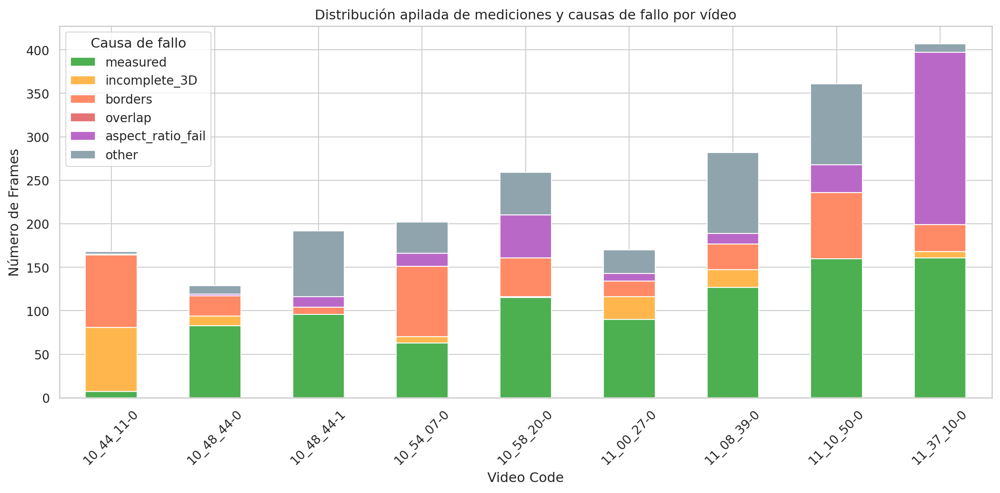

Conteo global de frames por causa:
      failure_reason  count
0           measured    902
1      incomplete_3D    146
2            borders    395
3            overlap      0
4  aspect_ratio_fail    330
5              other    397


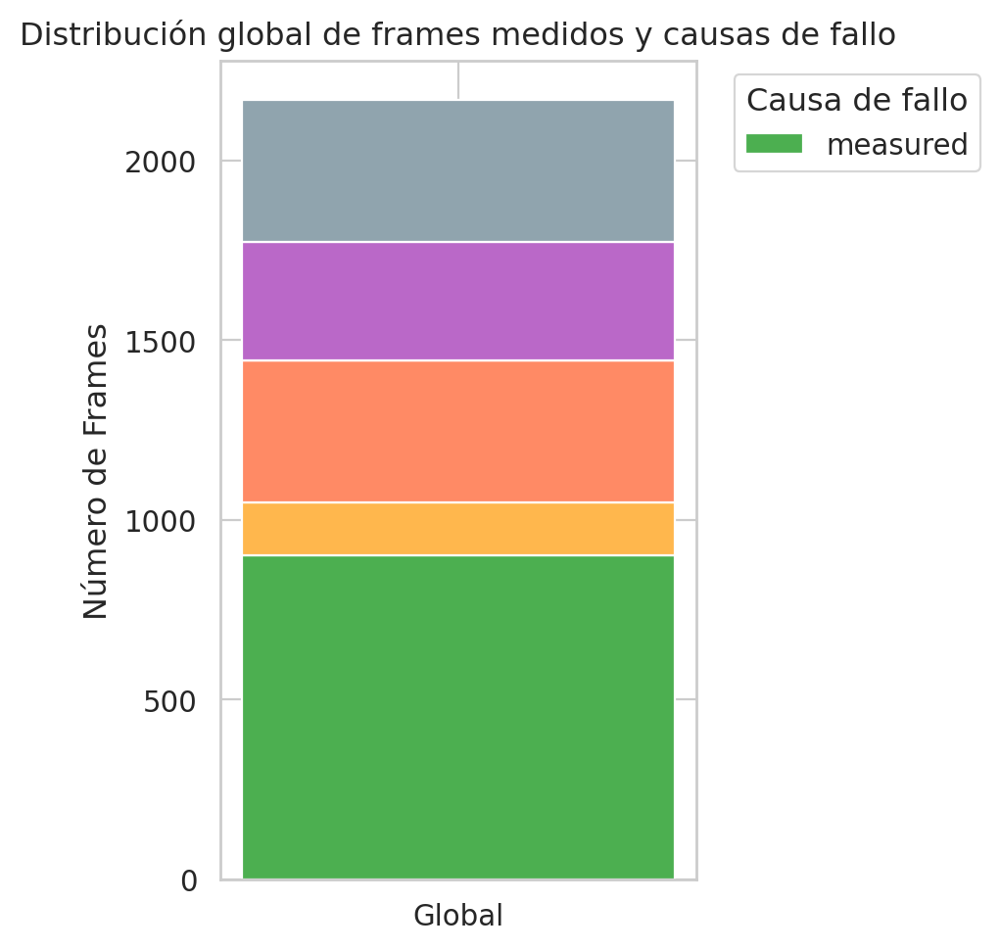

failure_reason,measured,incomplete_3D,borders,overlap,aspect_ratio_fail,other
source_folder,,,,,,
10_44_11-0,7,74,83,0,1,3
10_48_44-0,83,11,23,0,2,10
10_48_44-1,96,0,8,0,12,76
10_54_07-0,63,7,81,0,15,36
10_58_20-0,115,1,45,0,49,49
11_00_27-0,90,26,18,0,9,27
11_08_39-0,127,20,30,0,12,93
11_10_50-0,160,0,76,0,32,93
11_37_10-0,161,7,31,0,198,10


In [ ]:


df_raw_agg['unique_track'] = df_raw_agg['source_folder'].astype(str) + "_" + df_raw_agg['track_id'].astype(str)
df_raw_agg["failure_reason"] = df_raw_agg.apply(
    lambda row: rutils.classify_failure(row, ASPECT_RATIO_THR=ASPECT_RATIO_THR),
    axis=1
)


rutils.plot_frame_failures(df_raw_agg, figsize_video=(12,6), figsize_global=(5,5), show_global=True)

rutils.plot_tracks_failure_distribution(df_raw_agg, aspect_ratio_thr=3.0, show_global=True, figsize_video=(12,6), figsize_global=(5,5))
rutils.plot_aspect_ratio_vs_length(df_raw_agg, ASPECT_RATIO_THR=ASPECT_RATIO_THR, figsize=(10, 8))

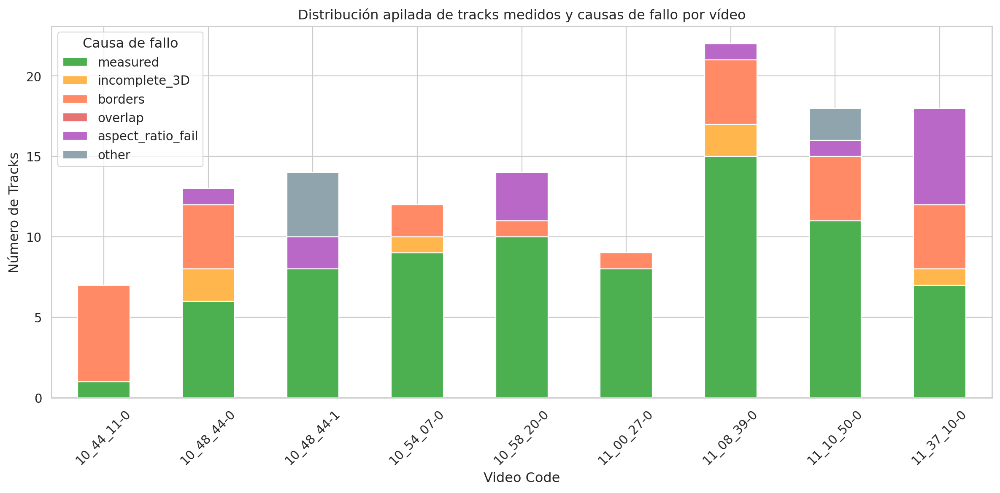

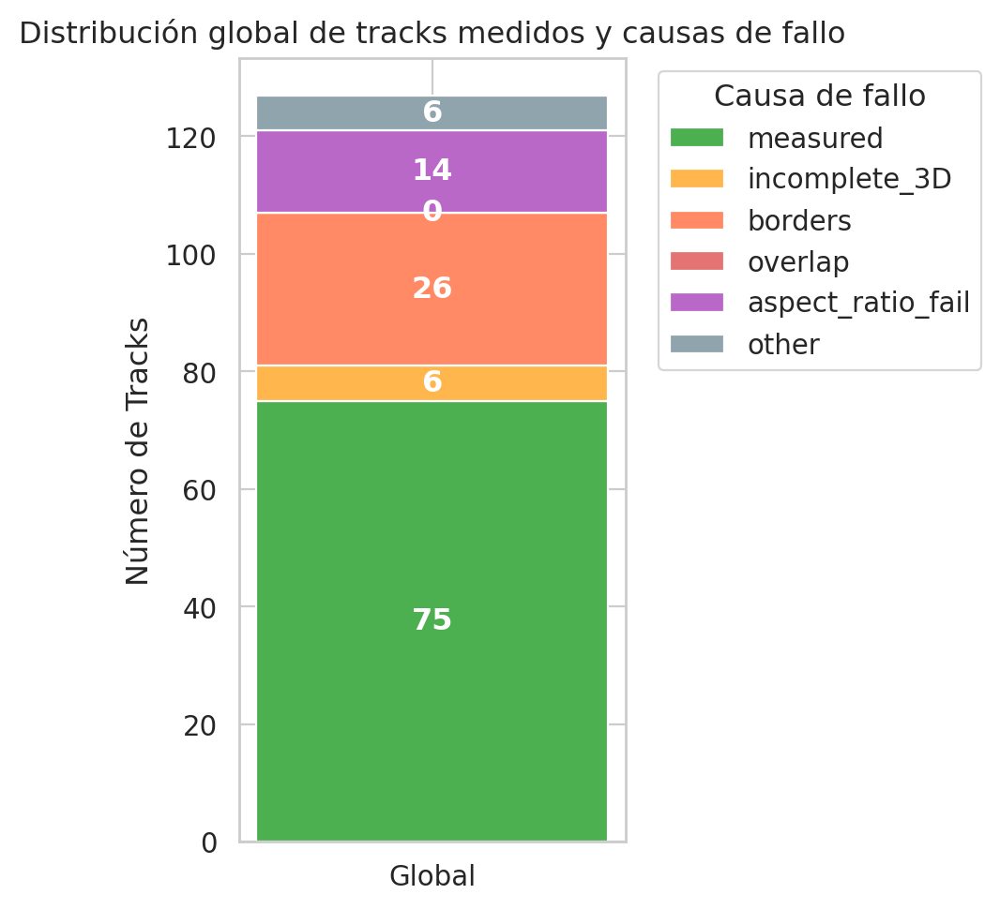

,unique_track,track_failure_reason,source_folder
0,10_44_11-0_-1,borders,10_44_11-0
1,10_44_11-0_13,borders,10_44_11-0
2,10_44_11-0_15,borders,10_44_11-0
3,10_44_11-0_3,measured,10_44_11-0
4,10_44_11-0_7,borders,10_44_11-0
...,...,...,...
122,11_37_10-0_4,aspect_ratio_fail,11_37_10-0
123,11_37_10-0_41,aspect_ratio_fail,11_37_10-0
124,11_37_10-0_44,measured,11_37_10-0
125,11_37_10-0_45,measured,11_37_10-0


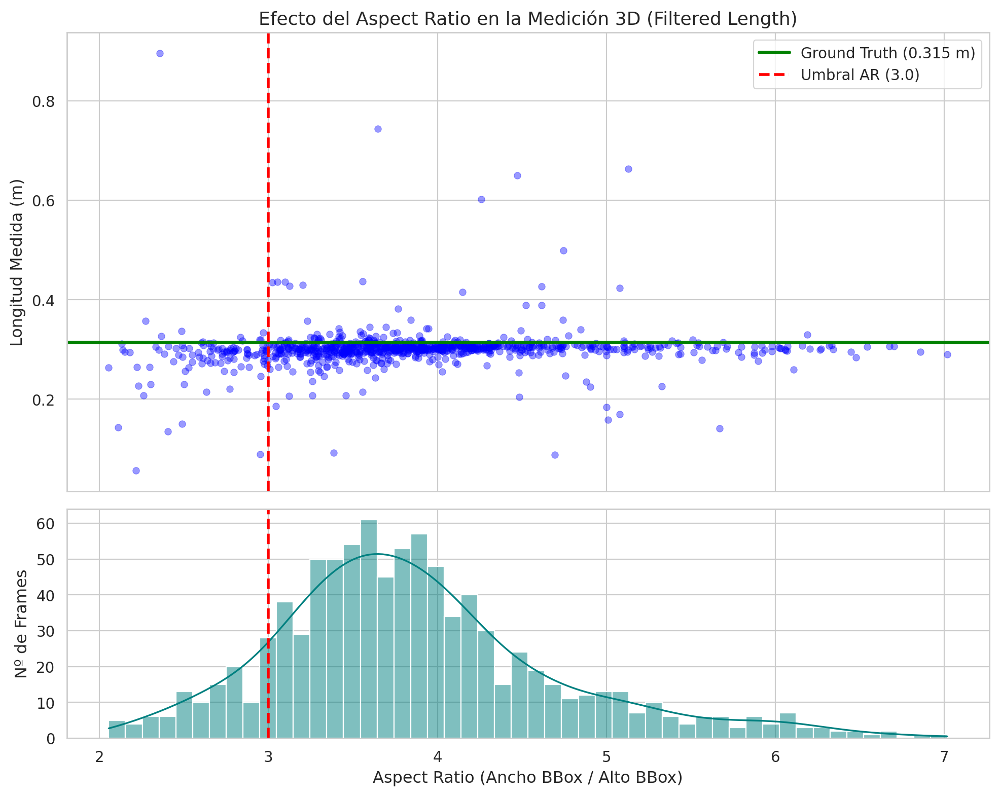

DF NAME IS df_raw_agg_2024_11_12
ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  1.62 ± 2.78 cm |     902 frames |    45 tracks
1. + Filtro: Sin Bordes                       |  1.62 ± 2.78 cm |     902 frames |    45 tracks
2. + Filtro: Sin Solapamiento                 |  1.62 ± 2.78 cm |     902 frames |    45 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  1.19 ± 1.91 cm |     795 frames |    40 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  1.28 ± 2.97 cm |     409 frames |    26 tracks
5. + Filtro: is_3D_complete                   |  1.28 ± 2.97 cm |     409 frames |    26 tracks


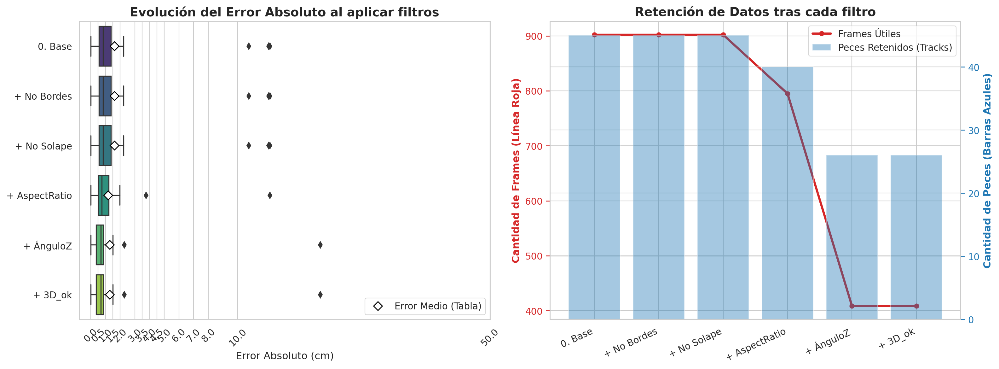

DF NAME IS df_raw_agg_2024_11_28
ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  3.70 ± 7.49 cm |    3216 frames |    62 tracks
1. + Filtro: Sin Bordes                       |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
2. + Filtro: Sin Solapamiento                 |  2.20 ± 4.46 cm |    2996 frames |    54 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  1.57 ± 3.10 cm |    2876 frames |    52 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  0.67 ± 1.00 cm |    2098 frames |    38 tracks
5. + Filtro: is_3D_complete                   |  0.67 ± 1.00 cm |    2096 frames |    38 tracks


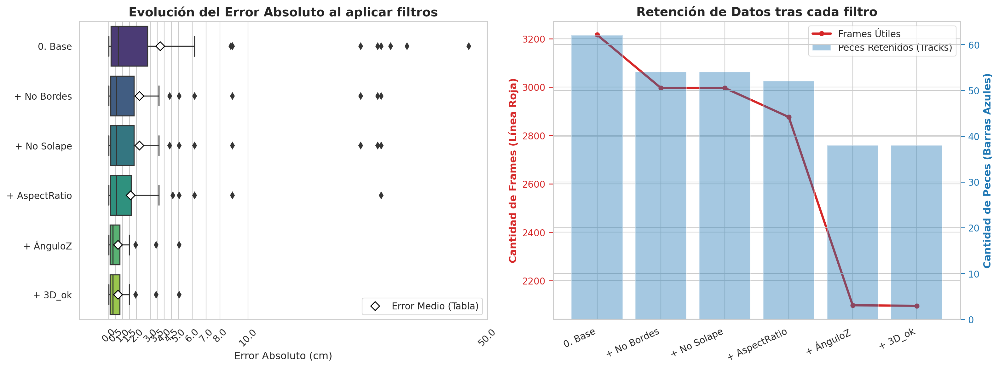

DF NAME IS df_raw_agg_2025_05_08
ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  3.34 ± 2.06 cm |     134 frames |     5 tracks
1. + Filtro: Sin Bordes                       |  3.34 ± 2.06 cm |     134 frames |     5 tracks
2. + Filtro: Sin Solapamiento                 |  3.34 ± 2.06 cm |     134 frames |     5 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  3.42 ± 1.97 cm |     116 frames |     5 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  2.18 ± 0.51 cm |      87 frames |     3 tracks
5. + Filtro: is_3D_complete                   |  2.18 ± 0.51 cm |      87 frames |     3 tracks


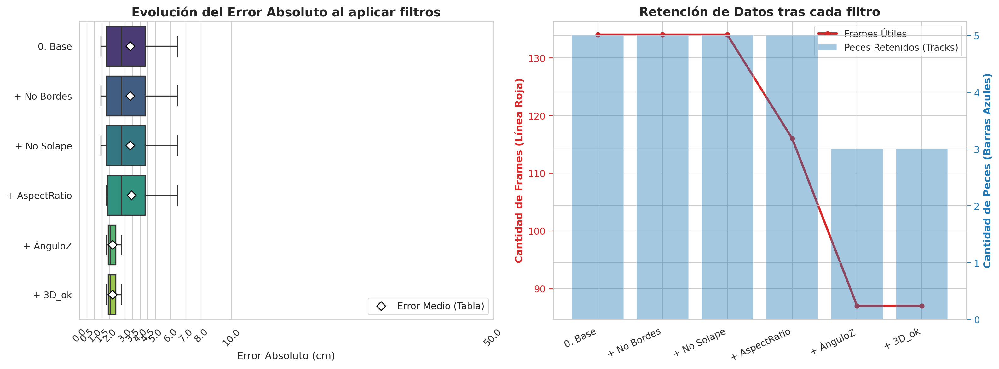

DF NAME IS df_raw_agg_2025_08_21
ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  4.13 ± 3.73 cm |   14295 frames |    50 tracks
1. + Filtro: Sin Bordes                       |  4.13 ± 3.73 cm |   14295 frames |    50 tracks
2. + Filtro: Sin Solapamiento                 |  4.14 ± 3.75 cm |   14278 frames |    50 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  2.98 ± 3.34 cm |    5941 frames |    32 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  1.24 ± 1.77 cm |    1109 frames |    25 tracks
5. + Filtro: is_3D_complete                   | --- VACÍO ---


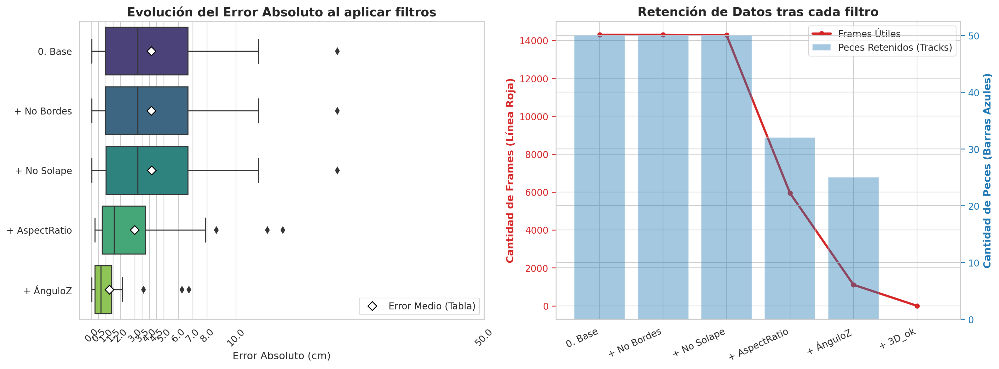

DF NAME IS df_raw_agg_pool
ETAPA DEL PIPELINE (CASCADA)                  | ERROR MEDIO     | FRAMES VIVOS    | PECES (TRACKS)
----------------------------------------------------------------------------------------------------
0. Base (HDBSCAN sin filtros)                 |  2.85 ± 5.92 cm |    4252 frames |   112 tracks
1. + Filtro: Sin Bordes                       |  2.00 ± 3.72 cm |    4032 frames |   104 tracks
2. + Filtro: Sin Solapamiento                 |  2.00 ± 3.72 cm |    4032 frames |   104 tracks
3. + Filtro: Aspect Ratio >= 3.0              |  1.51 ± 2.64 cm |    3787 frames |    97 tracks
4. + Filtro: Ángulo Z <= 20.0º                |  0.97 ± 2.01 cm |    2594 frames |    67 tracks
5. + Filtro: is_3D_complete                   |  0.97 ± 2.01 cm |    2592 frames |    67 tracks


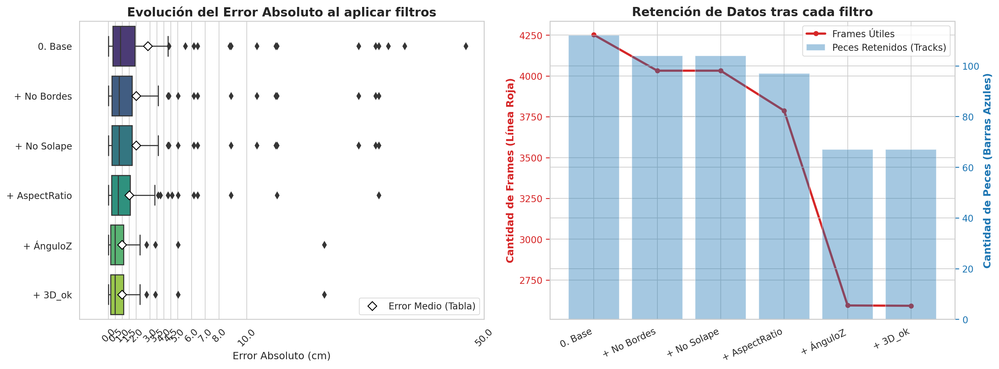

{'0. Base (HDBSCAN sin filtros)':        video_day source_folder   frame_id  class_name  object_id  track_id  \
66    2024_11_12    10_44_11_0  frame_108           0        255         3   
70    2024_11_12    10_44_11_0  frame_115           0        255         3   
72    2024_11_12    10_44_11_0  frame_118           0        255         3   
77    2024_11_12    10_44_11_0  frame_126           0        255         3   
120   2024_11_12    10_44_11_0  frame_285           0        255         3   
...          ...           ...        ...         ...        ...       ...   
9563  2025_05_08    11_14_52_0  frame_623           0        255         1   
9564  2025_05_08    11_14_52_0  frame_625           0        255         1   
9565  2025_05_08    11_14_52_0  frame_626           0        255         1   
9566  2025_05_08    11_14_52_0  frame_627           0        255         1   
9567  2025_05_08    11_14_52_0  frame_628           0        255         1   

      is_3D_complete  in_imag

In [6]:
df_names = [
    "df_raw_agg_2024_11_12",
    "df_raw_agg_2024_11_28",
    "df_raw_agg_2025_05_08",
    "df_raw_agg_2025_08_21",
    "df_raw_agg_pool"
]

df_results={}
for df_name in df_names:
    df_raw = globals()[df_name]  # <-- toma el DataFrame real
    cprint(f"DF NAME IS {df_name}","cyan")
    stages_dict, agg_stages_dict = rutils.plot_ablation_pipeline(
        df_raw, ASPECT_RATIO_THR=ASPECT_RATIO_THR, ANGLE_THR=ANGLE_THR   
    )
    df_results[df_name] = agg_stages_dict
    
print(stages_dict)

In [37]:


# List to store the summary statistics for each day
summary_stats = []

# Iterate over the results dictionary you just created
for df_name, agg_stages_dict in df_results.items():
    
    # 1. Dynamically get the key of the LAST filtering stage
    # (This ensures it won't break if you change the filter name in the future)
    last_stage_key = list(agg_stages_dict.keys())[-1]
    df_final = agg_stages_dict[last_stage_key]
    
    # If the dataframe is empty after applying all filters, warn and skip
    if df_final.empty:
        print(f"⚠️ {df_name}: No fish survived all the filters.")
        last_stage_key = list(agg_stages_dict.keys())[-2]
        df_final = agg_stages_dict[last_stage_key]
        # continue
        
    # =========================================================
    # 2. SAVE THE CSV FOR THE DAY (OR THE POOL)
    # =========================================================
    # Clean up the name so the file looks nice (e.g., 2024_11_12_final_filtered.csv)
    filename = f"{df_name.replace('df_raw_agg_', '')}_final_filtered.csv"
    
    df_final.to_csv(filename, index=False)
    print(f"💾 Saved CSV with clean tracks: {filename}")
    
    # =========================================================
    # 3. CALCULATE METRICS: MEAN, MEDIAN, AND STANDARD DEVIATION
    # =========================================================
    mean_err = df_final['abs_error_cm'].mean()
    median_err = df_final['abs_error_cm'].median()
    std_err = df_final['abs_error_cm'].std()
    
    total_fish = len(df_final)
    
    # Save the summary for this day in our list
    summary_stats.append({
        "dataset": df_name.replace('df_raw_agg_', ''),
        "total_valid_tracks": total_fish,
        "mean_abs_error_cm": round(mean_err, 2),
        "median_abs_error_cm": round(median_err, 2),
        "std_abs_error_cm": round(std_err, 2)
    })

# =========================================================
# 4. SAVE THE SUMMARY OF ALL METRICS
# =========================================================
if summary_stats:
    df_summary = pd.DataFrame(summary_stats)
    
    # Save the summary table
    df_summary.to_csv("daily_statistics_summary.csv", index=False)
    print("\n📊 Statistics summary saved in 'daily_statistics_summary.csv':")
    
    # Display it on the screen so you can see it instantly
    display(df_summary)

💾 Saved CSV with clean tracks: 2024_11_12_final_filtered.csv
💾 Saved CSV with clean tracks: 2024_11_28_final_filtered.csv
💾 Saved CSV with clean tracks: 2025_05_08_final_filtered.csv
⚠️ df_raw_agg_2025_08_21: No fish survived all the filters.
💾 Saved CSV with clean tracks: 2025_08_21_final_filtered.csv
💾 Saved CSV with clean tracks: pool_final_filtered.csv

📊 Statistics summary saved in 'daily_statistics_summary.csv':


,dataset,total_valid_tracks,mean_abs_error_cm,median_abs_error_cm,std_abs_error_cm
0,2024_11_12,26,1.28,0.68,2.97
1,2024_11_28,38,0.67,0.30,1.00
2,2025_05_08,3,2.18,2.02,0.51
3,2025_08_21,25,1.24,0.65,1.77
4,pool,67,0.97,0.48,2.01


In [ ]:
df_results["df_raw_agg_2024_11_12"].keys()

dict_keys(['0. Base (HDBSCAN sin filtros)', '1. + Filtro: Sin Bordes', '2. + Filtro: Sin Solapamiento', '3. + Filtro: Aspect Ratio >= 3.0', '4. + Filtro: Ángulo Z <= 20.0º', '5. + Filtro: is_3D_complete'])

In [40]:
# df_base_noviembre = df_results["df_raw_agg_2024_11_12"]["5. + Filtro: is_3D_complete"]
df_base_noviembre = df_results["df_raw_agg_2025_05_08"]["5. + Filtro: is_3D_complete"]

display(df_base_noviembre.sort_values(by='abs_error_cm', ascending=False))

,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
1,2025_05_08,11_20_56_1,7,7.0,36.249052,33.5,2.749052,8.377704
0,2025_05_08,11_20_56_1,1,64.0,35.519265,33.5,2.019265,-4.960565
2,2025_05_08,11_20_56_2,1,15.0,31.724447,33.5,1.775553,13.068193


In [48]:
# df_base_noviembre = df_results["df_raw_agg_2024_11_12"]["5. + Filtro: is_3D_complete"]
df_base_noviembre = df_results["df_raw_agg_2025_08_21"]["4. + Filtro: Ángulo Z <= 20.0º"]


# display(df_base_noviembre.sort_values(by='abs_error_cm', ascending=False))
# Con los paréntesis mágicos añadidos:
# peces_filtrados = df_raw_agg_2025_05_08[(df_raw_agg_2025_05_08["source_folder"] == "11_20_56_1") & (df_raw_agg_2025_05_08["track_id"] == 1)]

display(df_base_noviembre.sort_values(by='abs_error_cm', ascending=False))

,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
12,2025_08_21,13_34_24_compressed,1,22.0,22.383810,29.1,6.716190,-12.395710
17,2025_08_21,13_40_21_compressed,1,28.0,22.862839,29.1,6.237161,-10.119373
8,2025_08_21,12_13_38_compressed,9,6.0,25.518651,29.1,3.581349,8.080891
6,2025_08_21,12_12_06_compressed,1,58.0,31.219274,29.1,2.119274,-5.034773
15,2025_08_21,13_37_28_compressed,3,39.0,30.811279,29.1,1.711279,-6.980517
24,2025_08_21,13_58_40_compressed,1,60.0,30.650179,29.1,1.550179,-4.382477
3,2025_08_21,12_09_03_compressed,1,80.0,30.493932,29.1,1.393932,0.879132
21,2025_08_21,13_55_37_compressed,1,9.0,28.031978,29.1,1.068022,-14.237562
5,2025_08_21,12_10_35_compressed,1,44.0,29.978700,29.1,0.878700,-1.185763
7,2025_08_21,12_13_38_compressed,1,27.0,29.802136,29.1,0.702136,0.989930


In [60]:
# df_base_noviembre = df_results["df_raw_agg_2024_11_12"]["5. + Filtro: is_3D_complete"]
df_base_noviembre = df_results["df_raw_agg_2025_08_21"]["4. + Filtro: Ángulo Z <= 20.0º"]
pd.set_option('display.max_rows', None)

mask_2 = df_raw_agg_2025_08_21['in_image_borders'] == False
mask_3 = mask_2 & (df_raw_agg_2025_08_21['does_overlap'] == False)
mask_4 = mask_3 & (df_raw_agg_2025_08_21['aspect_ratio'] >= ASPECT_RATIO_THR)
mask_5 = mask_4 & df_raw_agg_2025_08_21['elevation_deg'].notna() & (df_raw_agg_2025_08_21['elevation_deg'].abs() <= ANGLE_THR)


pd.set_option('display.max_columns', None)
# display(df_base_noviembre.sort_values(by='abs_error_cm', ascending=False))
# Con los paréntesis mágicos añadidos:
# peces_filtrados = df_raw_agg_2025_05_08[(df_raw_agg_2025_05_08["source_folder"] == "11_20_56_1") & (df_raw_agg_2025_05_08["track_id"] == 1)]

# display(df_base_noviembre.sort_values(by='abs_error_cm', ascending=False))
peces_filtrados = df_raw_agg_2025_08_21[mask_5]
# peces_filtrados = df_raw_agg_2025_08_21[(df_raw_agg_2025_08_21["source_folder"] == "13_34_24_compressed") & (df_raw_agg_2025_08_21["track_id"] == 1)& (df_raw_agg_2025_08_21["filtered_length"] > 0.0)]
peces_filtrados_2 = peces_filtrados[(peces_filtrados["source_folder"] == "13_34_24_compressed") & (peces_filtrados["track_id"] == 1)]
peces_filtrados_2

,video_day,source_folder,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,is_front_fish,aspect_ratio,fish_3d_ok,overlapping_fish_ids,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera
13236,2025_08_21,13_34_24_compressed,frame_189,0,255,1,-1,False,False,True,3.081761,False,[],NaN,-1.000000,-1.000000,-1.0,-1.000000,0.163978,29.1,129.100000,NaN,1.880401
13237,2025_08_21,13_34_24_compressed,frame_190,0,255,1,-1,False,False,True,3.098385,False,[],NaN,-1.000000,-1.000000,-1.0,-1.000000,0.239603,29.1,129.100000,NaN,1.885322
13254,2025_08_21,13_34_24_compressed,frame_207,0,255,1,-1,False,False,True,3.375000,False,[],NaN,-2.740807,38.064424,-1.0,0.138771,0.155435,29.1,15.222909,51.982384,1.876011
13263,2025_08_21,13_34_24_compressed,frame_216,0,255,1,-1,False,False,True,3.308642,False,[],NaN,3.525308,32.337568,-1.0,0.159559,0.221264,29.1,13.144136,44.789396,1.873298
13271,2025_08_21,13_34_24_compressed,frame_224,0,255,1,-1,False,False,True,3.422484,False,[],NaN,-11.721629,28.570485,-1.0,0.205300,0.182580,29.1,8.570006,28.961958,1.863110
13316,2025_08_21,13_34_24_compressed,frame_269,0,255,1,-1,False,False,True,3.036642,False,[],NaN,-14.660906,28.090564,-1.0,0.210001,0.230033,29.1,8.099916,27.335350,1.866837
13356,2025_08_21,13_34_24_compressed,frame_309,0,255,1,-1,False,False,True,3.008439,False,[],NaN,-17.467793,51.502178,-1.0,0.184132,0.160769,29.1,10.686774,36.286415,1.874723
13379,2025_08_21,13_34_24_compressed,frame_332,0,255,1,-1,False,False,True,3.558824,False,[],NaN,-14.459370,36.408593,-1.0,0.210689,0.222620,29.1,8.031064,27.097108,1.868738
13404,2025_08_21,13_34_24_compressed,frame_357,0,255,1,-1,False,False,True,3.378831,False,[],NaN,-15.312136,31.786606,-1.0,0.223018,0.228640,29.1,6.798236,22.831266,1.875405
13406,2025_08_21,13_34_24_compressed,frame_359,0,255,1,-1,False,False,True,3.402062,False,[],NaN,-19.055829,37.525502,-1.0,0.219005,0.238370,29.1,7.199543,24.219870,1.865344


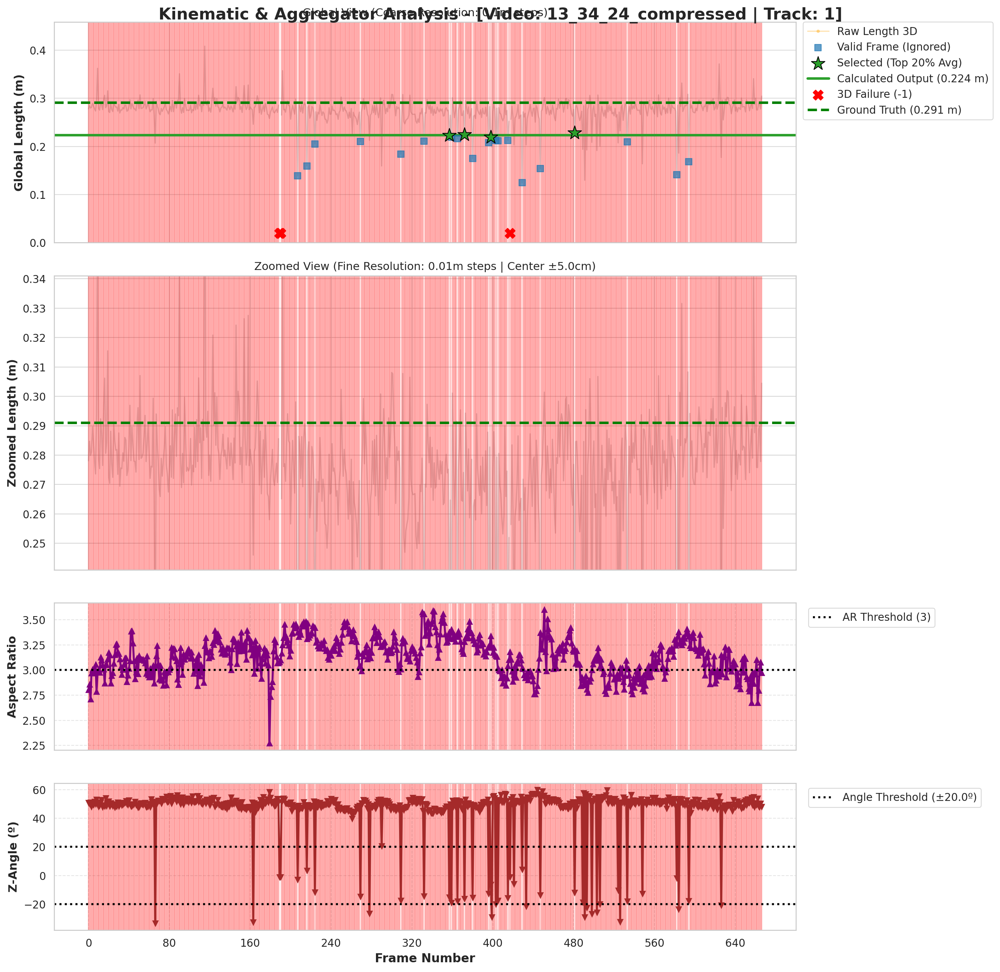

In [54]:
rutils.plot_track_evolution_detailed(df_raw_agg_2025_08_21, "13_34_24_compressed", 1, ar_thr=3, angle_thr=20.0)

In [24]:
df_raw_agg_2024_11_12[(df_raw_agg_2024_11_12["source_folder"] == "11_10_50_0") & (df_raw_agg_2024_11_12["track_id"] == -1)]

,video_day,source_folder,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,is_front_fish,...,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera
375,2024_11_12,11_10_50_0,frame_8,0,255,-1,1,False,False,True,...,NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN
377,2024_11_12,11_10_50_0,frame_15,0,255,-1,1,False,False,True,...,NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN
391,2024_11_12,11_10_50_0,frame_29,0,255,-1,1,False,False,True,...,[ -0.55305 -0.06401 0.83069],56.218996,-171.315678,0.317581,0.318348,0.316453,31.5,0.334780,1.062793,1.599564
392,2024_11_12,11_10_50_0,frame_30,0,255,-1,1,False,False,True,...,[ -0.47474 -0.013102 0.88003],61.866096,-177.666040,0.332744,0.329194,0.316637,31.5,1.419433,4.506138,1.594793
393,2024_11_12,11_10_50_0,frame_31,0,255,-1,1,False,False,True,...,[ -0.36194 0.014751 0.93208],61.067630,-179.215706,0.489296,0.322779,0.312782,31.5,0.777868,2.469423,1.583742
440,2024_11_12,11_10_50_0,frame_99,0,255,-1,1,False,False,True,...,NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN
446,2024_11_12,11_10_50_0,frame_107,0,255,-1,1,False,False,True,...,[ -0.38013 0.1128 0.91803],-14.081441,96.014717,0.330086,0.088652,0.093684,31.5,22.634834,71.856615,1.966287
448,2024_11_12,11_10_50_0,frame_109,0,255,-1,1,False,False,True,...,[ -0.3824 0.26968 0.88377],12.512155,104.676604,0.364178,0.184451,0.178333,31.5,13.054935,41.444238,1.983479
450,2024_11_12,11_10_50_0,frame_118,0,255,-1,0,True,False,True,...,NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN
451,2024_11_12,11_10_50_0,frame_119,0,255,-1,0,True,False,True,...,NaN,NaN,NaN,NaN,NaN,NaN,31.5,NaN,NaN,NaN


In [21]:
display(df_base_noviembre.sort_values(by='abs_error_cm', ascending=False))

,video_day,source_folder,track_id,n_frames_validos,calculated_length_cm,gt_cm,abs_error_cm,mean_elevation_deg
19,2024_11_12,11_10_50_0,-1,5.0,15.893202,31.5,15.606798,7.140087
14,2024_11_12,11_00_27_0,21,5.0,29.229843,31.5,2.270157,12.900353
13,2024_11_12,11_00_27_0,12,13.0,32.999723,31.5,1.499723,-10.594451
3,2024_11_12,10_48_44_1,-1,6.0,30.176761,31.5,1.323239,-1.601370
0,2024_11_12,10_48_44_0,-1,13.0,30.195400,31.5,1.304600,1.777572
12,2024_11_12,11_00_27_0,1,12.0,32.759781,31.5,1.259781,-3.291797
2,2024_11_12,10_48_44_0,43,5.0,30.625299,31.5,0.874701,-7.515415
16,2024_11_12,11_08_39_0,20,5.0,30.669908,31.5,0.830092,3.256315
17,2024_11_12,11_08_39_0,31,14.0,30.724233,31.5,0.775767,-6.147942
7,2024_11_12,10_54_07_0,-1,9.0,30.750411,31.5,0.749589,5.684229


Calculating interaction between Aspect Ratio and Angle...


Evaluating Angles:   0%|          | 0/6 [00:00<?, ?it/s]

Evaluating Angles: 100%|██████████| 6/6 [00:03<00:00,  1.83it/s]


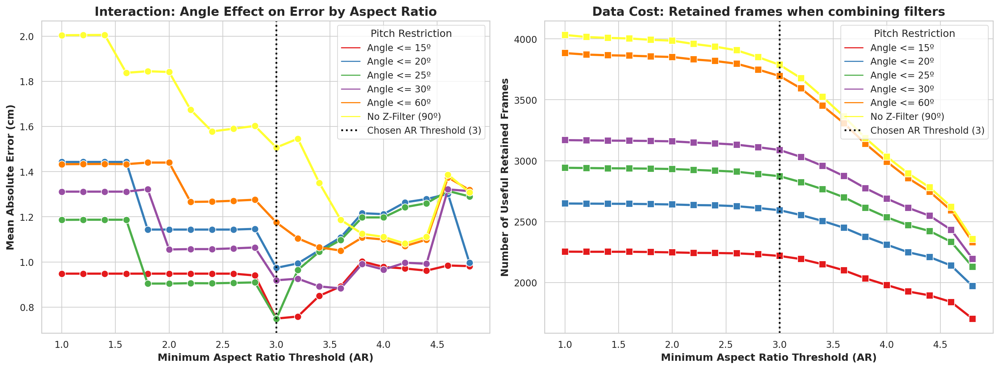

,Angle_Thr,AR_Thr,Error_cm,Frames,Tracks
0,Angle <= 15º,1.0,0.948286,2254,60
1,Angle <= 15º,1.2,0.948286,2253,60
2,Angle <= 15º,1.4,0.948286,2253,60
3,Angle <= 15º,1.6,0.948286,2253,60
4,Angle <= 15º,1.8,0.948286,2251,60
...,...,...,...,...,...
115,No Z-Filter (90º),4.0,1.111177,3033,74
116,No Z-Filter (90º),4.2,1.081445,2896,64
117,No Z-Filter (90º),4.4,1.111685,2781,59
118,No Z-Filter (90º),4.6,1.386906,2622,54


In [15]:
df_base =df_raw_agg_pool[
        # (df_raw['is_3D_complete'] == True) &
        (df_raw_agg_pool['in_image_borders'] == False) &
        (df_raw_agg_pool['does_overlap'] == False) &
        (df_raw_agg_pool['filtered_length'] > 0)
    ].copy()

rutils.plot_thresholds_interaction(df_base)

Calculating interaction between Aspect Ratio and Angle...


Evaluating Angles: 100%|██████████| 6/6 [00:01<00:00,  3.90it/s]


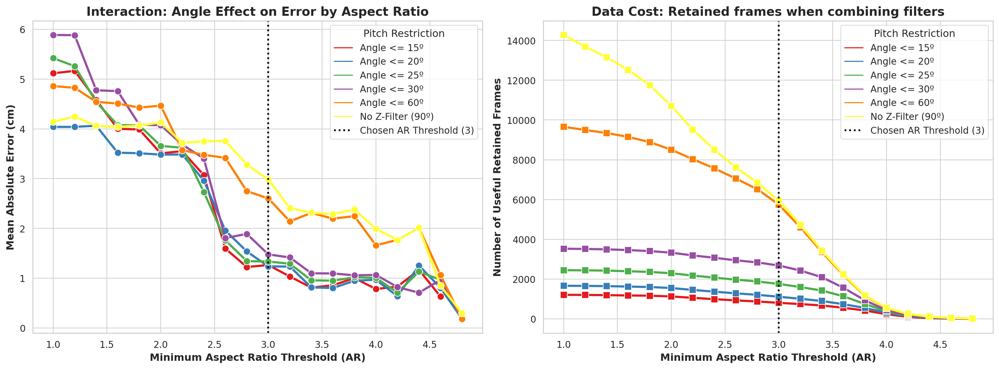

,Angle_Thr,AR_Thr,Error_cm,Frames,Tracks
0,Angle <= 15º,1.0,5.116553,1205,29
1,Angle <= 15º,1.2,5.163928,1200,29
2,Angle <= 15º,1.4,4.581759,1191,29
3,Angle <= 15º,1.6,4.000187,1174,28
4,Angle <= 15º,1.8,3.988311,1162,28
...,...,...,...,...,...
115,No Z-Filter (90º),4.0,1.990269,552,19
116,No Z-Filter (90º),4.2,1.768840,245,10
117,No Z-Filter (90º),4.4,2.012239,106,7
118,No Z-Filter (90º),4.6,0.846888,43,3


In [16]:
df_base =df_raw_agg_2025_08_21[
        # (df_raw['is_3D_complete'] == True) &
        (df_raw_agg_2025_08_21['in_image_borders'] == False) &
        (df_raw_agg_2025_08_21['does_overlap'] == False) &
        (df_raw_agg_2025_08_21['filtered_length'] > 0)
    ].copy()

rutils.plot_thresholds_interaction(df_base)

In [ ]:
df_raw_agg_2025_08_21

,video_day,source_folder,frame_id,class_name,object_id,track_id,is_3D_complete,in_image_borders,does_overlap,is_front_fish,...,fish_direction,elevation_deg,azimuth_deg,raw_length,filtered_length,spine_length,gt,abs_error_cm,rel_error_%,fish_dist_from_camera
0,12_09_03,2025_08_21,frame_0,0,255,1,-1,False,False,True,...,NaN,67.619721,37.106544,-1.0,0.322840,0.316668,29.1,3.184030,11.709446,1.663082
1,12_09_03,2025_08_21,frame_1,0,255,1,-1,False,False,True,...,NaN,66.080659,37.133779,-1.0,0.308119,0.328139,29.1,1.711855,6.615414,1.659265
2,12_09_03,2025_08_21,frame_2,0,255,1,-1,False,False,True,...,NaN,50.109826,25.106295,-1.0,0.249701,0.228324,29.1,4.129863,13.598142,1.693085
3,12_09_03,2025_08_21,frame_3,0,255,1,-1,False,False,True,...,NaN,58.247246,14.057908,-1.0,0.300613,0.282332,29.1,0.961328,4.018435,1.678158
4,12_09_03,2025_08_21,frame_4,0,255,1,-1,False,False,True,...,NaN,44.696387,13.541004,-1.0,0.257552,0.244369,29.1,3.344761,10.881526,1.710066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15498,12_07_31,2025_08_21,frame_662,0,255,1,-1,False,False,True,...,NaN,79.294583,-50.546886,-1.0,0.340876,0.338881,29.1,4.987628,17.950270,1.795066
15499,12_07_31,2025_08_21,frame_663,0,255,1,-1,False,False,True,...,NaN,76.837679,-46.298834,-1.0,0.350149,0.356385,29.1,5.914872,21.158726,1.786328
15500,12_07_31,2025_08_21,frame_664,0,255,1,-1,False,False,True,...,NaN,77.656910,-44.845737,-1.0,0.344245,0.336567,29.1,5.324532,19.116027,1.783682
15501,12_07_31,2025_08_21,frame_665,0,255,1,-1,False,False,True,...,NaN,78.717863,-45.519965,-1.0,0.329868,0.334901,29.1,3.886777,14.141098,1.792683
